<a href="https://colab.research.google.com/github/CompClimate/extremeWaterLeverForecastingHwy37/blob/main/hwy37_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Top

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import glob
import numpy as np
from datetime import datetime
import seaborn as sns

# TrainingSet

In [ ]:
path = '/content/drive/MyDrive/hwy37/Input_trainingset.csv'
df = pd.read_csv(path)

tide_path = '/content/drive/MyDrive/hwy37/export_tide.csv'
tide_df = pd.read_csv(tide_path)

cool_array = np.asarray(df)
timeframe = 36000 #the last 36458-timeframe updates

In [ ]:
df.tail(10)

,datetime,AtmPres,Gnoss_onshorewind,napa_flow_cfs,ocean_onshorewind
49616,2024-10-23 08:00:00+00:00,1019.8,-1.520178,0.0,-5.142301
49617,2024-10-23 09:00:00+00:00,1019.5,-1.882315,0.0,-5.362311
49618,2024-10-23 10:00:00+00:00,1019.6,-1.934049,0.0,-3.830222
49619,2024-10-23 11:00:00+00:00,1019.2,-1.934049,0.0,-5.362311
49620,2024-10-23 12:00:00+00:00,1019.3,-2.058172,0.0,-4.330127
49621,2024-10-23 13:00:00+00:00,1019.1,-1.934049,0.0,-3.064178
49622,2024-10-23 14:00:00+00:00,1019.5,-1.934049,0.0,-3.856726
49623,2024-10-23 15:00:00+00:00,1019.8,-1.934049,0.0,-4.596267
49624,2024-10-23 16:00:00+00:00,1020.4,-1.795064,0.0,-4.499513
49625,2024-10-23 17:00:00+00:00,1020.9,-0.213593,0.0,-5.362311


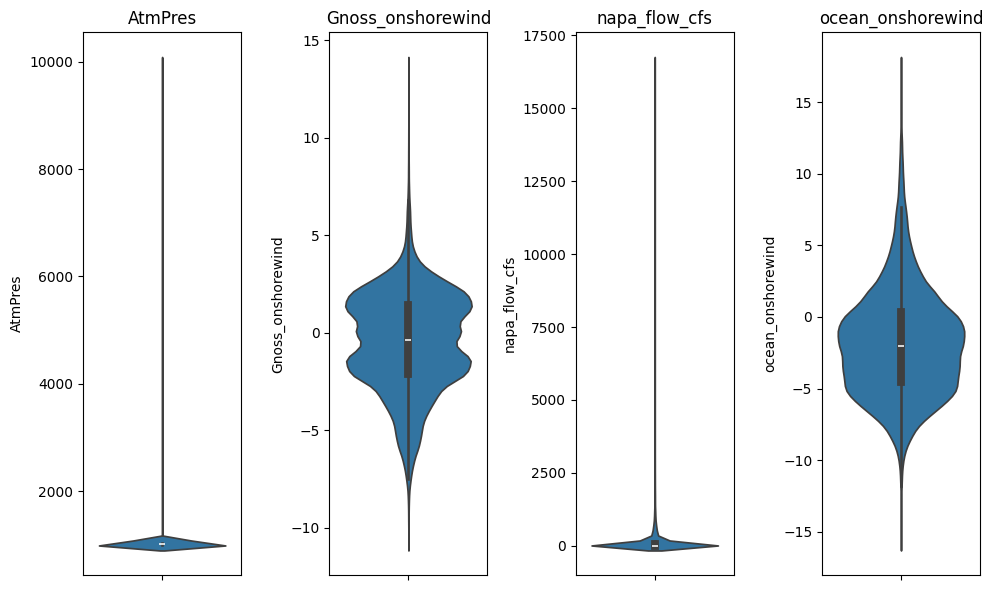

In [ ]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 4, 1)
sns.violinplot(y=df.iloc[:, 1])
plt.title(df.columns[1])

plt.subplot(1, 4, 2)
sns.violinplot(y=df.iloc[:, 2])
plt.title(df.columns[2])

plt.subplot(1, 4, 3)
sns.violinplot(y=df.iloc[:, 3])
plt.title(df.columns[3])

plt.subplot(1, 4, 4)
sns.violinplot(y=df.iloc[:, 4])
plt.title(df.columns[4])

plt.tight_layout()
plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


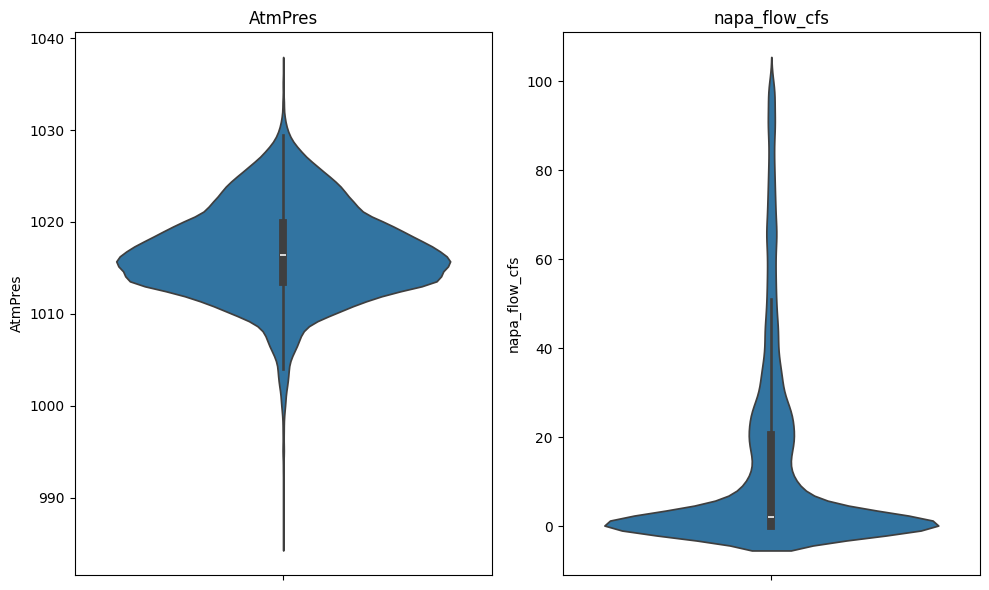

In [ ]:
# prompt: make separate violin plots for columns 1 and 3 of df while removing any values above 2000

from google.colab import drive
import matplotlib.pyplot as plt
import pandas as pd
import glob
import numpy as np
from datetime import datetime
import seaborn as sns
# Mount Google Drive
drive.mount('/content/drive')
# # TrainingSet
path = '/content/drive/MyDrive/hwy37/Input_trainingset.csv'
df = pd.read_csv(path)

# Create separate violin plots for columns 1 and 3, removing values above 2000
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=df.iloc[:, 1][df.iloc[:, 1] <= 1200])
plt.title(df.columns[1])

plt.subplot(1, 2, 2)
sns.violinplot(y=df.iloc[:, 3][df.iloc[:, 3] <= 100])
plt.title(df.columns[3])

plt.tight_layout()
plt.show()


In [ ]:
# prompt: make a one class svm to remove the outliers from the AtmPres column of df

from sklearn.svm import OneClassSVM
from sklearn.preprocessing import StandardScaler

# Extract the AtmPres column
atm_pres = df['AtmPres'].values.reshape(-1, 1)
napa_flow_cfs = df['napa_flow_cfs'].values.reshape(-1, 1)

# Scale the data
scaler = StandardScaler()
atm_pres_scaled = scaler.fit_transform(atm_pres)
napa_flow_cfs_scaled = scaler.fit_transform(napa_flow_cfs)

# Train the One-Class SVM model on atmpres
model = OneClassSVM(nu=0.05, kernel='rbf', gamma='scale')  # Adjust nu and other parameters as needed
model.fit(atm_pres_scaled)

# Predict outliers
predictions = model.predict(atm_pres_scaled)

# Identify outliers
outliers = df[predictions == -1]

# Remove outliers from the original DataFrame
df_no_outliers = df[predictions == 1]

# Print the number of outliers removed
print("Number of outliers removed:", len(outliers))

# Optionally, you can inspect the outliers
print("Outliers:")
print(outliers)

Number of outliers removed: 2446
Outliers:
                        datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
88     2019-01-05 12:00:00+00:00   1005.7           3.240207           22.0   
89     2019-01-05 13:00:00+00:00   1004.4           2.323403           22.5   
90     2019-01-05 14:00:00+00:00   1003.1           2.668552           23.1   
91     2019-01-05 15:00:00+00:00   1002.0           2.124532           23.7   
92     2019-01-05 16:00:00+00:00   1002.3           2.948988           23.7   
...                          ...      ...                ...            ...   
44783  2024-04-04 23:00:00+00:00   1006.4          -5.067260          205.0   
44827  2024-04-06 19:00:00+00:00   1026.9          -4.560534          167.0   
44828  2024-04-06 20:00:00+00:00   1026.9          -4.729954          165.0   
44829  2024-04-06 21:00:00+00:00   1027.0          -0.625446          167.0   
44968  2024-04-12 16:00:00+00:00   1006.4          -1.653709          138.0   

       o

In [ ]:
# prompt: remove all the outliers from the napa_flow_cfs column in df_no_outliers

# Extract the napa_flow_cfs column
napa_flow_cfs = df_no_outliers['napa_flow_cfs'].values.reshape(-1, 1)

# Scale the data
scaler = StandardScaler()
napa_flow_cfs_scaled = scaler.fit_transform(napa_flow_cfs)

# Train the One-Class SVM model on napa_flow_cfs
model = OneClassSVM(nu=0.05, kernel='rbf', gamma='scale')  # Adjust nu and other parameters as needed
model.fit(napa_flow_cfs_scaled)

# Predict outliers
predictions = model.predict(napa_flow_cfs_scaled)

# Identify outliers
outliers_napa_flow = df_no_outliers[predictions == -1]

# Remove outliers from the df_no_outliers DataFrame
df_no_outliers = df_no_outliers[predictions == 1]

# Print the number of outliers removed
print("Number of outliers removed from napa_flow_cfs:", len(outliers_napa_flow))

# Optionally, you can inspect the outliers
print("Outliers from napa_flow_cfs:")
print(outliers_napa_flow)


Number of outliers removed from napa_flow_cfs: 1686
Outliers from napa_flow_cfs:
                        datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
129    2019-01-07 05:00:00+00:00   1008.5          -0.829462         1660.0   
130    2019-01-07 06:00:00+00:00   1010.3          -4.780458         2100.0   
131    2019-01-07 07:00:00+00:00   1011.8          -2.611238         2510.0   
132    2019-01-07 08:00:00+00:00   1013.7           0.588126         2950.0   
133    2019-01-07 09:00:00+00:00   1015.2          -0.137725         3330.0   
...                          ...      ...                ...            ...   
44085  2024-03-06 21:00:00+00:00   1012.5          -2.309287          659.0   
44086  2024-03-06 22:00:00+00:00   1012.1          -2.759140          654.0   
44087  2024-03-06 23:00:00+00:00   1012.1          -1.997106          652.0   
44088  2024-03-07 00:00:00+00:00   1011.8          -0.879920          646.0   
44089  2024-03-07 01:00:00+00:00   1011.6         

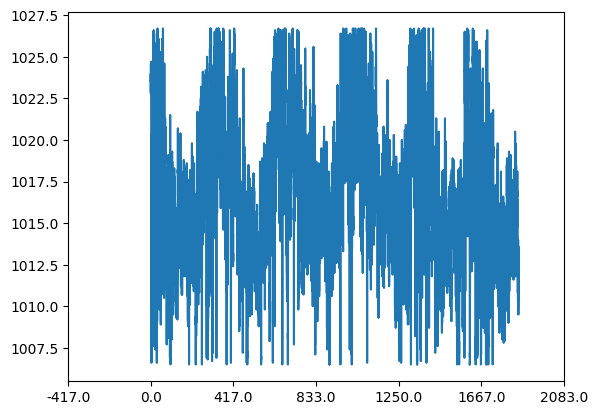

In [ ]:
testdf = np.asarray(df_no_outliers)
plt.plot(testdf[:, 1])
plt.xticks(plt.xticks()[0], np.round(plt.xticks()[0] / 24))
plt.show()

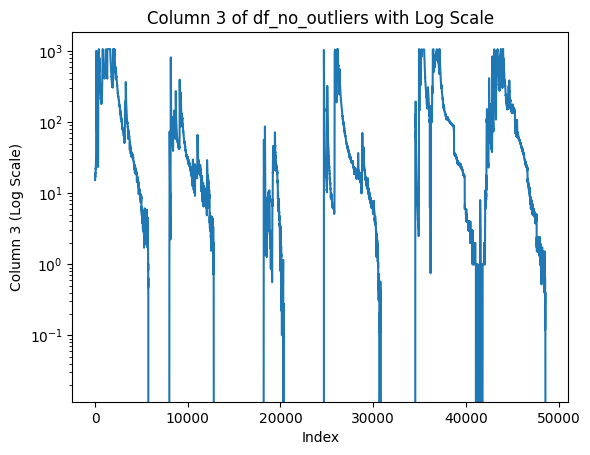

In [ ]:
# prompt: plot column 3 of df_no_outliers using a log scale

import matplotlib.pyplot as plt

plt.plot(df_no_outliers.iloc[:, 3])
plt.yscale('log')
plt.xlabel('Index')
plt.ylabel('Column 3 (Log Scale)')
plt.title('Column 3 of df_no_outliers with Log Scale')
plt.show()


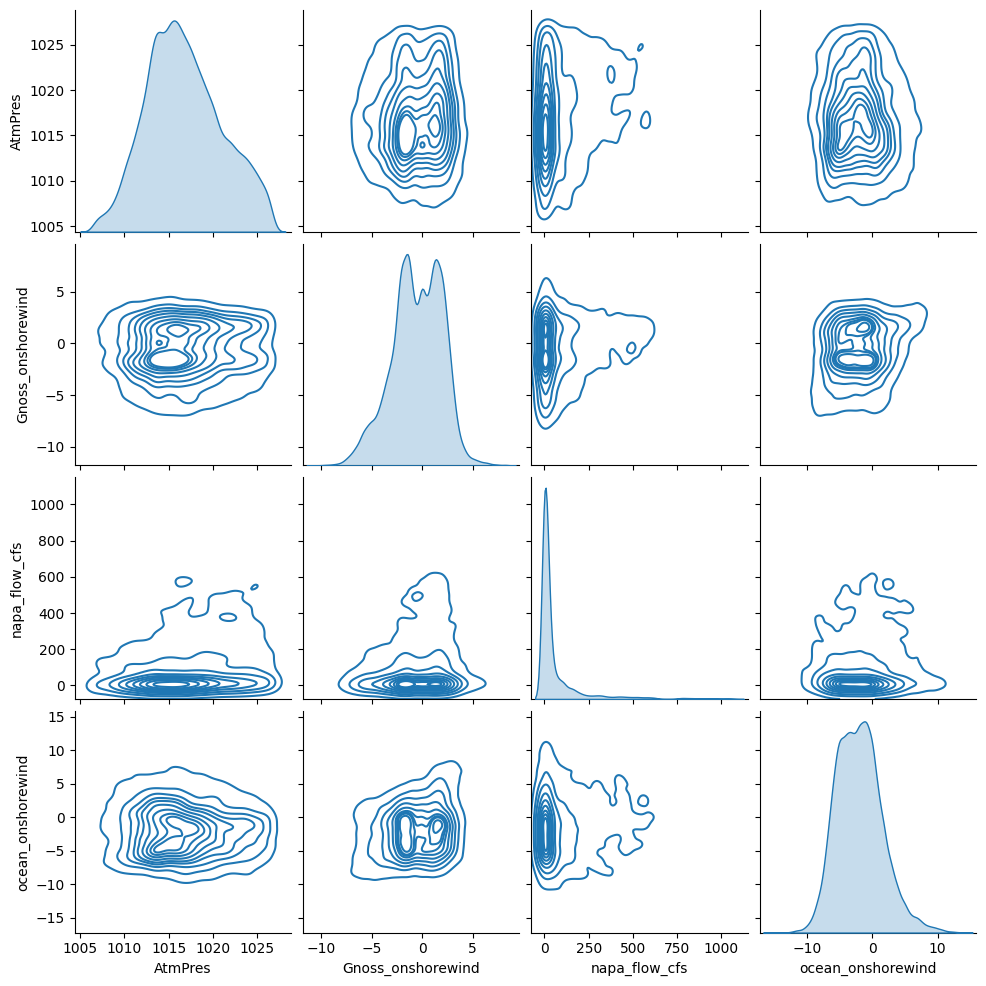

In [ ]:
sns.pairplot(df_no_outliers, kind='kde')

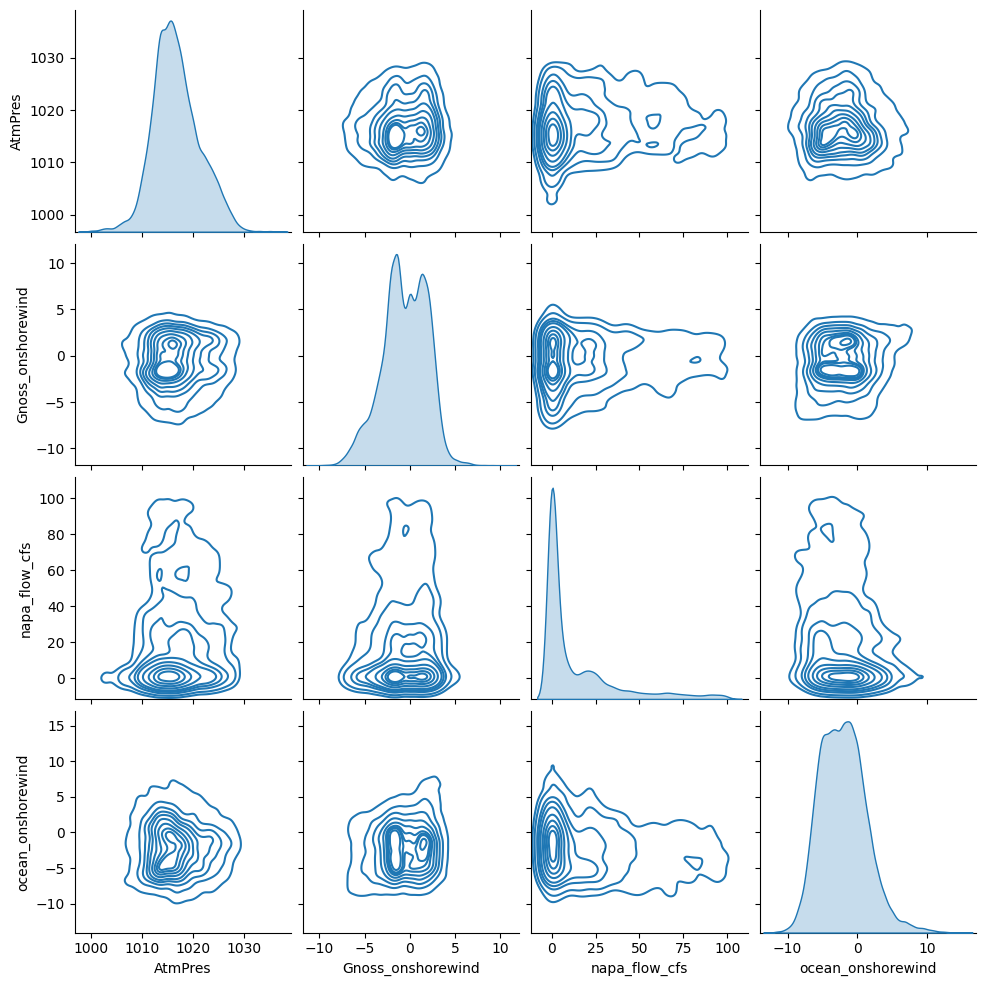

In [ ]:
# Remove outliers from columns 1 and 3
df_filtered = df[(df.iloc[:, 1] <= 1200) & (df.iloc[:, 3] <= 100)]

# Create a pairplot using seaborn
sns.pairplot(df_filtered, kind='kde')
plt.show()


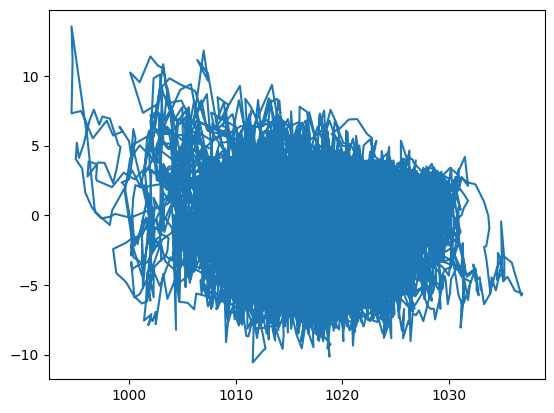

In [ ]:
#use this with any index except 0 (datetime) indexes 1-4
cols = df.columns
figure, ax1 = plt.subplots()
ax1.plot(df[cols[1]],df[cols[2]])

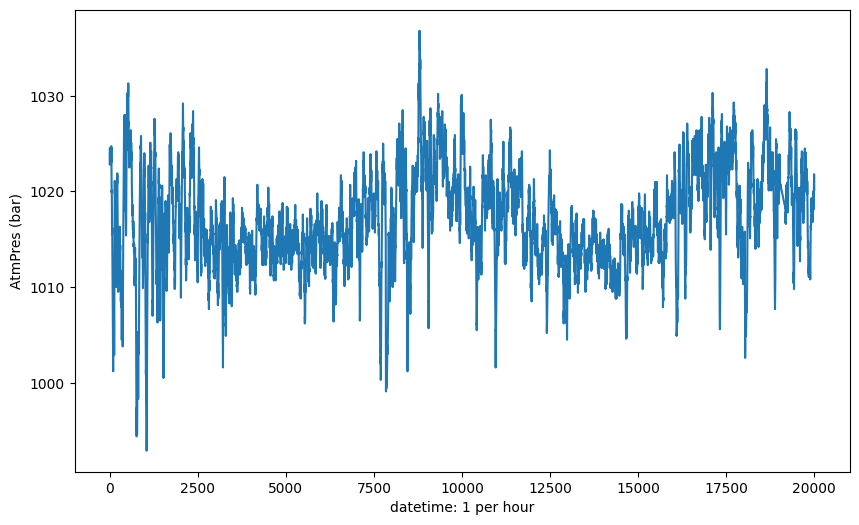

In [ ]:
# prompt: plot cool array column 1 for all values below 2000

plt.figure(figsize=(10, 6))
plt.plot(cool_array[:, 1][cool_array[:, 1] < 1500][0:20000])
plt.xlabel('datetime: 1 per hour')
plt.ylabel('AtmPres (bar)')
plt.show()


In [ ]:
import plotly.graph_objects as go
from scipy.signal import savgol_filter

# Apply Savitzky-Golay filter to smooth the 'Gnoss_onshorewind' column
smoothed_atmpres = savgol_filter(df['AtmPres'][df['AtmPres'] <1500][30000:30336], window_length=51, polyorder=3)

# Create a Plotly figure
fig = go.Figure()

# Add the original data as a trace
fig.add_trace(go.Scatter(x=df.index, y=df['AtmPres'][df['AtmPres'] <1500][30000:30336], mode='lines', name='Original Data'))

# Add the smoothed data as a trace
fig.add_trace(go.Scatter(x=df.index, y=smoothed_atmpres, mode='lines', name='Smoothed Data'))

# Set the layout of the plot
fig.update_layout(title='Smoothed AtmPres', xaxis_title='Index', yaxis_title='AtmPres')

# Show the plot
fig.show()

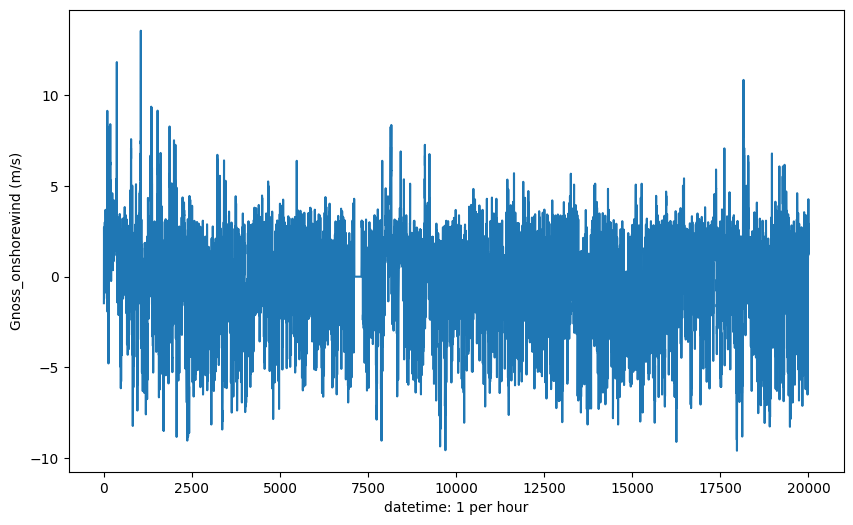

In [ ]:
plt.figure(figsize=(10, 6))
plt.xlabel('datetime: 1 per hour')
plt.ylabel('Gnoss_onshorewind (m/s)')
plt.plot(cool_array[:,2][0:20000])

In [ ]:
# prompt: generate a smoothed plot of Gnoss_onshorewind in df using a Savitzky-Golay filter from plotly

import plotly.graph_objects as go
from scipy.signal import savgol_filter

# Apply Savitzky-Golay filter to smooth the 'Gnoss_onshorewind' column
smoothed_gnoss_onshorewind = savgol_filter(df['Gnoss_onshorewind'], window_length=51, polyorder=3)

# Create a Plotly figure
fig = go.Figure()

# Add the original data as a trace
fig.add_trace(go.Scatter(x=df.index, y=df['Gnoss_onshorewind'], mode='lines', name='Original Data'))

# Add the smoothed data as a trace
fig.add_trace(go.Scatter(x=df.index, y=smoothed_gnoss_onshorewind, mode='lines', name='Smoothed Data'))

# Set the layout of the plot
fig.update_layout(title='Smoothed Gnoss_onshorewind', xaxis_title='Index', yaxis_title='Gnoss_onshorewind')

# Show the plot
fig.show()


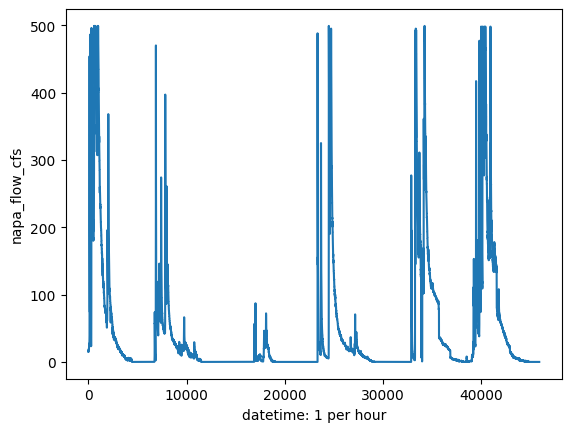

In [ ]:
plt.xlabel('datetime: 1 per hour')
plt.ylabel('napa_flow_cfs')
plt.plot(cool_array[:,3][cool_array[:,3] <500]) #[cool_array[:,3] <500]

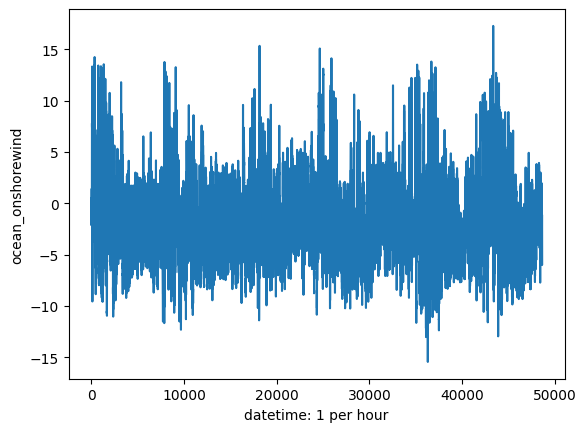

In [ ]:
plt.xlabel('datetime: 1 per hour')
plt.ylabel('ocean_onshorewind')
plt.plot(cool_array[:,4])

In [ ]:
import plotly.graph_objects as go
from scipy.signal import savgol_filter

# Apply Savitzky-Golay filter to smooth the 'Gnoss_onshorewind' column
smoothed_gnoss_onshorewind = savgol_filter(df['ocean_onshorewind'], window_length=51, polyorder=3)

# Create a Plotly figure
fig = go.Figure()

# Add the original data as a trace
fig.add_trace(go.Scatter(x=df.index, y=df['ocean_onshorewind'], mode='lines', name='Original Data'))

# Add the smoothed data as a trace
fig.add_trace(go.Scatter(x=df.index, y=smoothed_gnoss_onshorewind, mode='lines', name='Smoothed Data'))

# Set the layout of the plot
fig.update_layout(title='Smoothed Ocean_onshorewind', xaxis_title='Index', yaxis_title='ocean_onshorewind')

# Show the plot
fig.show()

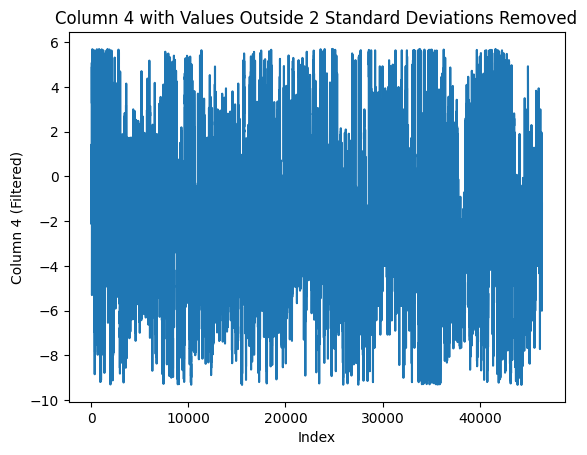

In [ ]:
# prompt: plot cool array column 4 while removing all points two standard deviations from the mean

import matplotlib.pyplot as plt

# Calculate the mean and standard deviation of cool_array column 4
mean_col4 = np.mean(cool_array[:, 4])
std_col4 = np.std(cool_array[:, 4])

# Remove values outside of two standard deviations from the mean
filtered_col4 = cool_array[:, 4][(cool_array[:, 4] > mean_col4 - 2 * std_col4) & (cool_array[:, 4] < mean_col4 + 2 * std_col4)]

# Plot the filtered data
plt.plot(filtered_col4)
plt.xlabel('Index')
plt.ylabel('Column 4 (Filtered)')
plt.title('Column 4 with Values Outside 2 Standard Deviations Removed')
plt.show()


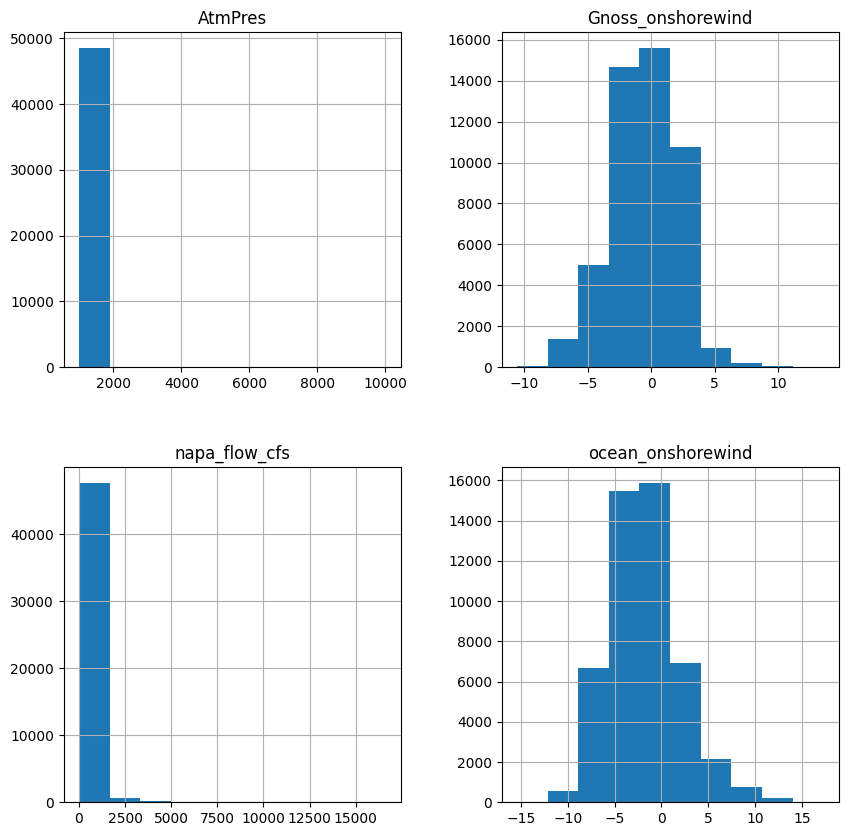

In [ ]:
# prompt: make a histogram of the df columns

df.hist(figsize=(10, 10))
plt.show()


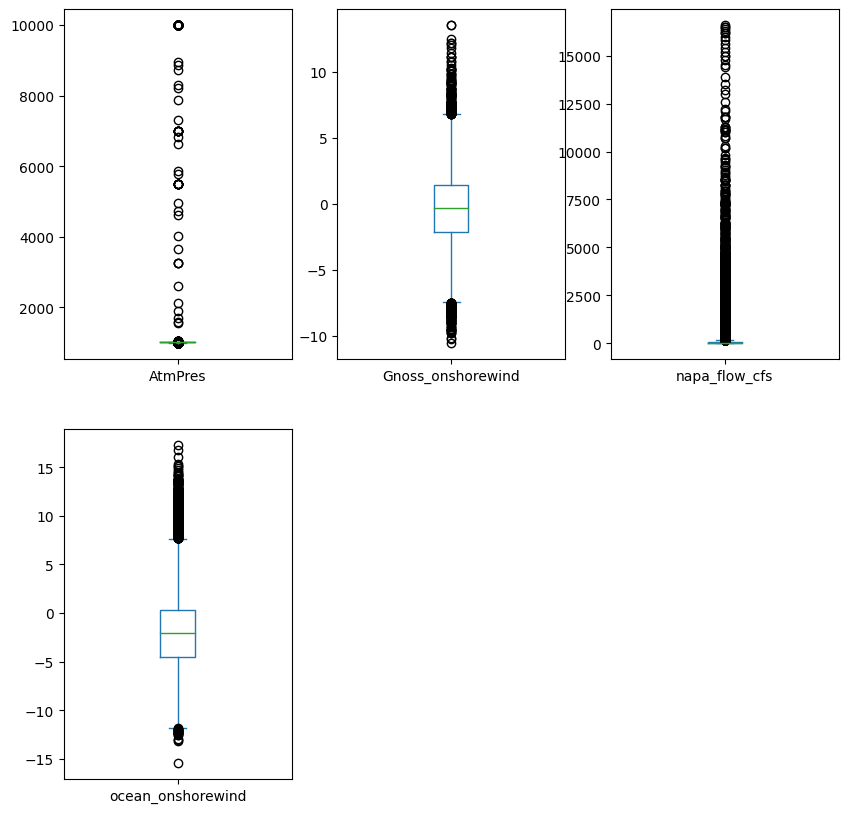

In [ ]:
# prompt: make separate box plots of the columns in df

df.plot(kind='box', subplots=True, layout=(2,3), figsize=(10, 10))
plt.show()


# EDA and Data Loading

## Novato

In [ ]:
path_nstage = '/content/drive/MyDrive/hwy37/novato_stage_observed.csv'
novato_stage = pd.read_csv(path_nstage)
n_stage = np.asarray(novato_stage)

path_n1hr = '/content/drive/MyDrive/hwy37/novato_wl_1hr_up.csv'
novato_stage_1hr = pd.read_csv(path_n1hr)
n_1hr = np.asarray(novato_stage_1hr)

In [ ]:
import plotly.graph_objects as go
from scipy.signal import savgol_filter

# Apply Savitzky-Golay filter to smooth the 'Gnoss_onshorewind' column
smoothed_stage = savgol_filter(novato_stage_1hr['stage_m'][30000:30168], window_length=10, polyorder=3)

# Create a Plotly figure
fig = go.Figure()

# Add the original data as a trace
fig.add_trace(go.Scatter(x=novato_stage_1hr.index, y=novato_stage_1hr['stage_m'][30000:30168], mode='lines', name='Original Data'))

# Add the smoothed data as a trace
fig.add_trace(go.Scatter(x=novato_stage_1hr.index, y=smoothed_stage, mode='lines', name='Smoothed Data'))

# Set the layout of the plot
fig.update_layout(title='Smoothed Stage', xaxis_title='Index', yaxis_title='stage_m')

# Show the plot
fig.show()

In [ ]:
# Convert the datetime columns to datetime objects if they are not already
df['datetime'] = pd.to_datetime(df['datetime'])
novato_stage_1hr['datetime'] = pd.to_datetime(novato_stage_1hr['Unnamed: 0'])

# Merge the DataFrames based on the 'datetime' column
merged_df = pd.merge(df, novato_stage_1hr[['datetime', 'stage_m']], on='datetime', how='left')

# Now, merged_df will contain the 'stage_m' column from novato_stage_1hr for all shared datetime entries.
# If you want to fill NaN values (entries without matching datetimes) with a specific value, you can use:
# merged_df['stage_m'].fillna(0, inplace=True)

print(merged_df)


                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
0     2019-01-01 20:00:00+00:00   1024.5      -1.461785e+00           15.4   
1     2019-01-01 21:00:00+00:00   1023.6       8.027076e-01           15.9   
2     2019-01-01 22:00:00+00:00   1023.2      -8.927183e-01           15.9   
3     2019-01-01 23:00:00+00:00   1022.8       2.716258e+00           15.9   
4     2019-01-02 00:00:00+00:00   1023.5       2.005033e+00           15.4   
...                         ...      ...                ...            ...   
48617 2024-09-11 17:00:00+00:00   1012.2       2.728959e+00            0.0   
48618 2024-09-11 18:00:00+00:00   1012.4       2.533630e+00            0.0   
48619 2024-09-11 19:00:00+00:00   1012.8      -1.759841e+00            0.0   
48620 2024-09-11 20:00:00+00:00   1012.5       8.821869e-16            0.0   
48621 2024-09-11 21:00:00+00:00   1012.5       1.518941e+00            0.0   

       ocean_onshorewind   stage_m  
0              -0.204600  

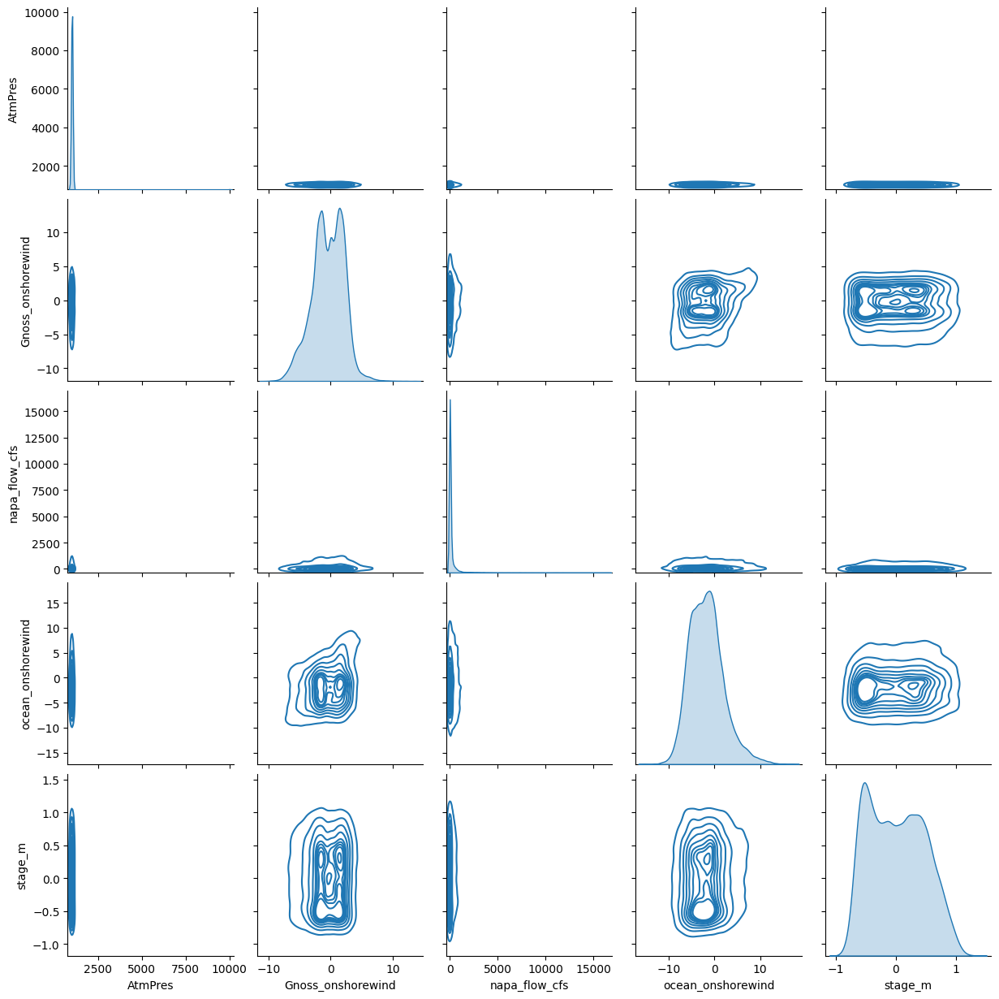

In [ ]:
sns.pairplot(merged_df, kind='kde')

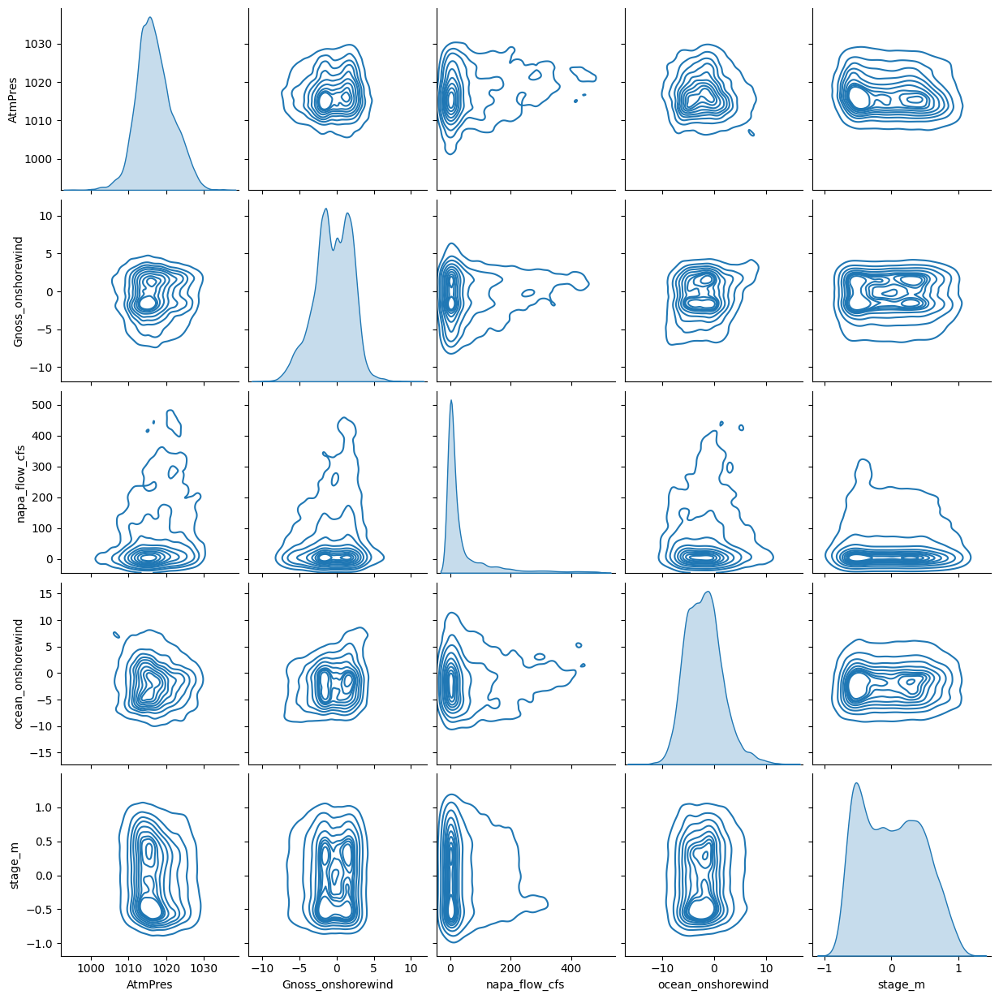

In [ ]:
merged_df_filtered = merged_df[(merged_df.iloc[:, 1] <= 1200) & (merged_df.iloc[:, 3] <= 500)]
sns.pairplot(merged_df_filtered, kind='kde')

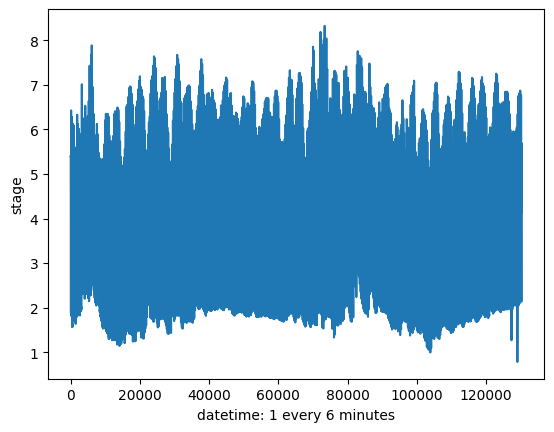

In [ ]:
plt.xlabel('datetime: 1 every 6 minutes')
plt.ylabel('stage')
plt.plot(n_stage[:,2])

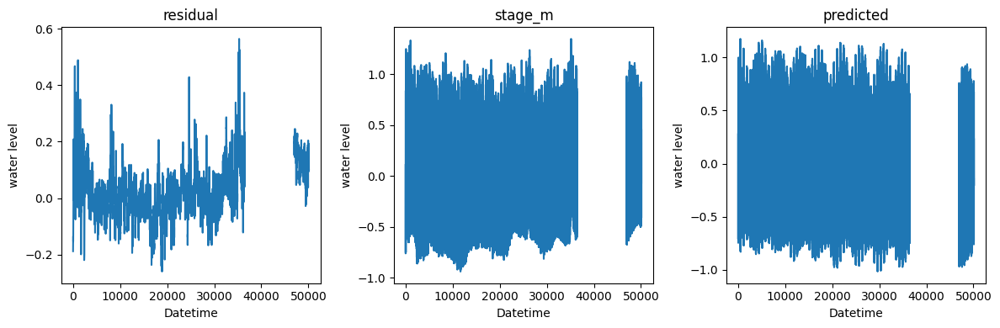

In [ ]:
# prompt: make individual plots for columns 1 2 and 3 of n_1hr

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(n_1hr[:, 1])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('residual')

plt.subplot(1, 3, 2)
plt.plot(n_1hr[:, 2])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('stage_m')

plt.subplot(1, 3, 3)
plt.plot(n_1hr[:, 3])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('predicted')

plt.tight_layout()
plt.show()


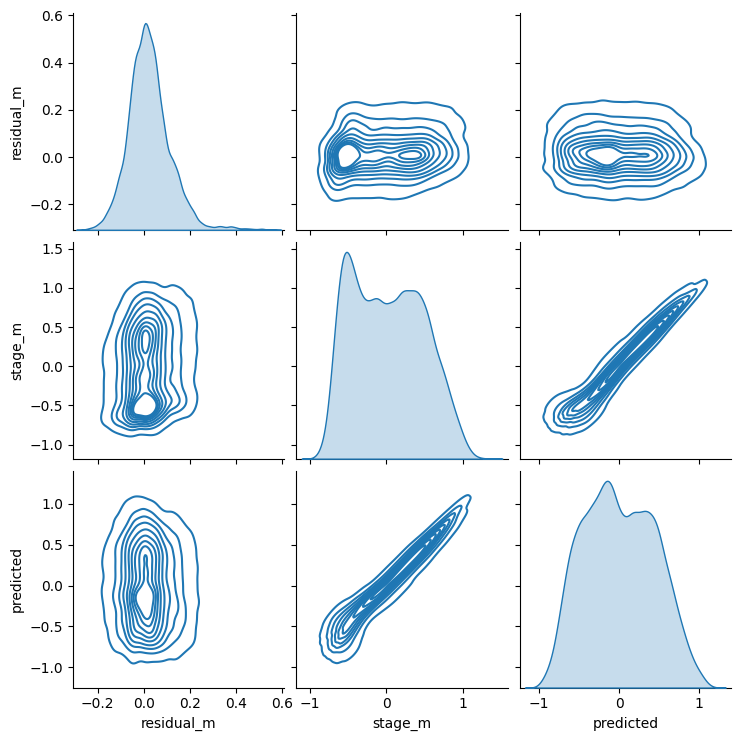

In [ ]:
sns.pairplot(novato_stage_1hr, kind='kde')

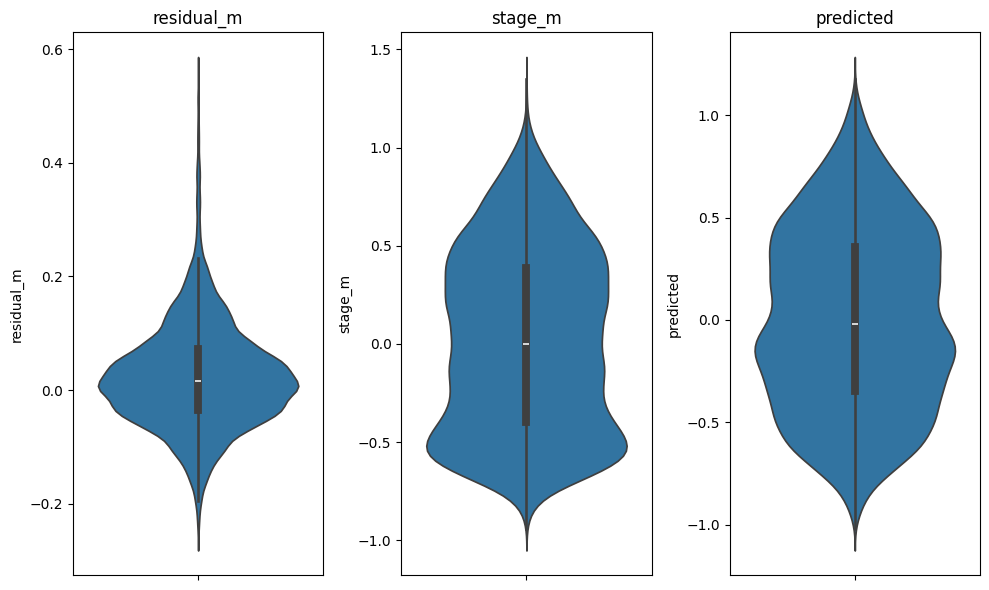

In [ ]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
sns.violinplot(y=novato_stage_1hr.iloc[:, 1])
plt.title(novato_stage_1hr.columns[1])

plt.subplot(1, 3, 2)
sns.violinplot(y=novato_stage_1hr.iloc[:, 2])
plt.title(novato_stage_1hr.columns[2])

plt.subplot(1, 3, 3)
sns.violinplot(y=novato_stage_1hr.iloc[:, 3])
plt.title(novato_stage_1hr.columns[3])

plt.tight_layout()
plt.show()

## Petaluma

In [ ]:
path_pstage = '/content/drive/MyDrive/hwy37/petaluma_wl_new.csv'
pet_stage = pd.read_csv(path_pstage)
p_stage = np.asarray(pet_stage)

path_p1hr = '/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv'
pet_stage_1hr = pd.read_csv(path_p1hr)
p_1hr = np.asarray(pet_stage_1hr)

In [ ]:
# prompt: add the stage_m column of Novato_stage_1hr onto df for all shared entries in the zero column of both

# Convert the datetime columns to datetime objects if they are not already
df['datetime'] = pd.to_datetime(df['datetime'])
pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])

# Merge the DataFrames based on the 'datetime' column
merged_df = pd.merge(df, pet_stage_1hr[['datetime', 'residual_m']], on='datetime', how='left')

# Now, merged_df will contain the 'stage_m' column from novato_stage_1hr for all shared datetime entries.
# If you want to fill NaN values (entries without matching datetimes) with a specific value, you can use:
# merged_df['stage_m'].fillna(0, inplace=True)

print(merged_df)


                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
0     2019-01-01 20:00:00+00:00   1024.5          -1.461785           15.4   
1     2019-01-01 21:00:00+00:00   1023.6           0.802708           15.9   
2     2019-01-01 22:00:00+00:00   1023.2          -0.892718           15.9   
3     2019-01-01 23:00:00+00:00   1022.8           2.716258           15.9   
4     2019-01-02 00:00:00+00:00   1023.5           2.005033           15.4   
...                         ...      ...                ...            ...   
49621 2024-10-23 13:00:00+00:00   1019.1          -1.934049            0.0   
49622 2024-10-23 14:00:00+00:00   1019.5          -1.934049            0.0   
49623 2024-10-23 15:00:00+00:00   1019.8          -1.934049            0.0   
49624 2024-10-23 16:00:00+00:00   1020.4          -1.795064            0.0   
49625 2024-10-23 17:00:00+00:00   1020.9          -0.213593            0.0   

       ocean_onshorewind  residual_m  
0              -0.204600

In [ ]:
# prompt: remove rows nan in merged_df

merged_df_no_nan = merged_df.dropna()
print(merged_df_no_nan)


                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
15702 2020-10-17 02:00:00+00:00   1012.6          -0.465921            0.0   
15703 2020-10-17 03:00:00+00:00   1012.7          -0.279986            0.0   
15704 2020-10-17 04:00:00+00:00   1012.8          -0.094051            0.0   
15705 2020-10-17 05:00:00+00:00   1012.5           0.091884            0.0   
15706 2020-10-17 06:00:00+00:00   1012.7           0.277819            0.0   
...                         ...      ...                ...            ...   
48926 2024-09-24 14:00:00+00:00   1007.7           0.423870            0.0   
48927 2024-09-24 15:00:00+00:00   1008.0           0.652108            0.0   
48928 2024-09-24 16:00:00+00:00   1008.4           0.880346            0.0   
48929 2024-09-24 17:00:00+00:00   1008.7           1.108584            0.0   
48930 2024-09-24 18:00:00+00:00   1009.1           1.336822            0.0   

       ocean_onshorewind  residual_m  
15702           0.029669

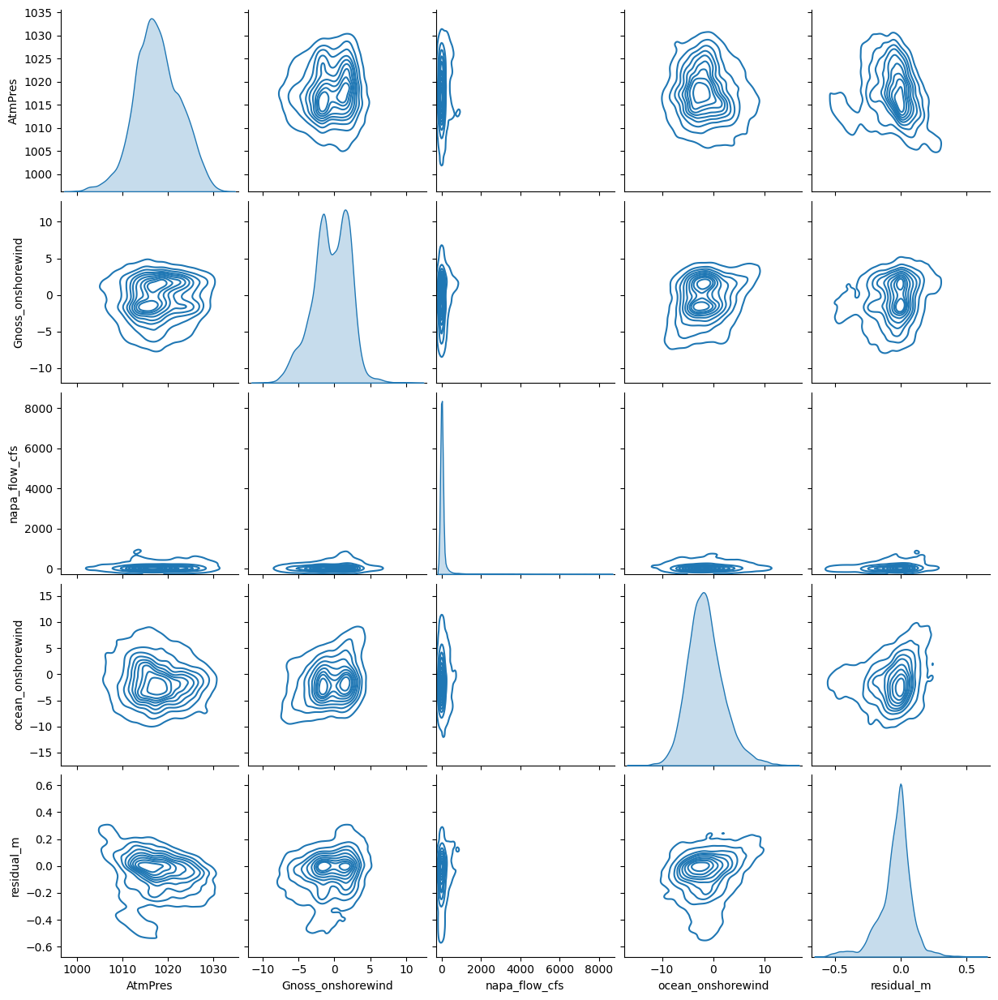

In [ ]:
merged_df_filtered = merged_df_no_nan[(merged_df_no_nan.iloc[:, 1] <= 1200) & (merged_df_no_nan.iloc[:, 3] <= 500)]
sns.pairplot(merged_df_no_nan, kind='kde')

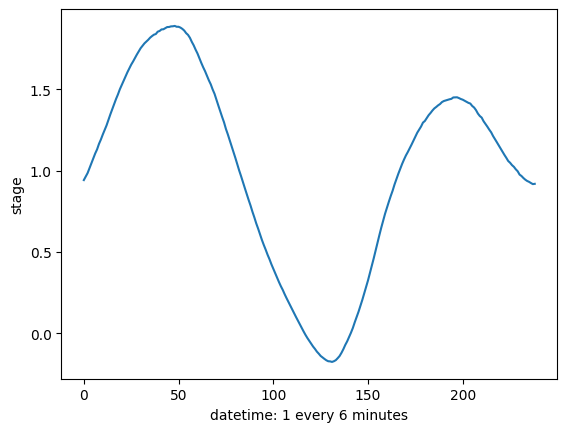

In [ ]:
plt.xlabel('datetime: 1 every 6 minutes')
plt.ylabel('stage')
plt.plot(p_stage[:,1])

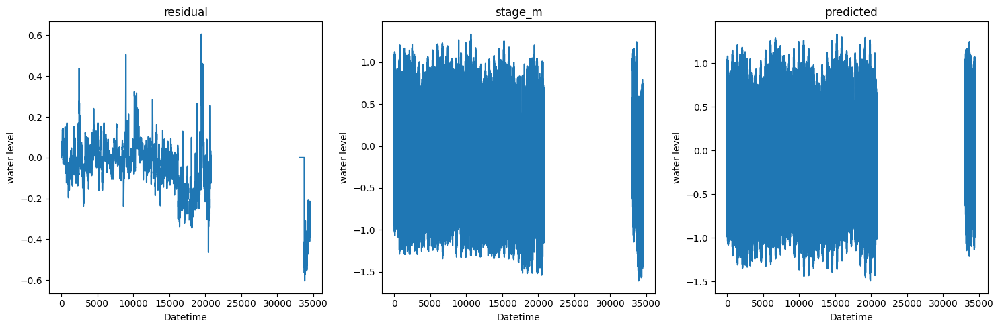

In [ ]:
# prompt: make individual plots of columns 1, 2, and 3 of p_1hr

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(p_1hr[:, 1])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('residual')

plt.subplot(1, 3, 2)
plt.plot(p_1hr[:, 2])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('stage_m')

plt.subplot(1, 3, 3)
plt.plot(p_1hr[:, 3])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('predicted')

plt.tight_layout()
plt.show()


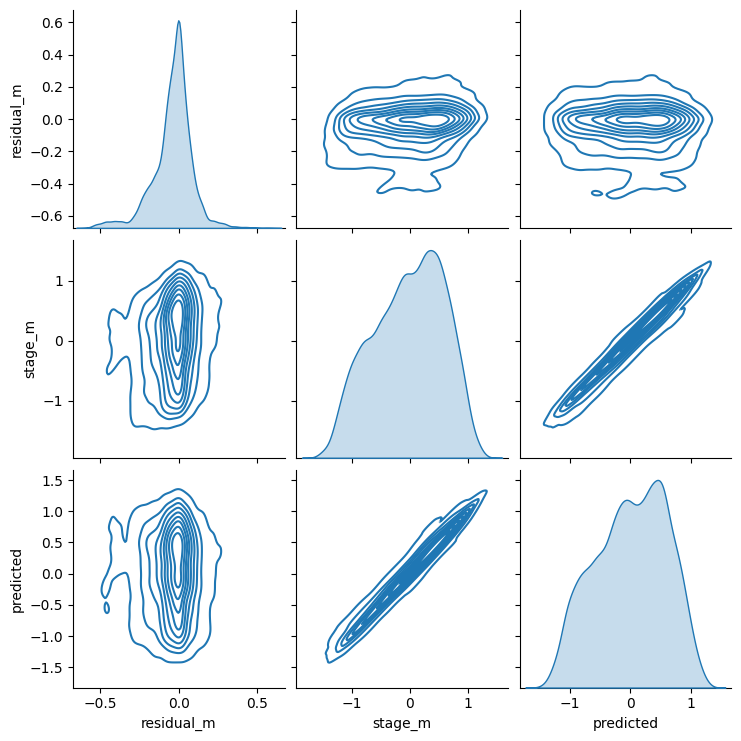

In [ ]:
sns.pairplot(pet_stage_1hr, kind='kde')

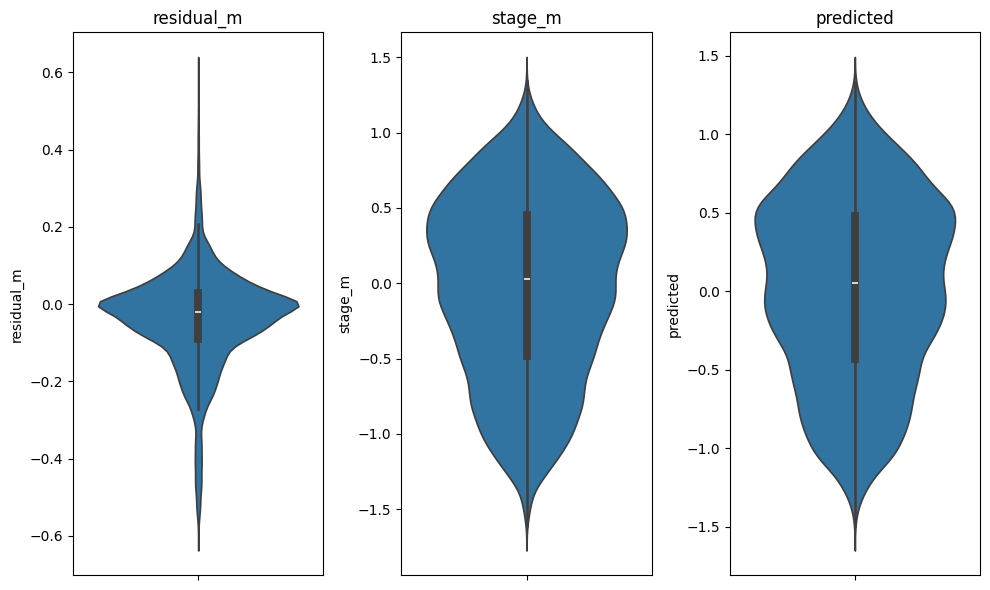

In [ ]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
sns.violinplot(y=pet_stage_1hr.iloc[:, 1])
plt.title(pet_stage_1hr.columns[1])

plt.subplot(1, 3, 2)
sns.violinplot(y=pet_stage_1hr.iloc[:, 2])
plt.title(pet_stage_1hr.columns[2])

plt.subplot(1, 3, 3)
sns.violinplot(y=pet_stage_1hr.iloc[:, 3])
plt.title(pet_stage_1hr.columns[3])

plt.tight_layout()
plt.show()

## Rowland

In [ ]:
path_rstage = '/content/drive/MyDrive/hwy37/rowland_stage_observed.csv'
row_stage = pd.read_csv(path_rstage)
r_stage = np.asarray(row_stage)

path_r1hr = '/content/drive/MyDrive/hwy37/rowland_wl_1hr.csv'
row_stage_1hr = pd.read_csv(path_r1hr)
r_1hr = np.asarray(row_stage_1hr)

In [ ]:
# prompt: add the stage_m column of Novato_stage_1hr onto df for all shared entries in the zero column of both

# Convert the datetime columns to datetime objects if they are not already
df['datetime'] = pd.to_datetime(df['datetime'])
row_stage_1hr['datetime'] = pd.to_datetime(row_stage_1hr['Unnamed: 0'])

# Merge the DataFrames based on the 'datetime' column
merged_df = pd.merge(df, row_stage_1hr[['datetime', 'stage_m']], on='datetime', how='left')

# Now, merged_df will contain the 'stage_m' column from novato_stage_1hr for all shared datetime entries.
# If you want to fill NaN values (entries without matching datetimes) with a specific value, you can use:
# merged_df['stage_m'].fillna(0, inplace=True)

print(merged_df)

merged_df_no_nan = merged_df.dropna()
print(merged_df_no_nan)

                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
0     2019-01-01 20:00:00+00:00   1024.5      -1.461785e+00           15.4   
1     2019-01-01 21:00:00+00:00   1023.6       8.027076e-01           15.9   
2     2019-01-01 22:00:00+00:00   1023.2      -8.927183e-01           15.9   
3     2019-01-01 23:00:00+00:00   1022.8       2.716258e+00           15.9   
4     2019-01-02 00:00:00+00:00   1023.5       2.005033e+00           15.4   
...                         ...      ...                ...            ...   
48617 2024-09-11 17:00:00+00:00   1012.2       2.728959e+00            0.0   
48618 2024-09-11 18:00:00+00:00   1012.4       2.533630e+00            0.0   
48619 2024-09-11 19:00:00+00:00   1012.8      -1.759841e+00            0.0   
48620 2024-09-11 20:00:00+00:00   1012.5       8.821869e-16            0.0   
48621 2024-09-11 21:00:00+00:00   1012.5       1.518941e+00            0.0   

       ocean_onshorewind   stage_m  
0              -0.204600  

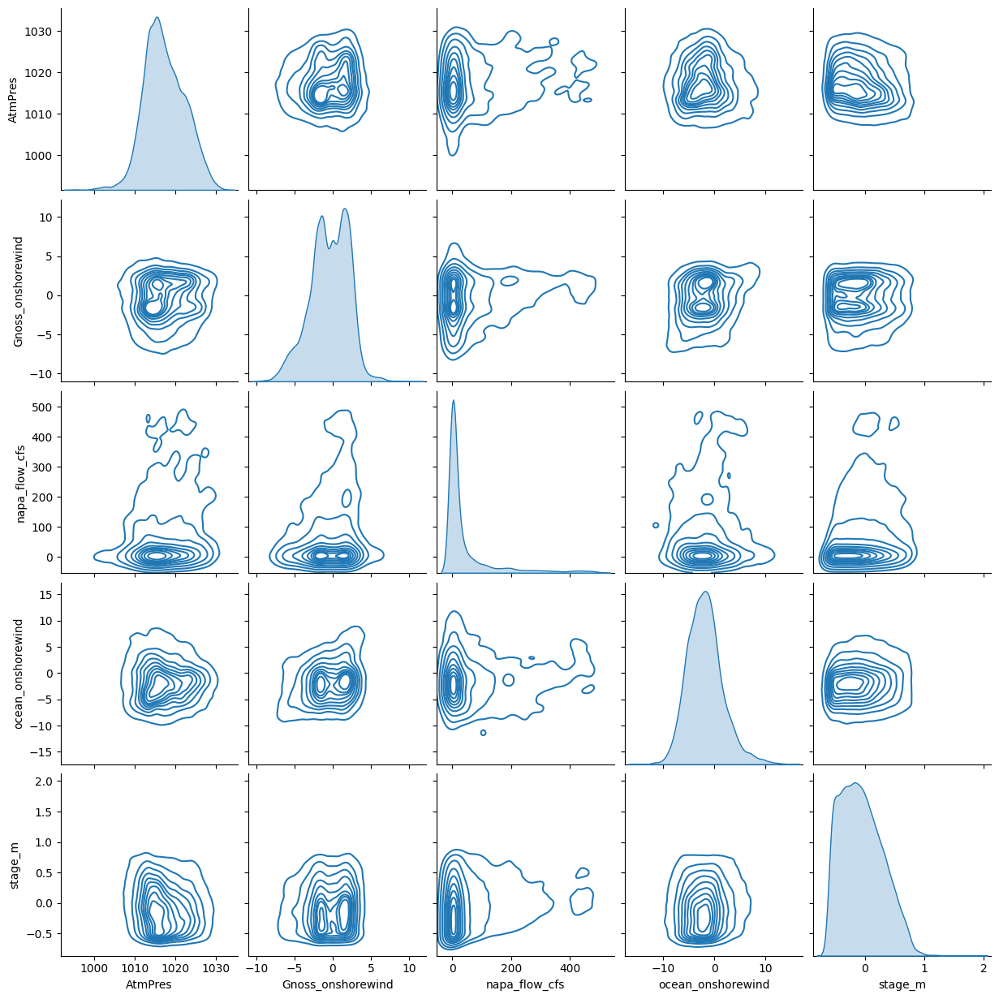

In [ ]:
merged_df_filtered = merged_df_no_nan[(merged_df_no_nan.iloc[:, 1] <= 1200) & (merged_df_no_nan.iloc[:, 3] <= 500)]
sns.pairplot(merged_df_filtered, kind='kde')

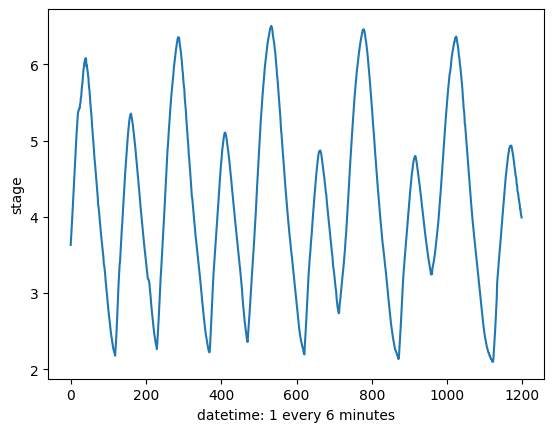

In [ ]:
plt.xlabel('datetime: 1 every 6 minutes')
plt.ylabel('stage')
plt.plot(r_stage[:,2])

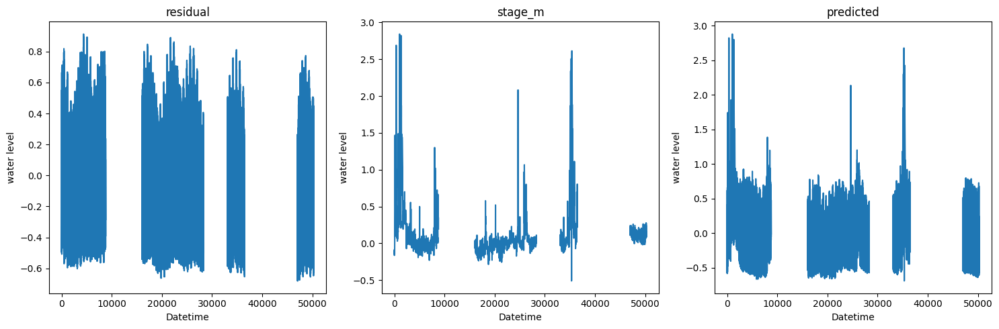

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(r_1hr[:, 1])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('residual')

plt.subplot(1, 3, 2)
plt.plot(r_1hr[:, 2])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('stage_m')

plt.subplot(1, 3, 3)
plt.plot(r_1hr[:, 3])
plt.xlabel('Datetime')
plt.ylabel('water level')
plt.title('predicted')

plt.tight_layout()
plt.show()

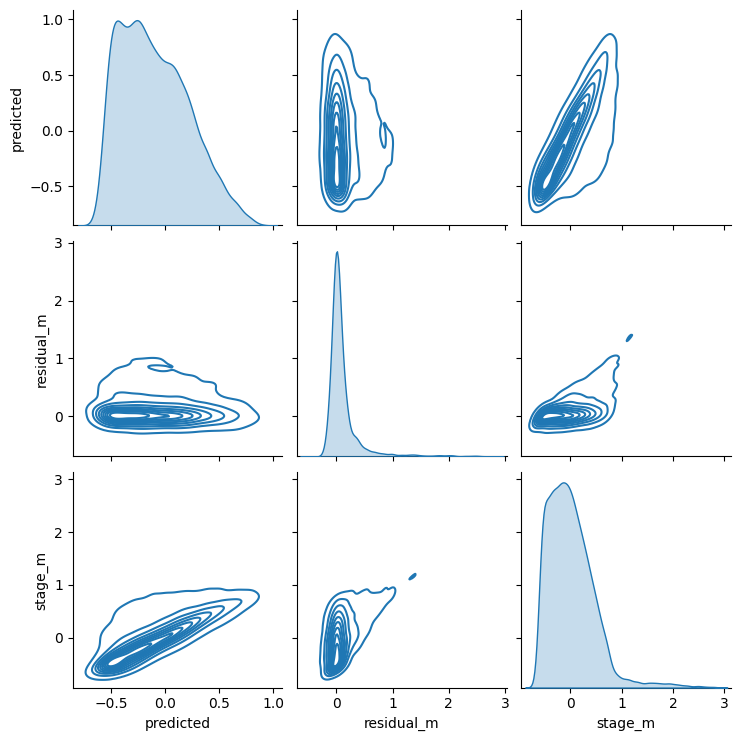

In [ ]:
sns.pairplot(row_stage_1hr, kind='kde')

In [ ]:
row_stage_1hr

,Unnamed: 0,predicted,residual_m,stage_m
0,2019-01-01 20:00:00+00:00,0.548392,-0.140746,0.401955
1,2019-01-01 21:00:00+00:00,0.390842,-0.138534,0.194688
2,2019-01-01 22:00:00+00:00,0.211430,-0.144889,-0.011796
3,2019-01-01 23:00:00+00:00,0.019978,-0.155879,-0.217927
4,2019-01-02 00:00:00+00:00,-0.170311,-0.164437,-0.445391
...,...,...,...,...
50227,2024-09-24 15:00:00+00:00,-0.032726,0.081621,0.050129
50228,2024-09-24 16:00:00+00:00,0.045566,0.093874,0.201275
50229,2024-09-24 17:00:00+00:00,-0.009155,0.119202,0.242371
50230,2024-09-24 18:00:00+00:00,-0.144396,0.156957,0.135133


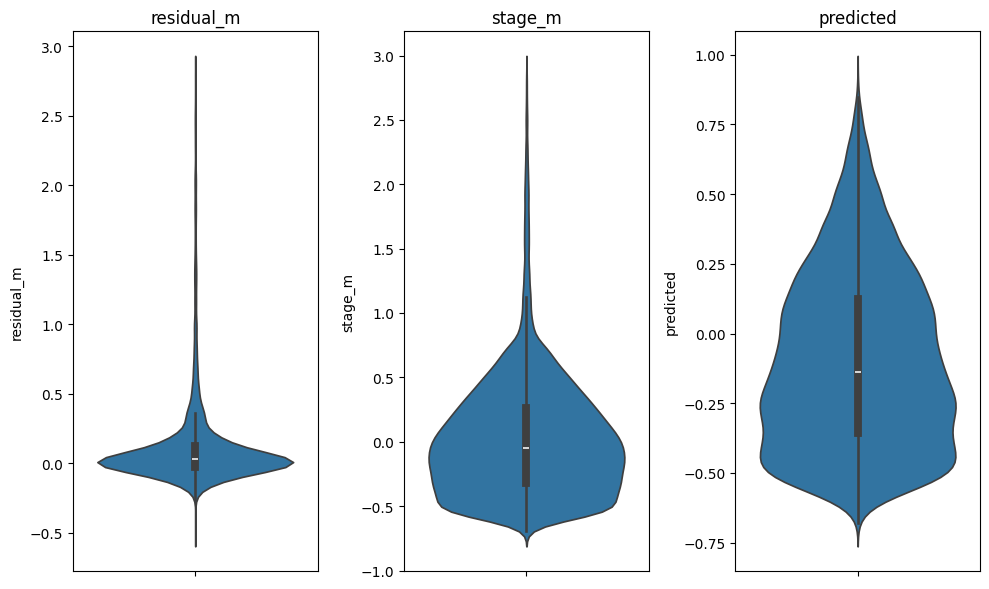

In [ ]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
sns.violinplot(y=row_stage_1hr.iloc[:, 2])
plt.title(row_stage_1hr.columns[2])

plt.subplot(1, 3, 2)
sns.violinplot(y=row_stage_1hr.iloc[:, 3])
plt.title(row_stage_1hr.columns[3])

plt.subplot(1, 3, 3)
sns.violinplot(y=row_stage_1hr.iloc[:, 1])
plt.title(row_stage_1hr.columns[1])

plt.tight_layout()
plt.show()

# Baseline Models

## Novato

SVM, MLP (1 and 2 layer), other OD algos.
Make sure to use loss function aimed towards outliers

In [ ]:
# Convert the datetime columns to datetime objects if they are not already
df['datetime'] = pd.to_datetime(df['datetime'])
novato_stage_1hr['datetime'] = pd.to_datetime(novato_stage_1hr['Unnamed: 0'])

# Merge the DataFrames based on the 'datetime' column
merged_df = pd.merge(df, novato_stage_1hr[['datetime', 'residual_m']], on='datetime', how='left')

merged_df = merged_df.dropna()


# Now, merged_df will contain the 'stage_m' column from novato_stage_1hr for all shared datetime entries.
# If you want to fill NaN values (entries without matching datetimes) with a specific value, you can use:
# merged_df['stage_m'].fillna(0, inplace=True)

print(merged_df)

subset_df = merged_df[0:35000]

                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
0     2019-01-01 20:00:00+00:00   1024.5          -1.461785           15.4   
1     2019-01-01 21:00:00+00:00   1023.6           0.802708           15.9   
2     2019-01-01 22:00:00+00:00   1023.2          -0.892718           15.9   
3     2019-01-01 23:00:00+00:00   1022.8           2.716258           15.9   
4     2019-01-02 00:00:00+00:00   1023.5           2.005033           15.4   
...                         ...      ...                ...            ...   
48807 2024-09-19 15:00:00+00:00   1011.6          -1.520178            0.0   
48808 2024-09-19 16:00:00+00:00   1011.7          -2.901074            0.0   
48809 2024-09-19 17:00:00+00:00   1012.1          -1.336822            0.0   
48810 2024-09-19 18:00:00+00:00   1012.5           1.336822            0.0   
48811 2024-09-19 19:00:00+00:00   1012.9          -0.552661            0.0   

       ocean_onshorewind  residual_m  
0              -0.204600

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

X = subset_df.drop(['datetime', 'residual_m'], axis=1)
y = subset_df['residual_m']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)

model = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 1.1176125058679907


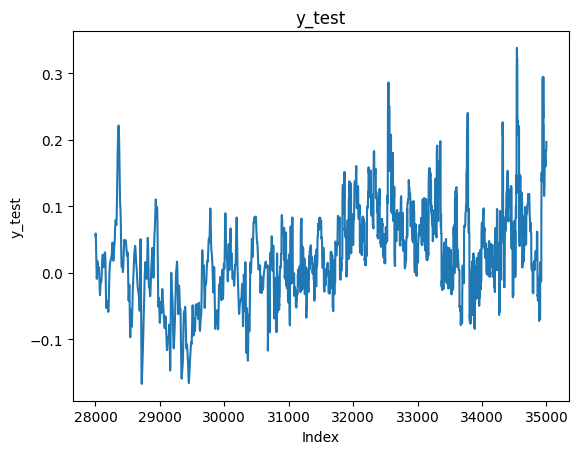

In [ ]:
plt.plot(y_test)
plt.xlabel('Index')
plt.ylabel('y_test')
plt.title('y_test')
plt.show()

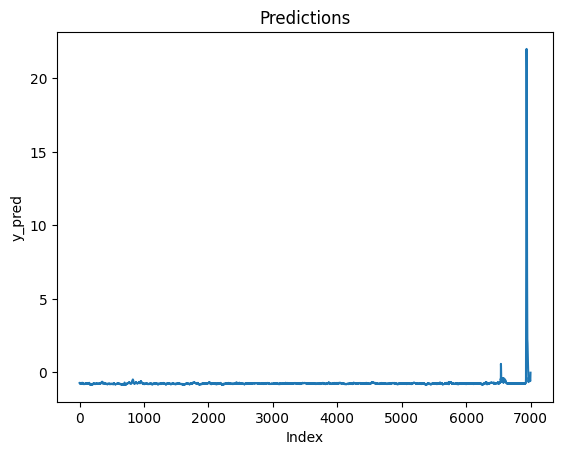

In [ ]:
plt.plot(y_pred)
plt.xlabel('Index')
plt.ylabel('y_pred')
plt.title('Predictions')
plt.show()

In [ ]:
import tensorflow as tf

from tensorflow.keras.losses import Huber
from sklearn.model_selection import train_test_split

subset_df = merged_df[0:35000]

X = subset_df.drop(['residual_m', 'datetime'], axis=1)  # Features (excluding target and datetime)
y = subset_df['residual_m']  # Target variable

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(4, activation='linear', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(1)  # Output layer with 1 neuron (for regression
])

model.compile(optimizer='adam', loss='huber')  # Use Mean Squared Error for regression

model.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 373.5314 - val_loss: 0.6621
Epoch 2/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3433 - val_loss: 0.2069
Epoch 3/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1718 - val_loss: 0.1804
Epoch 4/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1515 - val_loss: 0.3680
Epoch 5/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.1547 - val_loss: 0.1414
Epoch 6/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1250 - val_loss: 0.0130
Epoch 7/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1999 - val_loss: 0.1258
Epoch 8/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1642 - val_loss: 0.0513
Epoch 9/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2117 - val_loss: 0.1027
Epoch 10/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1698 - val_loss: 1.0455
Epoch 11/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2124 - val_loss: 0.0177
Epoch 12/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/st

In [ ]:
y_pred = model.predict(x_test)

219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [ ]:
# prompt: make a one layer mlp using merged_df with stage_m as the labels

import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming 'merged_df' is your DataFrame and 'stage_m' is the target variable
X = merged_df.drop(['residual_m', 'datetime'], axis=1)  # Features (excluding target and datetime)
y = merged_df['residual_m']  # Target variable

interim_x, removed_x, interim_y, removed_y = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(interim_x, interim_y, test_size=0.2, shuffle=False, stratify=None)

# Scale the data (important for neural networks)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define the MLP model
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1, activation='linear', input_shape=(X_train.shape[1],)),  # Input layer with 64 neurons
    tf.keras.layers.Dense(1)  # Output layer with 1 neuron (for regression)
])

# Compile the model
model.compile(optimizer='adam', loss='mse')  # Use Mean Squared Error for regression

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print("Test Loss:", loss)

# Make predictions on the test set
y_pred = model.predict(X_test)

# You can further analyze the predictions and evaluate the model's performance
# using metrics like R-squared, Mean Absolute Error, etc.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 0.1583 - val_loss: 0.0083
Epoch 2/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0119 - val_loss: 0.0050
Epoch 3/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0076 - val_loss: 0.0050
Epoch 4/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0076 - val_loss: 0.0051
Epoch 5/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0074 - val_loss: 0.0049
Epoch 6/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0076 - val_loss: 0.0047
Epoch 7/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.0075 - val_loss: 0.0046
Epoch 8/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0075 - val_loss: 0.0043
Epoch 9/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068 - val_loss: 0.0039
Epoch 10/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063 - val_loss: 0.0036
Epoch 11/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061 - val_loss: 0.0034
Epoch 12/20
629/629 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

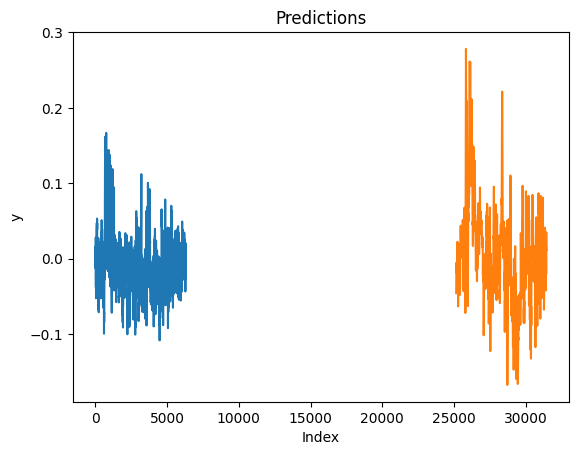

In [ ]:
# prompt: plot y_pred

plt.plot(y_pred)
plt.plot(y_test)
plt.xlabel('Index')
plt.ylabel('y')
plt.title('Predictions')
plt.show()


In [ ]:

import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming 'merged_df' is your DataFrame and 'stage_m' is the target variable
# Choose your three features
X = merged_df[['AtmPres', 'napa_flow_cfs', 'Gnoss_onshorewind', 'ocean_onshorewind']]  # Replace with your chosen features
y = merged_df['stage_m']  # Target variable

interim_x, removed_x, interim_y, removed_y = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(interim_x, interim_y, test_size=0.2, shuffle=False, stratify=None)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

# You can also access the coefficients of the linear regression model
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)


Mean Squared Error: 0.19720479537232305
R-squared: 0.0054398903956572875
Coefficients: [-1.33620259e-05  4.21000890e-05 -9.50461922e-04  8.62613044e-03]
Intercept: 0.03082799627080285


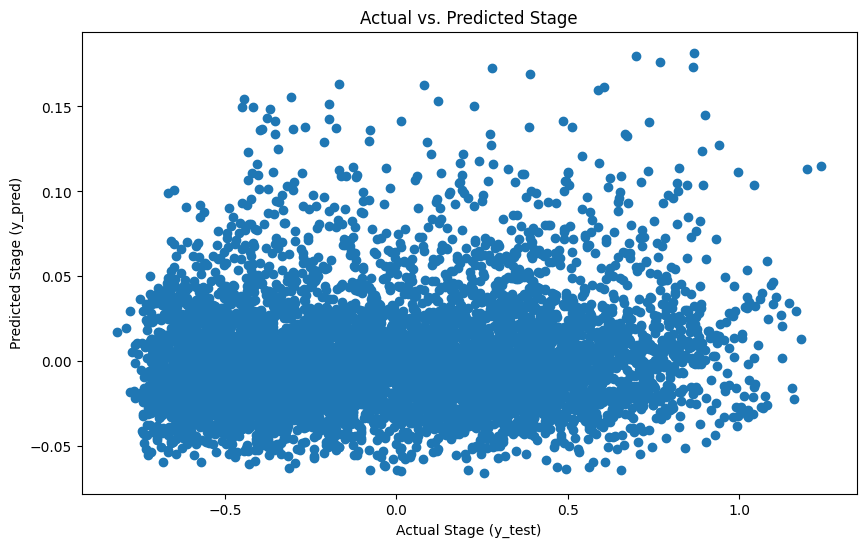

In [ ]:
# prompt: plot y_pred with a scatter plot

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Stage (y_test)")
plt.ylabel("Predicted Stage (y_pred)")
plt.title("Actual vs. Predicted Stage")
plt.show()


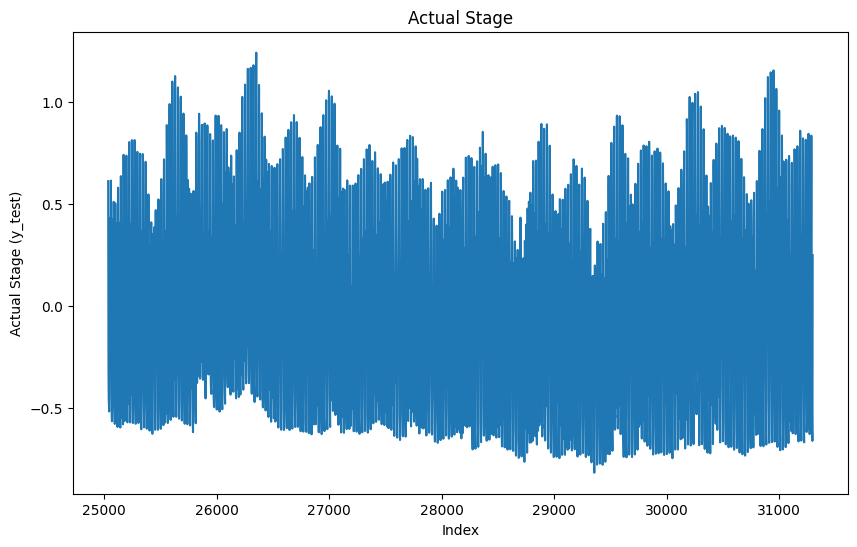

In [ ]:
# prompt: plot y_test

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(y_test)
plt.xlabel("Index")
plt.ylabel("Actual Stage (y_test)")
plt.title("Actual Stage")
plt.show()


## Petaluma

In [ ]:
# Convert the datetime columns to datetime objects if they are not already
df['datetime'] = pd.to_datetime(df['datetime'])
pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])

# Merge the DataFrames based on the 'datetime' column
merged_df = pd.merge(df, pet_stage_1hr[['datetime', 'residual_m']], on='datetime', how='left')

merged_df = merged_df.dropna()

subset_df = merged_df[0:15000]
# Now, merged_df will contain the 'stage_m' column from novato_stage_1hr for all shared datetime entries.
# If you want to fill NaN values (entries without matching datetimes) with a specific value, you can use:
# merged_df['stage_m'].fillna(0, inplace=True)

print(merged_df)

                       datetime  AtmPres  Gnoss_onshorewind  napa_flow_cfs  \
15702 2020-10-17 02:00:00+00:00   1012.6          -0.465921            0.0   
15703 2020-10-17 03:00:00+00:00   1012.7          -0.279986            0.0   
15704 2020-10-17 04:00:00+00:00   1012.8          -0.094051            0.0   
15705 2020-10-17 05:00:00+00:00   1012.5           0.091884            0.0   
15706 2020-10-17 06:00:00+00:00   1012.7           0.277819            0.0   
...                         ...      ...                ...            ...   
48926 2024-09-24 14:00:00+00:00   1007.7           0.423870            0.0   
48927 2024-09-24 15:00:00+00:00   1008.0           0.652108            0.0   
48928 2024-09-24 16:00:00+00:00   1008.4           0.880346            0.0   
48929 2024-09-24 17:00:00+00:00   1008.7           1.108584            0.0   
48930 2024-09-24 18:00:00+00:00   1009.1           1.336822            0.0   

       ocean_onshorewind  residual_m  
15702           0.029669

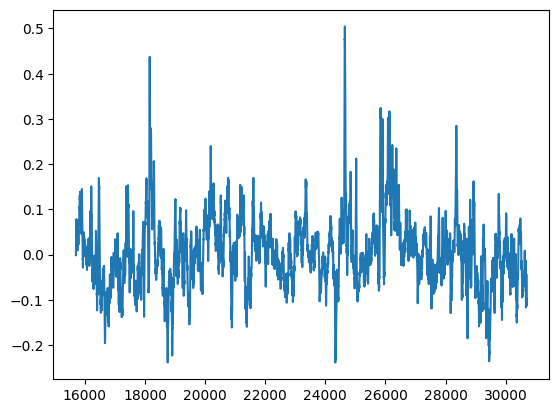

In [ ]:
plt.plot(subset_df['residual_m'])
#

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

X = subset_df.drop(['datetime', 'residual_m'], axis=1)
y = subset_df['residual_m']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)
y_test = y_test.reset_index(drop=True)

model = MLPRegressor(hidden_layer_sizes=(50,10), max_iter=500, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2}")

Mean Squared Error: 0.004026329375020975
R-squared: 0.16733785394491296


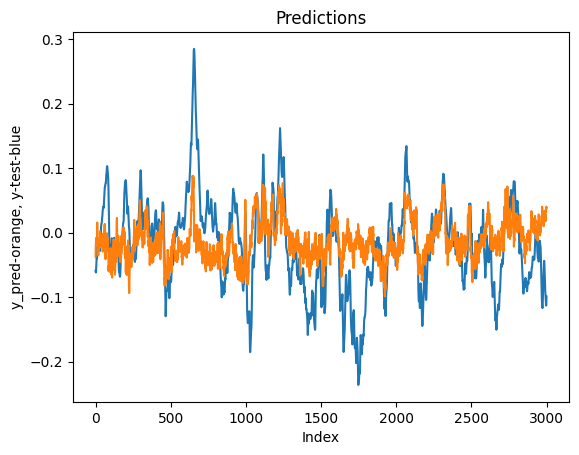

In [ ]:
# prompt: plot y_pred

plt.plot(y_test[0:])
plt.plot(y_pred[0:])
plt.xlabel('Index')
plt.ylabel('y_pred-orange, y-test-blue')
plt.title('Predictions')
plt.show()


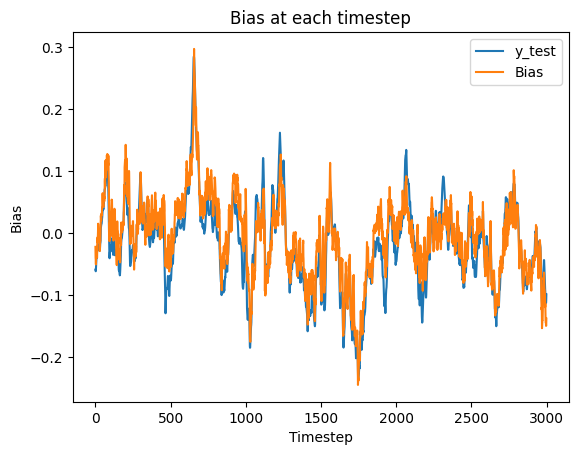

In [ ]:
x = y_test - y_pred
plt.plot(y_test)
plt.plot(x)
plt.xlabel('Timestep')
plt.ylabel('Bias')
plt.title('Bias at each timestep')
plt.legend(['y_test','Bias'])
plt.show()

In [ ]:
y_test-y_pred

,residual_m
0,-0.022230
1,-0.040021
2,-0.042971
3,-0.050470
4,-0.037571
...,...
2995,-0.144642
2996,-0.144179
2997,-0.149845
2998,-0.149163


Mean Squared Error: 0.003231023070418636
R-squared: 0.331810601373301


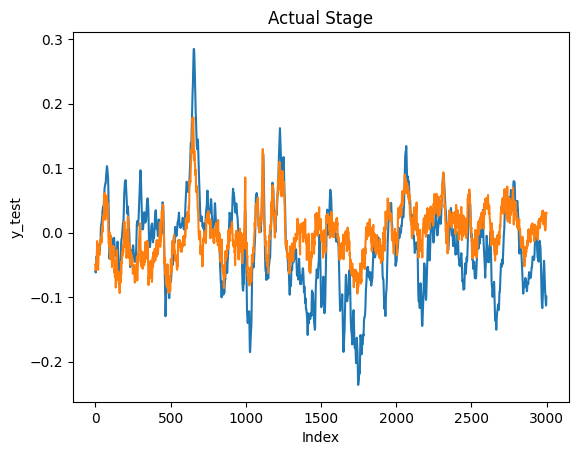

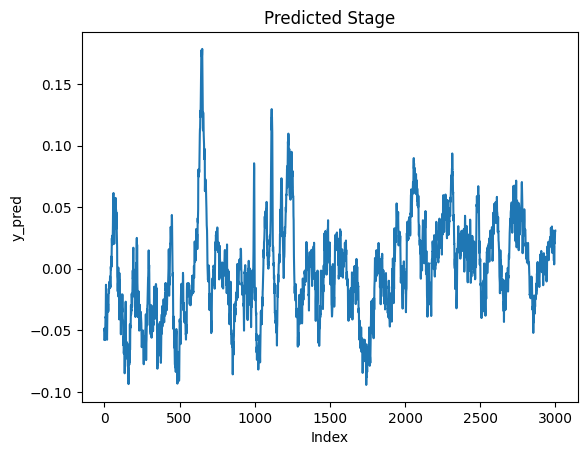

In [ ]:
from sklearn.svm import SVR

X = subset_df.drop(['datetime', 'residual_m'], axis=1)
y = subset_df['residual_m']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)


y_test = y_test.reset_index(drop=True)
# Create an SVM model (e.g., using SVR for regression)
model = SVR(kernel='rbf', C=0.8, epsilon=0.01, degree=3)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2}")

plt.plot(y_test)
plt.plot(y_pred)
plt.xlabel('Index')
plt.ylabel('y_test')
plt.title('Actual Stage')
plt.show()

plt.plot(y_pred)
plt.xlabel('Index')
plt.ylabel('y_pred')
plt.title('Predicted Stage')
plt.show()

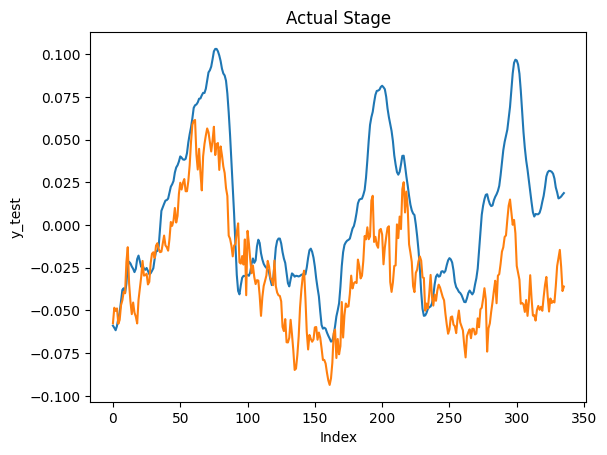

In [ ]:
plt.plot(y_test[0:336])
plt.plot(y_pred[0:336])
plt.xlabel('Index')
plt.ylabel('y_test')
plt.title('Actual Stage')
plt.show()

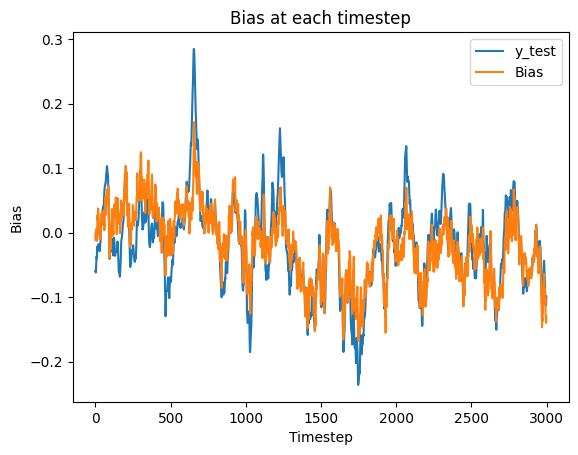

In [ ]:
x = y_test - y_pred
plt.plot(y_test)
plt.plot(x)
plt.xlabel('Timestep')
plt.ylabel('Bias')
plt.title('Bias at each timestep')
plt.legend(['y_test','Bias'])
plt.show()

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming 'merged_df' is your DataFrame and 'stage_m' is the target variable
# Choose your three features
X = subset_df[['AtmPres', 'napa_flow_cfs', 'Gnoss_onshorewind', 'ocean_onshorewind']]  # Replace with your chosen features
y = subset_df['residual_m']  # Target variable


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, stratify=None)
y_test = y_test.reset_index(drop=True)
# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

# You can also access the coefficients of the linear regression model
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

Mean Squared Error: 0.0034773870784502747
R-squared: 0.2808614701593928
Coefficients: [-8.25557793e-03  6.10307920e-05  6.77313762e-03  6.03366416e-03]
Intercept: 8.425080036147605


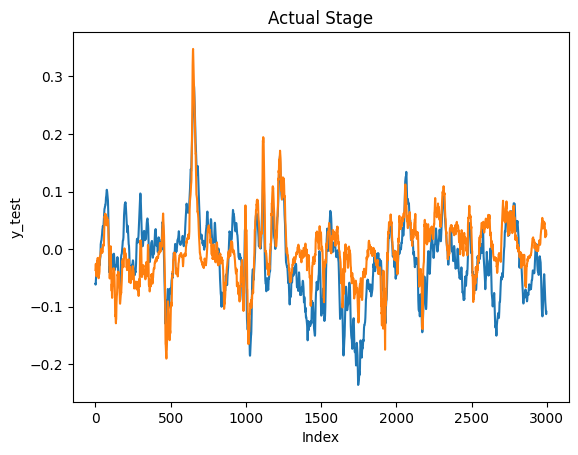

In [ ]:
plt.plot(y_test[0:])
plt.plot(y_pred[0:])
plt.xlabel('Index')
plt.ylabel('y_test')
plt.title('Actual Stage')
plt.show()

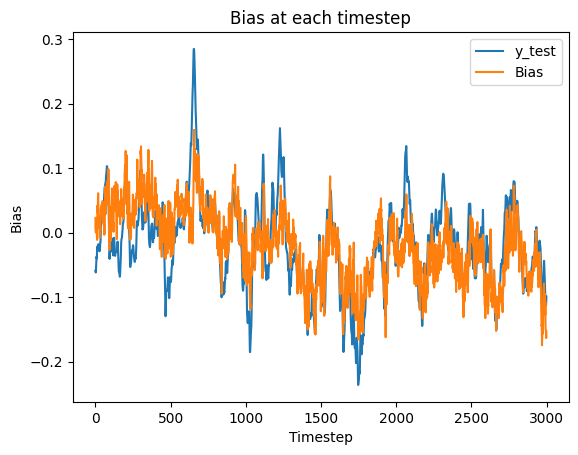

In [ ]:
x = y_test - y_pred
plt.plot(y_test)
plt.plot(x)
plt.xlabel('Timestep')
plt.ylabel('Bias')
plt.title('Bias at each timestep')
plt.legend(['y_test','Bias'])
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
375/375 - 6s - 16ms/step - loss: 0.0096
Epoch 2/50
375/375 - 5s - 14ms/step - loss: 0.0042
Epoch 3/50
375/375 - 4s - 10ms/step - loss: 0.0041
Epoch 4/50
375/375 - 3s - 7ms/step - loss: 0.0040
Epoch 5/50
375/375 - 3s - 7ms/step - loss: 0.0039
Epoch 6/50
375/375 - 2s - 5ms/step - loss: 0.0038
Epoch 7/50
375/375 - 3s - 9ms/step - loss: 0.0038
Epoch 8/50
375/375 - 2s - 7ms/step - loss: 0.0037
Epoch 9/50
375/375 - 2s - 5ms/step - loss: 0.0036
Epoch 10/50
375/375 - 3s - 9ms/step - loss: 0.0037
Epoch 11/50
375/375 - 3s - 8ms/step - loss: 0.0036
Epoch 12/50
375/375 - 2s - 6ms/step - loss: 0.0036
Epoch 13/50
375/375 - 3s - 7ms/step - loss: 0.0035
Epoch 14/50
375/375 - 3s - 7ms/step - loss: 0.0035
Epoch 15/50
375/375 - 2s - 5ms/step - loss: 0.0035
Epoch 16/50
375/375 - 2s - 5ms/step - loss: 0.0034
Epoch 17/50
375/375 - 3s - 7ms/step - loss: 0.0034
Epoch 18/50
375/375 - 2s - 5ms/step - loss: 0.0034
Epoch 19/50
375/375 - 3s - 8ms/step - loss: 0.0034
Epoch 20/50
375/375 - 3s - 9ms/step -

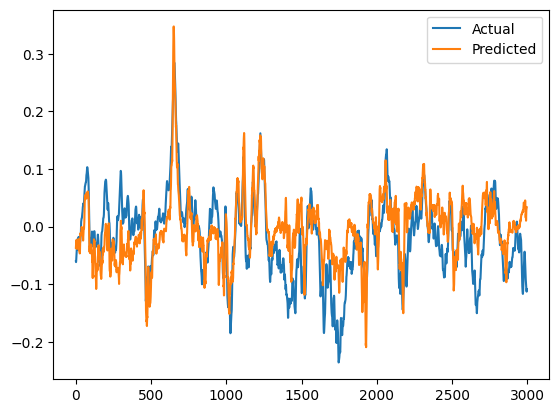

In [ ]:
# prompt: train an autoregressive mlp on subset_df

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Assuming 'subset_df' is your DataFrame and 'stage_m' is the target variable

# Prepare your data
X = subset_df.drop(['datetime', 'residual_m'], axis=1)
y = subset_df['residual_m']

# Define the number of previous time steps to consider
look_back = 10  # You can adjust this based on your data

# Create a dataset with lagged features
def create_dataset(X, y, look_back=1):
    dataX, dataY = [], []
    for i in range(len(X) - look_back - 1):
        a = X[i:(i + look_back)]
        dataX.append(a)
        dataY.append(y[i + look_back])
    return np.array(dataX), np.array(dataY)

def sse_loss(y_true, y_pred):
    return tf.reduce_sum(tf.square(y_true - y_pred))

def r2_loss(y_true, y_pred):
    SS_res =  tf.reduce_sum(tf.square(y_true - y_pred))
    SS_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - (1 - SS_res/(SS_tot + tf.keras.backend.epsilon()))

X, y = create_dataset(X.values, y.values, look_back)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=17)

# Scale your data
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()
X_train = scaler_x.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test = scaler_x.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test = scaler_y.transform(y_test.reshape(-1, 1)).flatten()


# Define the MLP model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(look_back, X.shape[2])))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam') #mse

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=2)

# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred.reshape(-1,1)).flatten()
y_test = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

# Plot the results (optional)
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()


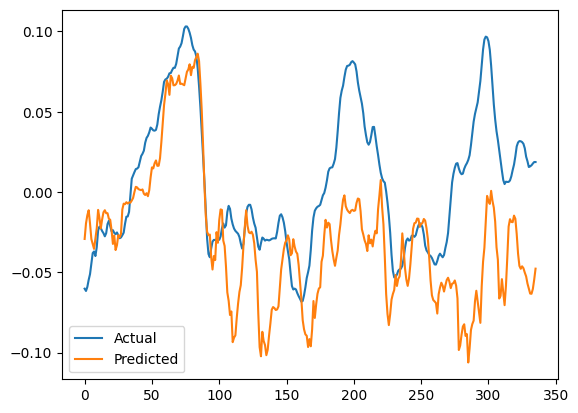

In [ ]:
plt.plot(y_test[0:336], label='Actual')
plt.plot(y_pred[0:336], label='Predicted')
plt.legend()
plt.show()

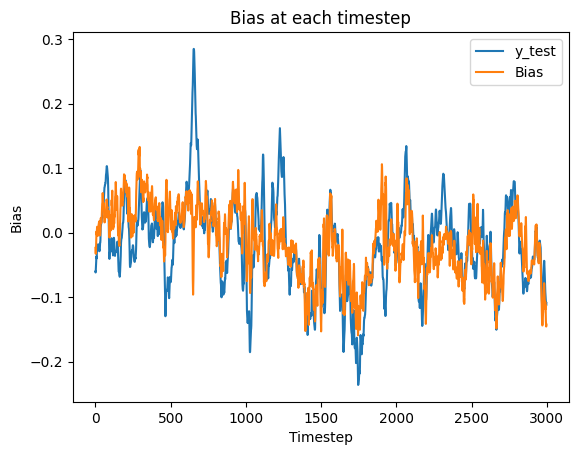

In [ ]:
x = y_test - y_pred
plt.plot(y_test)
plt.plot(x)
plt.xlabel('Timestep')
plt.ylabel('Bias')
plt.title('Bias at each timestep')
plt.legend(['y_test','Bias'])
plt.show()

# Live Models

## Novato

##Petaluma

In [ ]:
!pip install utide
import utide

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

In [ ]:
def maketide(pred_time,coef):
    # Calculate the predicted time giving a datetime index
    # and precomputed Utide coefficients.
    # output predicted tide

    #pred_time=dff.index
    dpredtime = d2n(pred_time)
    tide= utide.reconstruct(dpredtime, coef)
    tide_utide = tide.h
    Utide_pred = pd.Series(data=tide_utide, index=pred_time)

    return Utide_pred

In [ ]:
def cal_metric(y_true, y_pred, desc):

    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse= np.sqrt(metrics.mean_squared_error(y_true, y_pred)) # or mse**(0.5)
    maxerr = metrics.max_error(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae99 = np.percentile(abs_err, 99)
    ae95 = np.percentile(abs_err, 95)

    print(desc)
    print("MAE:",'{:.4f}'.format(mae))
    print("MSE:", '{:.4f}'.format(mse))
    print("RMSE:", '{:.4f}'.format(rmse))
    print("R2:", '{:.4f}'.format(r2))
    print("MaxErr:", '{:.4f}'.format(maxerr))
    print("99p_AbsErr:", '{:.4f}'.format(ae99))
    print("95p:", '{:.4f}'.format(ae95))
    return (mae, r2, ae95)

def plot_model_forecast(X_train, X_test, X_forecast, Observed, model, title):

    y_train_predictions = model.predict(X_train)
    y_test_predictions = model.predict(X_test)
    y_forecast_predictions = model.predict(X_forecast)
    train_predictions_df =pd.DataFrame(data = y_train_predictions, index =y_train.index )
    test_predictions_df =pd.DataFrame(data = y_test_predictions, index =y_test.index )
    forecast_predictions_df =pd.DataFrame(data = y_forecast_predictions, index =X_forecast.index )


    plt.figure()
    plt.plot(Observed,'k',label = 'Observed WL residual')
    plt.plot(train_predictions_df,'.b',alpha = 0.5, label = 'Train WL residual')
    plt.plot(test_predictions_df,'.r',alpha = 0.5,label = 'Test WL residual')
    plt.plot(forecast_predictions_df,'.g',alpha = 0.5,label = 'Forecast WL residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def plot_model2(X, Observed,model ,title):

    predictions = model.predict(X)
    predictions_df =pd.DataFrame(data = predictions, index =Observed.index )

    plt.figure()
    plt.plot(Observed,'k',label = 'Observed residual')
    plt.plot(predictions_df,'.b',alpha = 0.5, label = 'Predicted residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def lagcorrWL(observation, model_prediction,pred_tide, error_vec, lag):
    lagged=error_vec.shift(lag)
    prediction = model_prediction+lagged+pred_tide
    nb_na = lagged.isna().sum()# count the row that are NaN due to the shift
    thr = -0.1 # exclude the WL that is at low tide because of flat bottom WL
    maskwl = observation>thr #True where WL >thr

    y_true=observation[nb_na:].loc[maskwl]
    y_pred=prediction[nb_na:].loc[maskwl]
    #r2 = metrics.r2_score(y_true, y_pred)
    #mae = metrics.mean_absolute_error(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae95 = np.percentile(abs_err, 95)
    return ae95

In [ ]:
dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

In [ ]:
#X_train, X_test, y_train, y_test = train_test_split(X_df, y, shuffle=True, test_size = 0.15,random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_df[0:20000], y[0:20000], shuffle=False, test_size = 0.1)
scaler = MinMaxScaler()
degree=3 # the 3rd degree polynomial is the one that gives the best results
pipe=make_pipeline(PolynomialFeatures(degree),scaler,LinearRegression())
pipe.fit(X_train, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(degree=3)),
                ('minmaxscaler', MinMaxScaler()),
                ('linearregression', LinearRegression())])

In [ ]:
#hindcast_df =pd.DataFrame(index =X_df.index)
#hindcast_df['hind_res'] = pipe.predict(X_df)
hindcast_df =pd.DataFrame(index =X_train.index)
hindcast_df['hind_res'] = pipe.predict(X_train)

error = y_train - hindcast_df.hind_res

In [ ]:
win = 12 # number of points to average
hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

nb_na = hindcast_df.err_12hr_average.isna().sum()

hindcast_df['hind_final_WL'] = Y_df.predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
hindcast_df['obs_final_WL'] = Y_df.stage_m + 1.2025515990257196 #mean
hindcast_df['pred_tide'] = Y_df.predicted + 1.2025515990257196 #mean

d1 = y # Observated Residual
d2 = hindcast_df.hind_res # Model prediction of residual
d3 = hindcast_df.err_12hr_average # average error last 12 hours
d4=Y_df.predicted # Predicted tide
d5=Y_df.stage_m

In [ ]:
forecast = pipe.predict(X_val)
forecast_df =pd.DataFrame(data = forecast, index =X_val.index, columns=['pred_res'] )

correction = hindcast_df.err_12hr_average[-1] # the last
forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
pet_stage_1hr.set_index('datetime', inplace=True)

forecast_df['pred_tide'] = pet_stage_1hr['predicted']
forecast_df['pred_final_WL'] = forecast_df.pred_res_corrected  + forecast_df.pred_tide

<ipython-input-13-2ecf0852ad1e>:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


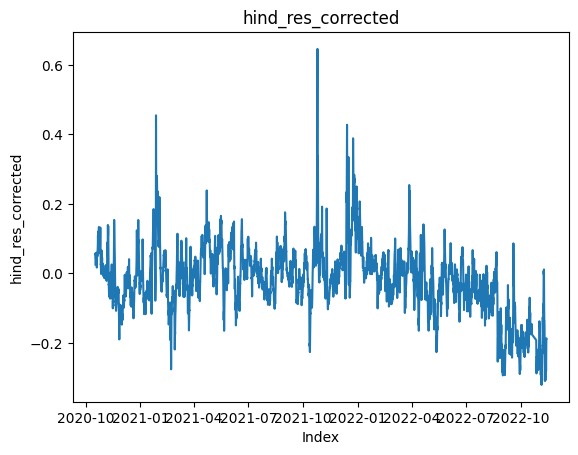

In [ ]:
# prompt: plot hind_res_corrected

plt.plot(hindcast_df['hind_res_corrected'])
plt.xlabel('Index')
plt.ylabel('hind_res_corrected')
plt.title('hind_res_corrected')
plt.show()

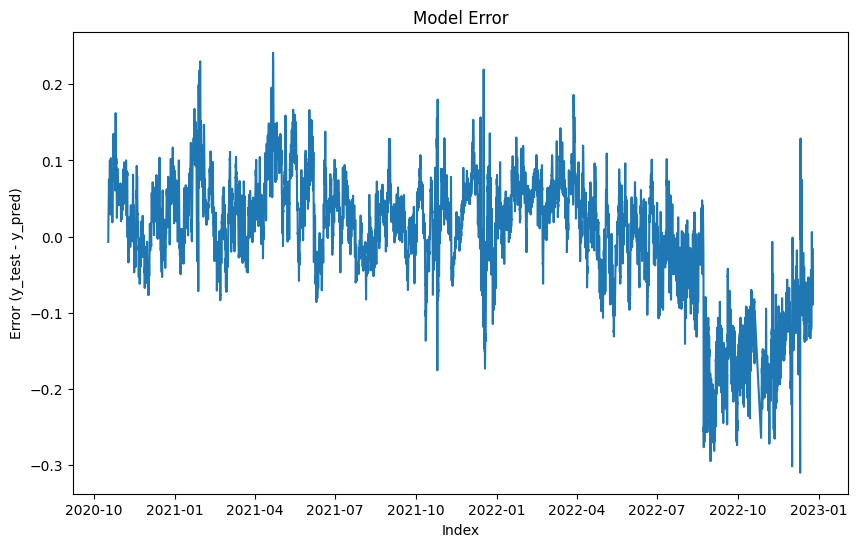

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(error)
plt.xlabel("Index")
plt.ylabel("Error (y_test - y_pred)")
plt.title("Model Error")
plt.show()

Mean Squared Error: 0.006052955855767929


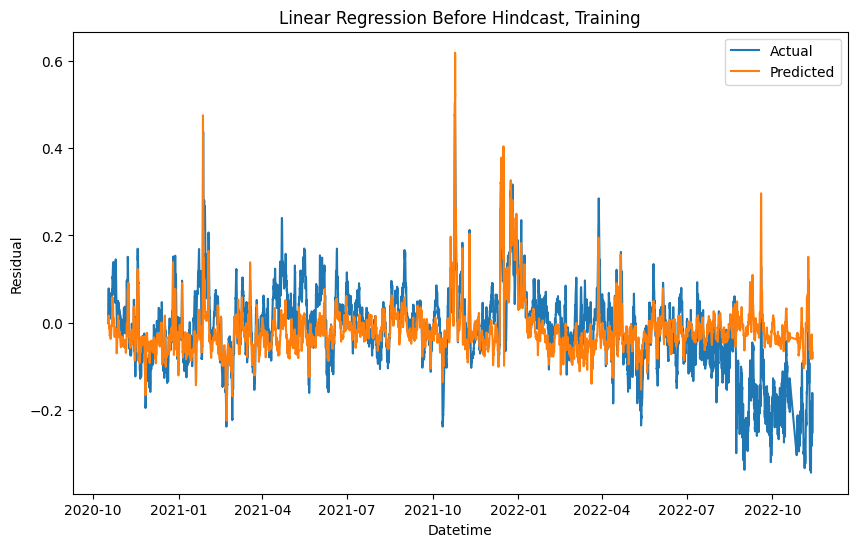

In [ ]:
mse = mean_squared_error(y_train, hindcast_df['hind_res'])
print(f"Mean Squared Error: {mse}")

plt.figure(figsize=(10, 6))
plt.plot(y_train, label='Actual')
plt.plot(hindcast_df['hind_res'], label='Predicted')
plt.xlabel('Datetime')
plt.ylabel('Residual')
plt.title('Linear Regression Before Hindcast, Training')
plt.legend()
plt.show()

Mean Squared Error: 0.00049305580262596


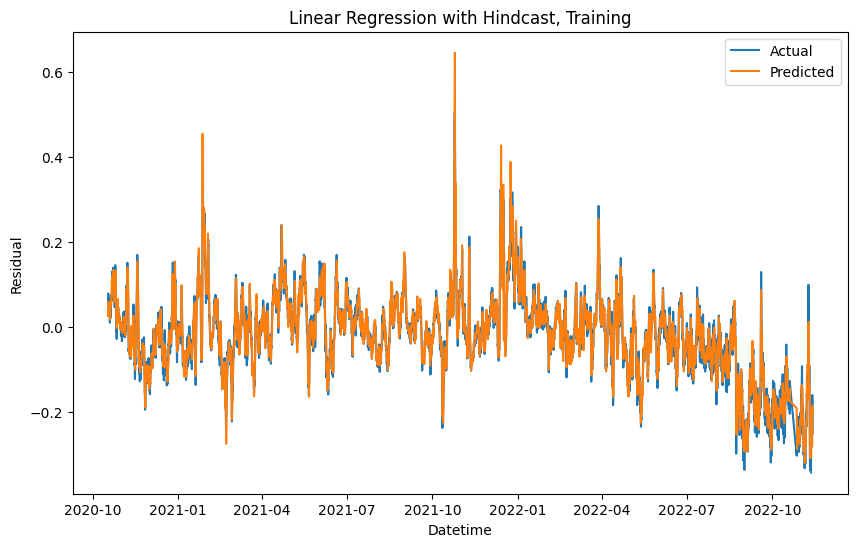

In [ ]:
# prompt: make and plot the mean squared error between  y and hindcast_df['hind_res_corrected'] while removing any nans from the hind res corrected

import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Remove NaN values from hindcast_df['hind_res_corrected']
valid_indices = ~np.isnan(hindcast_df['hind_res_corrected'])
y_filtered = y_train[valid_indices]
hindcast_filtered = hindcast_df['hind_res_corrected'][valid_indices]

# Calculate MSE
mse = mean_squared_error(y_filtered, hindcast_filtered)

# Print the MSE
print(f"Mean Squared Error: {mse}")

# Plot the MSE
plt.figure(figsize=(10, 6))
plt.plot(y_filtered, label='Actual')
plt.plot(hindcast_filtered, label='Predicted')
plt.xlabel('Datetime')
plt.ylabel('Residual')
plt.title('Linear Regression with Hindcast, Training')
plt.legend()
plt.show()

Mean Squared Error: 0.03973606754776338


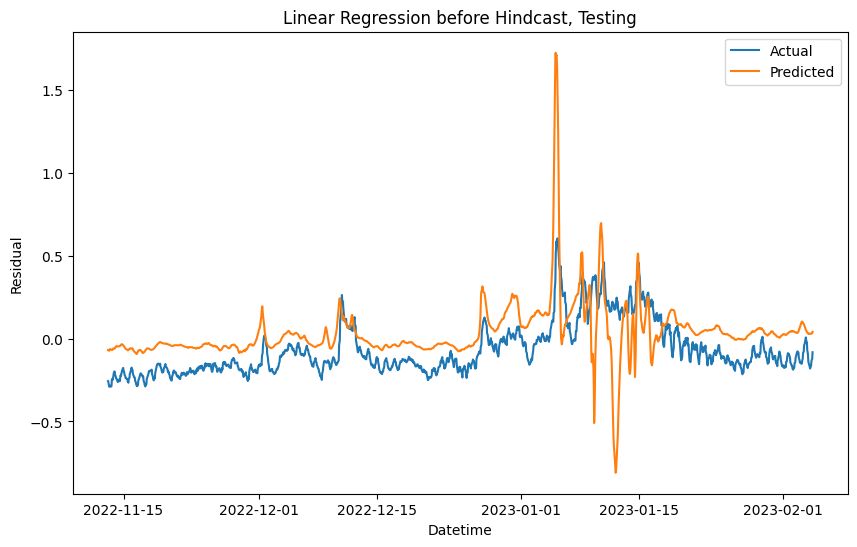

In [ ]:
mse = mean_squared_error(y_val, forecast_df['pred_res'])
print(f"Mean Squared Error: {mse}")

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(forecast_df['pred_res'], label='Predicted')
plt.xlabel('Datetime')
plt.ylabel('Residual')
plt.title('Linear Regression before Hindcast, Testing')
plt.legend()
plt.show()

Mean Squared Error: 0.02958640943866346
Mean Absolute Error: 0.08397522907868461


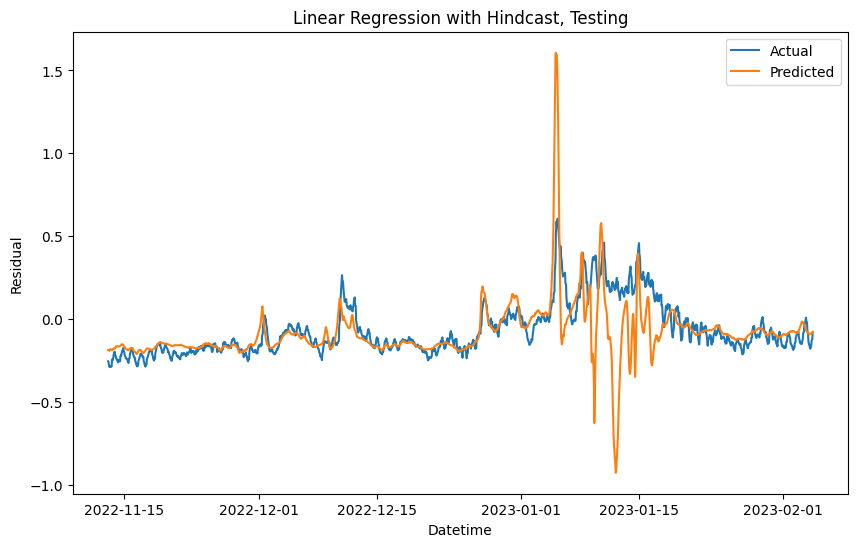

In [ ]:
from sklearn.metrics import mean_absolute_error
mse = mean_squared_error(y_val, forecast_df['pred_res_corrected'])
mae = mean_absolute_error(y_val, forecast_df['pred_res_corrected'])
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
plt.xlabel('Datetime')
plt.ylabel('Residual (m)')
plt.title('Linear Regression with Hindcast, Testing')
plt.legend()
plt.show()

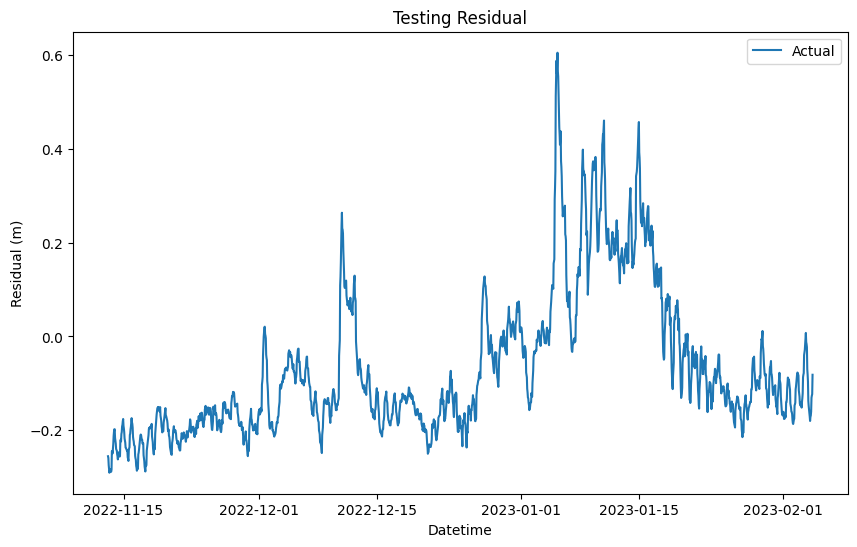

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.xlabel('Datetime')
plt.ylabel('Residual (m)')
plt.title('Testing Residual')
plt.legend()
plt.show()

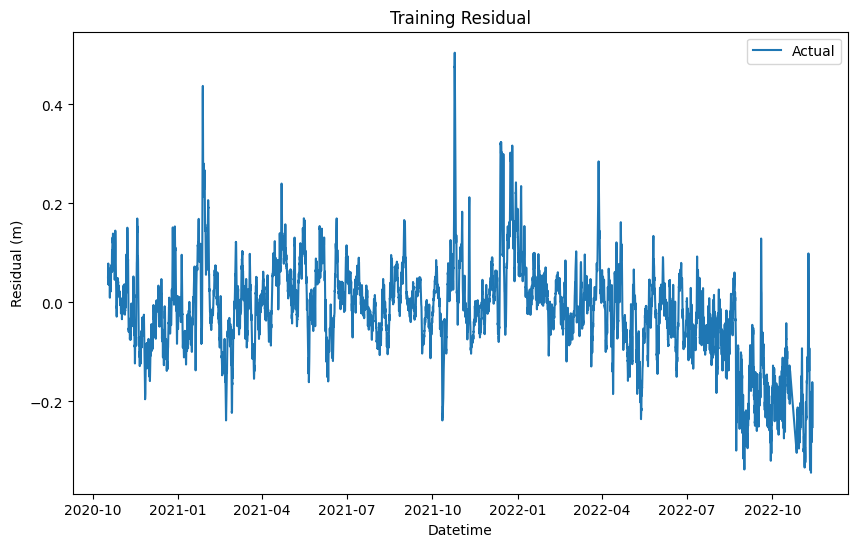

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_filtered, label='Actual')
plt.xlabel('Datetime')
plt.ylabel('Residual (m)')
plt.title('Training Residual')
plt.legend()
plt.show()

# Outlier Detection

## Petaluma

try looking at the shap or lrp values for the models and try to see what they are looking at for the extreme values.

In [ ]:
path_pstage = '/content/drive/MyDrive/hwy37/petaluma_wl_new.csv'
pet_stage = pd.read_csv(path_pstage)
p_stage = np.asarray(pet_stage)

path_p1hr = '/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv'
pet_stage_1hr = pd.read_csv(path_p1hr)
p_1hr = np.asarray(pet_stage_1hr)

In [ ]:
pet_stage_1hr['pred_tide'] = pet_stage_1hr.predicted + 1.2025515990257196
pet_stage_1hr['final_wl'] = pet_stage_1hr.stage_m + 1.2025515990257196
pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
pet_stage_1hr.set_index('datetime', inplace=True)
subset_df = pet_stage_1hr[0:20000]

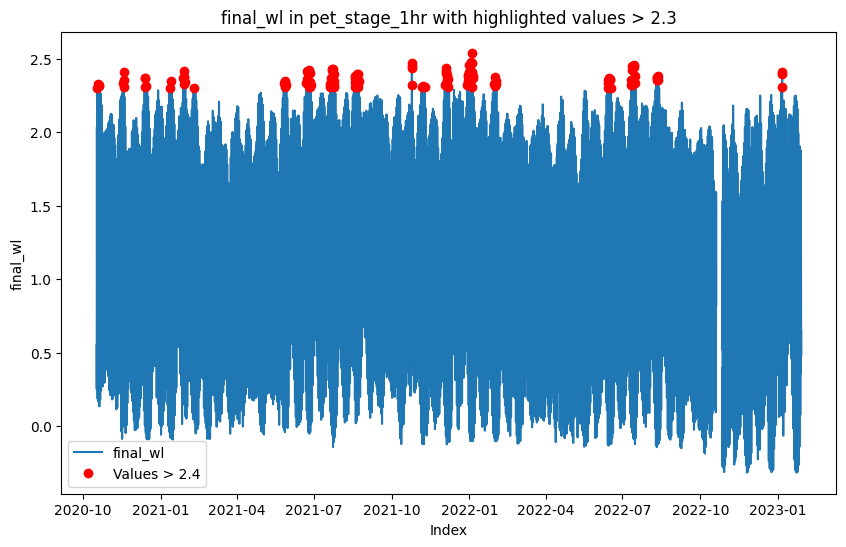

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(subset_df['final_wl'], label='final_wl')

plt.plot(subset_df.loc[subset_df['final_wl'] > 2.3].index,
         subset_df.loc[subset_df['final_wl'] > 2.3]['final_wl'],
         'ro', label='Values > 2.4')

plt.xlabel('Index')
plt.ylabel('final_wl')
plt.title('final_wl in pet_stage_1hr with highlighted values > 2.3')
plt.legend()
plt.show()

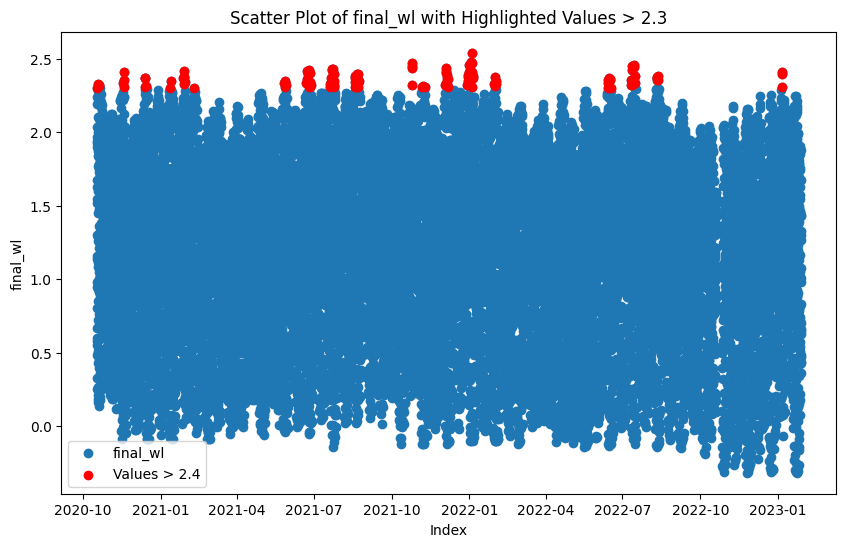

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(subset_df.index, subset_df['final_wl'], label='final_wl')

# Highlight values > 2.4 in red
plt.scatter(subset_df.loc[subset_df['final_wl'] > 2.3].index,
             subset_df.loc[subset_df['final_wl'] > 2.3]['final_wl'],
             color='red', label='Values > 2.4')

plt.xlabel('Index')
plt.ylabel('final_wl')
plt.title('Scatter Plot of final_wl with Highlighted Values > 2.3')
plt.legend()
plt.show()

"make a list of all entries with a final wl of 2.4 or higher"

In [ ]:
outlier_indices = subset_df[subset_df['final_wl'] >= 2.3].index.tolist()
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index('datetime', inplace=True)
corresponding_values = df.loc[outlier_indices]

In [ ]:
corresponding_values['final_wl'] = subset_df.loc[outlier_indices]['final_wl']
corresponding_values

,AtmPres,Gnoss_onshorewind,napa_flow_cfs,ocean_onshorewind,final_wl
datetime,,,,,
2020-10-17 21:00:00+00:00,1013.8,3.387545,0.0,-2.028444,2.301200
2020-10-18 22:00:00+00:00,1015.7,2.658168,0.0,-1.648122,2.329300
2020-10-19 22:00:00+00:00,1015.0,1.267696,0.0,-4.361705,2.315500
2020-10-19 23:00:00+00:00,1014.6,1.367422,0.0,-3.781515,2.319400
2020-11-16 21:00:00+00:00,1015.0,3.301863,0.0,1.709721,2.332700
...,...,...,...,...,...
2022-08-12 08:00:00+00:00,1017.4,-1.328784,0.0,-4.000000,2.385781
2022-08-12 09:00:00+00:00,1017.4,-1.309492,0.0,-4.000000,2.354113
2023-01-05 18:00:00+00:00,1009.6,-3.803532,4170.0,6.212109,2.308935


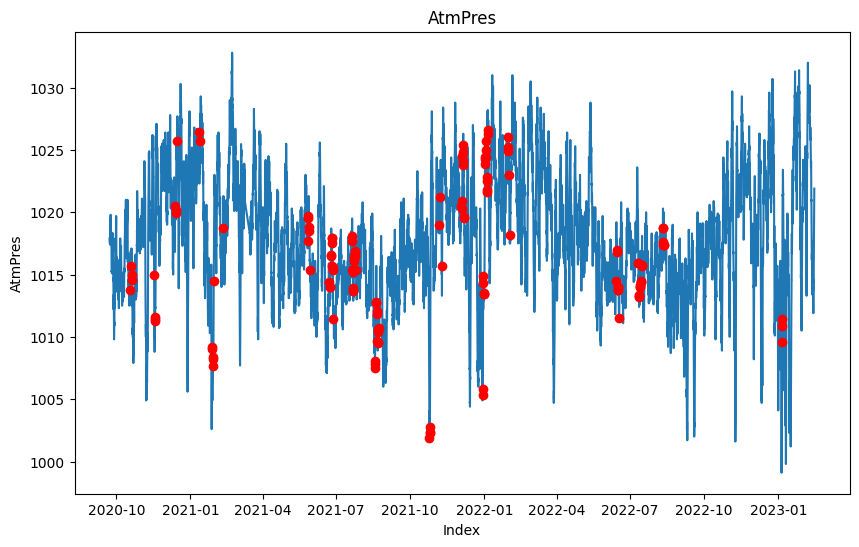

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.loc[df['AtmPres'] < 1500, 'AtmPres'][15000:36000], zorder=1)

plt.scatter(corresponding_values.index, corresponding_values['AtmPres'], color='red', label='Values associated with outliers', zorder=2)

plt.xlabel('Index')
plt.ylabel('AtmPres')
plt.title('AtmPres')
plt.show()

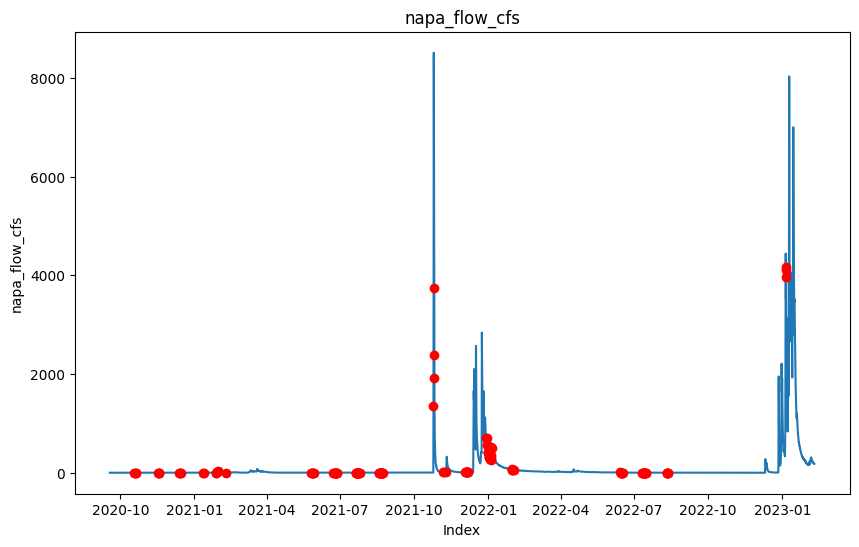

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df['napa_flow_cfs'][15000:36000], zorder=1)

plt.scatter(corresponding_values.index, corresponding_values['napa_flow_cfs'], color='red', label='Values associated with outliers', zorder=2)

plt.xlabel('Index')
plt.ylabel('napa_flow_cfs')
plt.title('napa_flow_cfs')
plt.show()

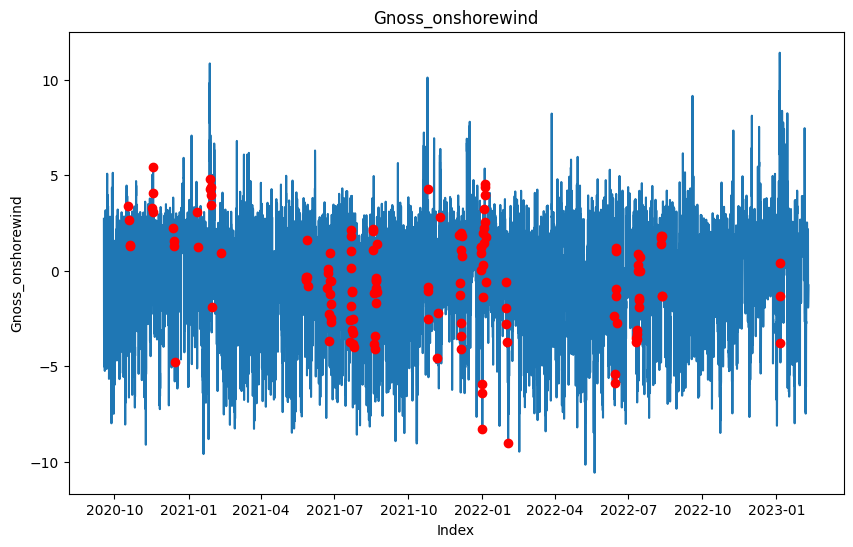

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df['Gnoss_onshorewind'][15000:36000], zorder=1)

plt.scatter(corresponding_values.index, corresponding_values['Gnoss_onshorewind'], color='red', label='Values associated with outliers', zorder=2)

plt.xlabel('Index')
plt.ylabel('Gnoss_onshorewind')
plt.title('Gnoss_onshorewind')
plt.show()

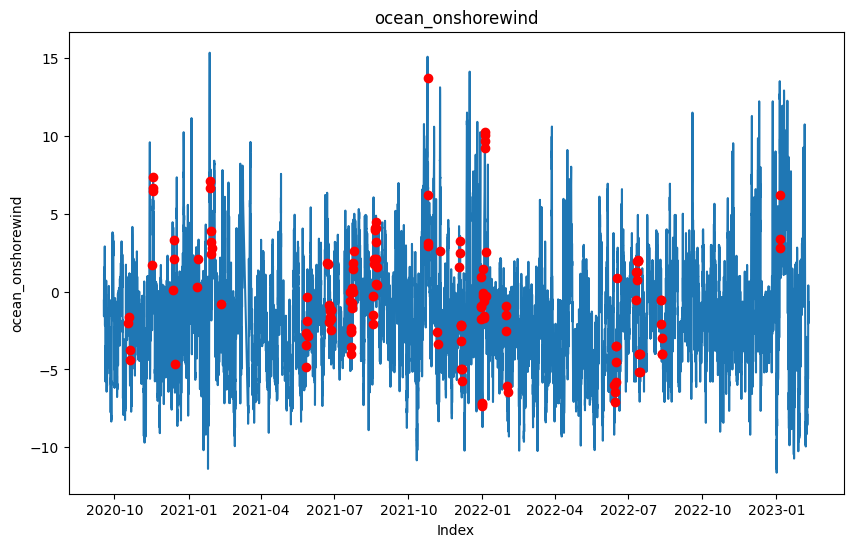

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df['ocean_onshorewind'][15000:36000], zorder=1)

plt.scatter(corresponding_values.index, corresponding_values['ocean_onshorewind'], color='red', label='Values associated with outliers', zorder=2)

plt.xlabel('Index')
plt.ylabel('ocean_onshorewind')
plt.title('ocean_onshorewind')
plt.show()

In [ ]:
df.describe()

,AtmPres,Gnoss_onshorewind,napa_flow_cfs,ocean_onshorewind
count,49626.000000,49626.000000,49626.000000,49626.000000
mean,1034.954859,-0.484203,167.352110,-1.819173
std,388.061678,2.547024,685.982621,3.733024
min,985.400000,-10.565963,0.000000,-15.434475
25%,1013.400000,-2.120702,0.000000,-4.507447
50%,1016.300000,-0.372873,8.000000,-2.031802
75%,1019.800000,1.448378,67.000000,0.342020
max,9999.000000,13.550180,16600.000000,17.276291


# New models for Petaluma

## Petaluma MLP and SVR

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

In [ ]:
def cal_metric(y_true, y_pred, desc):

    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse= np.sqrt(metrics.mean_squared_error(y_true, y_pred)) # or mse**(0.5)
    maxerr = metrics.max_error(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae99 = np.percentile(abs_err, 99)
    ae95 = np.percentile(abs_err, 95)

    print(desc)
    print("MAE:",'{:.4f}'.format(mae))
    print("MSE:", '{:.4f}'.format(mse))
    print("RMSE:", '{:.4f}'.format(rmse))
    print("R2:", '{:.4f}'.format(r2))
    print("MaxErr:", '{:.4f}'.format(maxerr))
    print("99p_AbsErr:", '{:.4f}'.format(ae99))
    print("95p:", '{:.4f}'.format(ae95))
    return (mae, r2, ae95)

def plot_model_forecast(X_train, X_test, X_forecast, Observed, model, title):

    y_train_predictions = model.predict(X_train)
    y_test_predictions = model.predict(X_test)
    y_forecast_predictions = model.predict(X_forecast)
    train_predictions_df =pd.DataFrame(data = y_train_predictions, index =y_train.index )
    test_predictions_df =pd.DataFrame(data = y_test_predictions, index =y_test.index )
    forecast_predictions_df =pd.DataFrame(data = y_forecast_predictions, index =X_forecast.index )


    plt.figure()
    plt.plot(Observed,'k',label = 'Observed WL residual')
    plt.plot(train_predictions_df,'.b',alpha = 0.5, label = 'Train WL residual')
    plt.plot(test_predictions_df,'.r',alpha = 0.5,label = 'Test WL residual')
    plt.plot(forecast_predictions_df,'.g',alpha = 0.5,label = 'Forecast WL residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def plot_model2(X, Observed,model ,title):

    predictions = model.predict(X)
    predictions_df =pd.DataFrame(data = predictions, index =Observed.index )

    plt.figure()
    plt.plot(Observed,'k',label = 'Observed residual')
    plt.plot(predictions_df,'.b',alpha = 0.5, label = 'Predicted residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def lagcorrWL(observation, model_prediction,pred_tide, error_vec, lag):
    lagged=error_vec.shift(lag)
    prediction = model_prediction+lagged+pred_tide
    nb_na = lagged.isna().sum()# count the row that are NaN due to the shift
    thr = -0.1 # exclude the WL that is at low tide because of flat bottom WL
    maskwl = observation>thr #True where WL >thr

    y_true=observation[nb_na:].loc[maskwl]
    y_pred=prediction[nb_na:].loc[maskwl]
    #r2 = metrics.r2_score(y_true, y_pred)
    #mae = metrics.mean_absolute_error(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae95 = np.percentile(abs_err, 95)
    return ae95

In [ ]:
dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

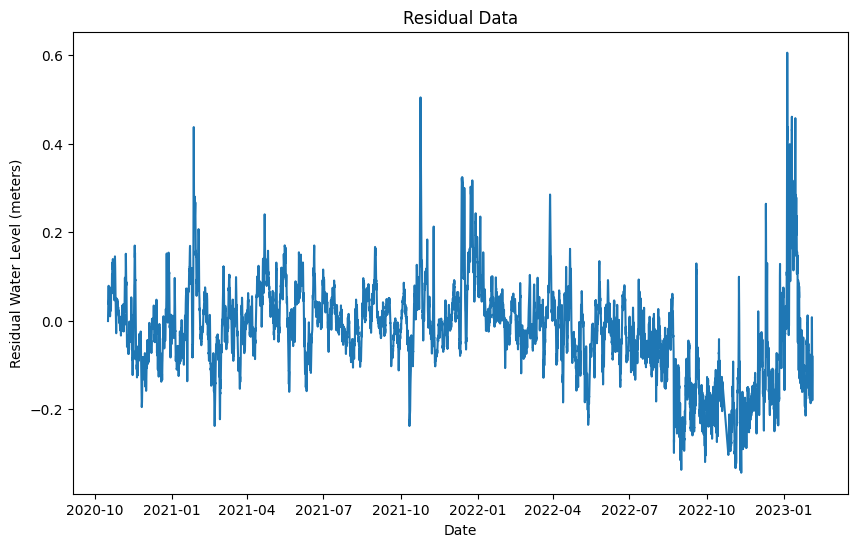

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y[0:20000])
plt.title('Residual Data')
plt.xlabel('Date')
plt.ylabel('Residual Water Level (meters)')
plt.show()

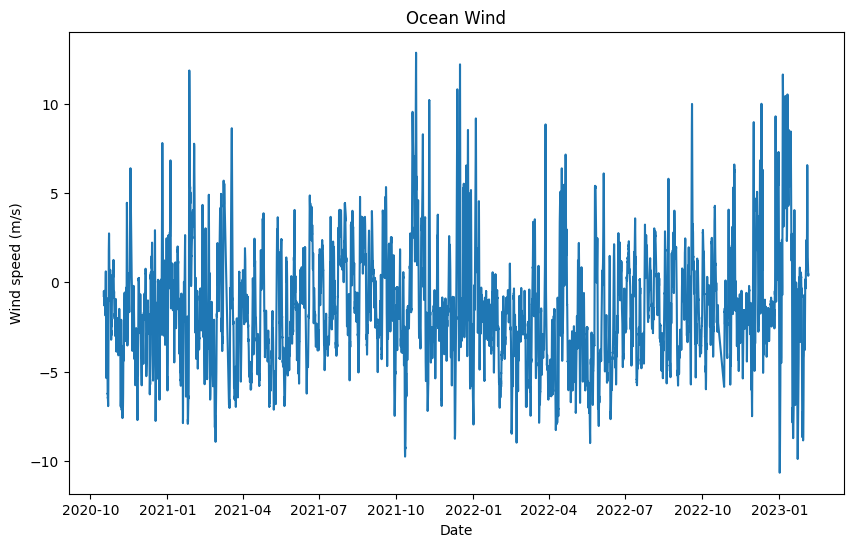

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(X_df['Ocean_wind'][0:20000])
plt.title('Ocean Wind')
plt.xlabel('Date')
plt.ylabel('Wind speed (m/s)')
plt.show()

In [ ]:
#optional model/pipeline step. Run for model setup

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
#X_train, X_test, y_train, y_test = train_test_split(X_df, y, shuffle=True, test_size = 0.15,random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_df[0:20000], y[0:20000], shuffle=False, test_size = 0.1)
scaler = MinMaxScaler()
####Models
#MLPRegressor(hidden_layer_sizes=(50,10), max_iter=500, random_state=42)
#SVR(kernel='rbf', C=0.8, epsilon=0.01, degree=3)
degree=3 # the 3rd degree polynomial is the one that gives the best results
model = MLPRegressor(hidden_layer_sizes=(50,10), max_iter=500, random_state=42)
pipe=make_pipeline(PolynomialFeatures(degree),scaler,model)
pipe.fit(X_train, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(degree=3)),
                ('minmaxscaler', MinMaxScaler()),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=(50, 10), max_iter=500,
                              random_state=42))])

In [ ]:
#hindcast_df =pd.DataFrame(index =X_df.index)
#hindcast_df['hind_res'] = pipe.predict(X_df)
hindcast_df =pd.DataFrame(index =X_train.index)
hindcast_df['hind_res'] = pipe.predict(X_train)

error = y_train - hindcast_df.hind_res

win = 12 # number of points to average
hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

nb_na = hindcast_df.err_12hr_average.isna().sum()

hindcast_df['hind_final_WL'] = Y_df.predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
hindcast_df['obs_final_WL'] = Y_df.stage_m + 1.2025515990257196 #mean
hindcast_df['pred_tide'] = Y_df.predicted + 1.2025515990257196 #mean

d1 = y # Observated Residual
d2 = hindcast_df.hind_res # Model prediction of residual
d3 = hindcast_df.err_12hr_average # average error last 12 hours
d4=Y_df.predicted # Predicted tide
d5=Y_df.stage_m

forecast = pipe.predict(X_val)
forecast_df =pd.DataFrame(data = forecast, index =X_val.index, columns=['pred_res'] )

correction = hindcast_df.err_12hr_average[-1] # the last
forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
pet_stage_1hr.set_index('datetime', inplace=True)

forecast_df['pred_tide'] = pet_stage_1hr['predicted']
forecast_df['pred_final_WL'] = forecast_df.pred_res_corrected  + forecast_df.pred_tide

<ipython-input-36-e09bdb0c509e>:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


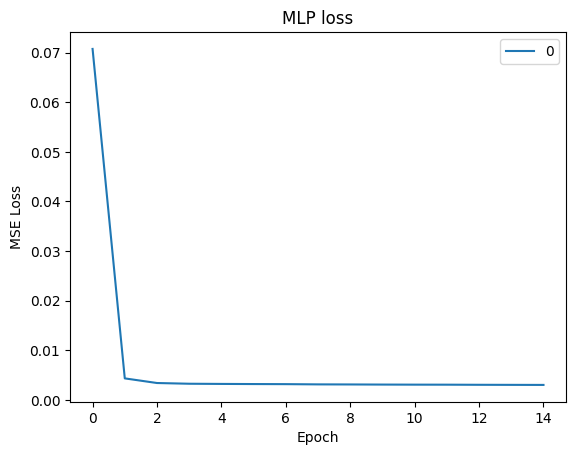

In [ ]:
pd.DataFrame(model.loss_curve_).plot()
plt.ylabel('MSE Loss')
plt.xlabel('Epoch')
plt.title('MLP loss')
plt.show()

Mean Squared Error: 0.023578383095744098
Mean Absolute Error: 0.06730000821885557


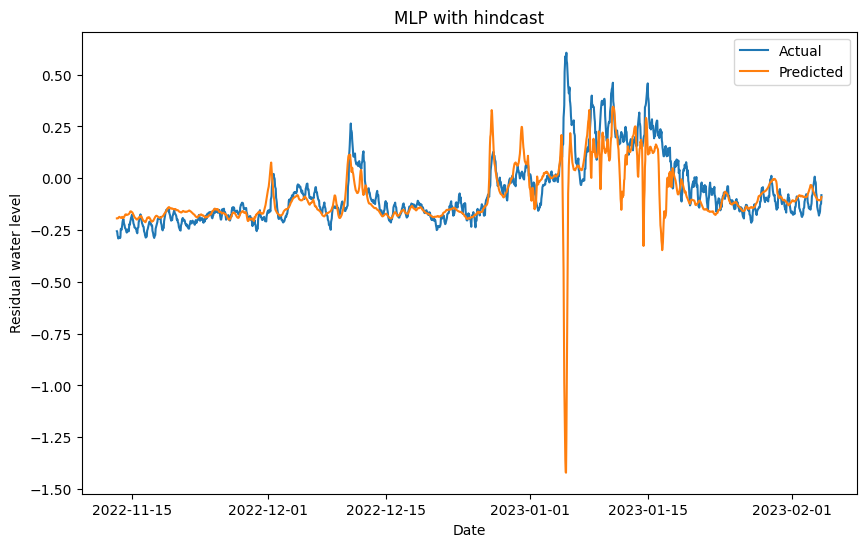

In [ ]:
mse = mean_squared_error(y_val, forecast_df['pred_res_corrected'])
mae = mean_absolute_error(y_val, forecast_df['pred_res_corrected'])
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('MLP with hindcast')
plt.legend()
plt.show()

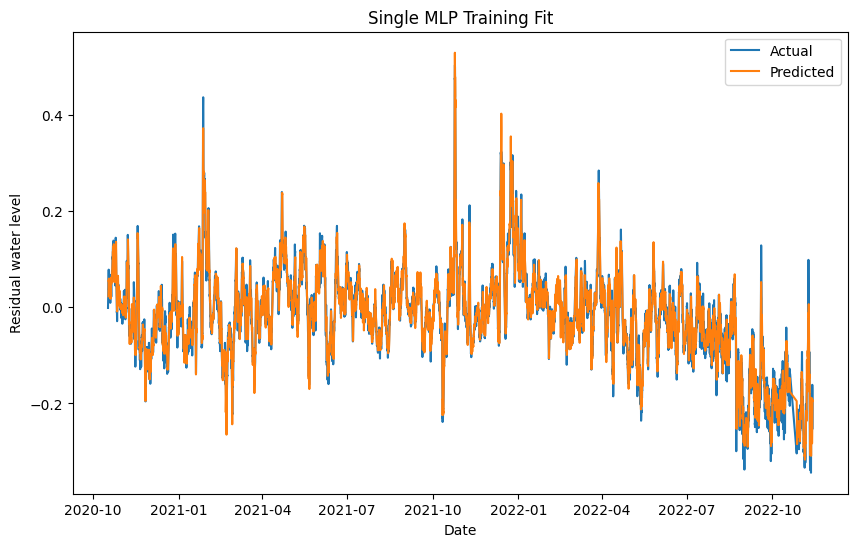

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_train, label='Actual')
plt.plot(hindcast_df['hind_res_corrected'], label='Predicted')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('Single MLP Training Fit')
plt.legend()
plt.show()

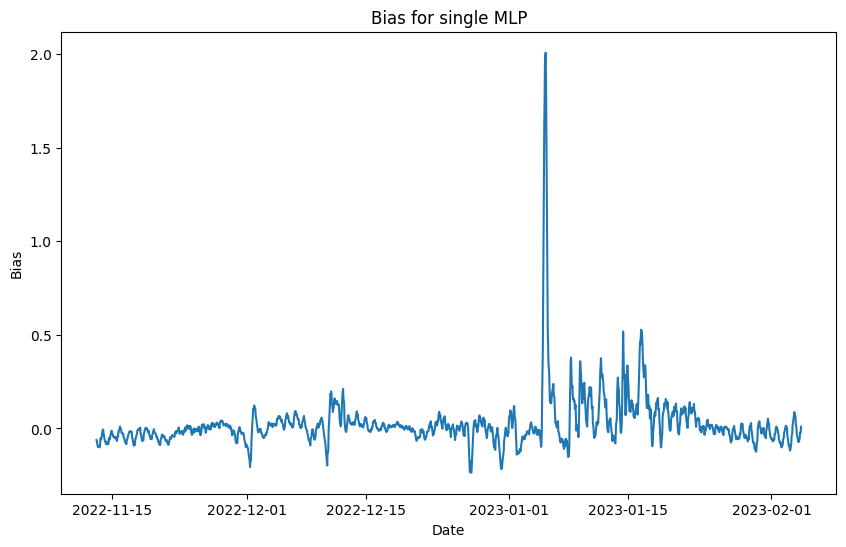

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_val - forecast_df['pred_res_corrected'])
plt.xlabel('Date')
plt.ylabel('Bias')
plt.title('Bias for single MLP')
plt.show()

In [ ]:
print("skew")
print(forecast_df['pred_res_corrected'].skew())
print("kurtosis")
print(forecast_df['pred_res_corrected'].kurtosis())

skew
-1.600681449992022
kurtosis
19.74414686452725


Mean Squared Error: 0.015390831895416934


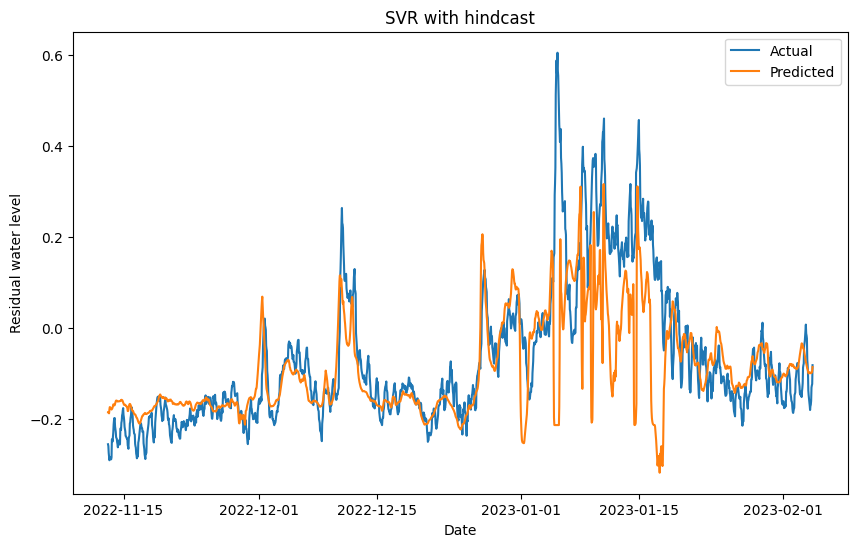

In [ ]:
mse = mean_squared_error(y_val, forecast_df['pred_res_corrected'])
print(f"Mean Squared Error: {mse}")

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('SVR with hindcast')
plt.legend()
plt.show()

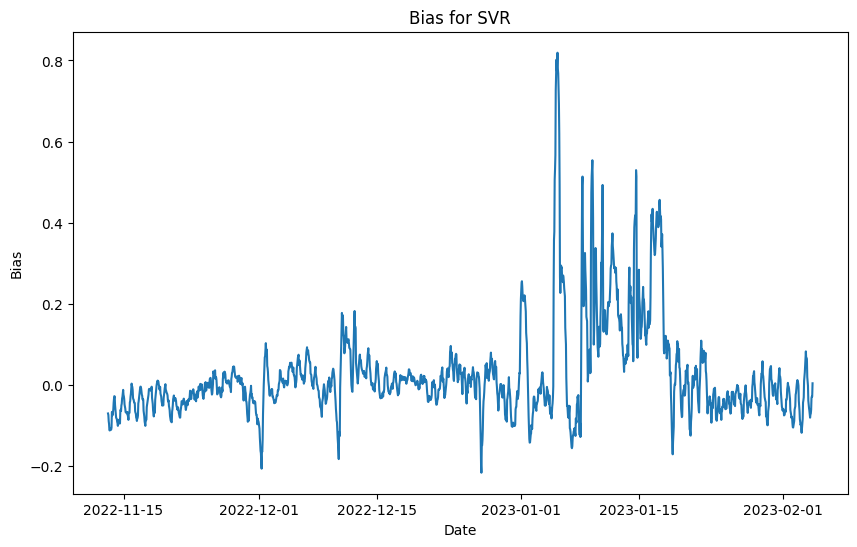

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_val - forecast_df['pred_res_corrected'])
plt.xlabel('Date')
plt.ylabel('Bias')
plt.title('Bias for SVR')
plt.show()

In [ ]:
print("skew")
print(forecast_df['pred_res_corrected'].skew())
print("kurtosis")
print(forecast_df['pred_res_corrected'].kurtosis())

skew
1.0440722171859693
kurtosis
0.6310881913805853


try looking at the shap or lrp values for the models I have tried to see what they are looking at for the extreme values.

##LSTM

In [ ]:
pip install shap

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
def cal_metric(y_true, y_pred, desc):

    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse= np.sqrt(metrics.mean_squared_error(y_true, y_pred)) # or mse**(0.5)
    maxerr = metrics.max_error(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae99 = np.percentile(abs_err, 99)
    ae95 = np.percentile(abs_err, 95)

    print(desc)
    print("MAE:",'{:.4f}'.format(mae))
    print("MSE:", '{:.4f}'.format(mse))
    print("RMSE:", '{:.4f}'.format(rmse))
    print("R2:", '{:.4f}'.format(r2))
    print("MaxErr:", '{:.4f}'.format(maxerr))
    print("99p_AbsErr:", '{:.4f}'.format(ae99))
    print("95p:", '{:.4f}'.format(ae95))
    return (mae, r2, ae95)

def plot_model_forecast(X_train, X_test, X_forecast, Observed, model, title):

    y_train_predictions = model.predict(X_train)
    y_test_predictions = model.predict(X_test)
    y_forecast_predictions = model.predict(X_forecast)
    train_predictions_df =pd.DataFrame(data = y_train_predictions, index =y_train.index )
    test_predictions_df =pd.DataFrame(data = y_test_predictions, index =y_test.index )
    forecast_predictions_df =pd.DataFrame(data = y_forecast_predictions, index =X_forecast.index )


    plt.figure()
    plt.plot(Observed,'k',label = 'Observed WL residual')
    plt.plot(train_predictions_df,'.b',alpha = 0.5, label = 'Train WL residual')
    plt.plot(test_predictions_df,'.r',alpha = 0.5,label = 'Test WL residual')
    plt.plot(forecast_predictions_df,'.g',alpha = 0.5,label = 'Forecast WL residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def plot_model2(X, Observed,model ,title):

    predictions = model.predict(X)
    predictions_df =pd.DataFrame(data = predictions, index =Observed.index )

    plt.figure()
    plt.plot(Observed,'k',label = 'Observed residual')
    plt.plot(predictions_df,'.b',alpha = 0.5, label = 'Predicted residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def lagcorrWL(observation, model_prediction,pred_tide, error_vec, lag):
    lagged=error_vec.shift(lag)
    prediction = model_prediction+lagged+pred_tide
    nb_na = lagged.isna().sum()# count the row that are NaN due to the shift
    thr = -0.1 # exclude the WL that is at low tide because of flat bottom WL
    maskwl = observation>thr #True where WL >thr

    y_true=observation[nb_na:].loc[maskwl]
    y_pred=prediction[nb_na:].loc[maskwl]
    #r2 = metrics.r2_score(y_true, y_pred)
    #mae = metrics.mean_absolute_error(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae95 = np.percentile(abs_err, 95)
    return ae95

In [ ]:
#LSTM data preprocessing and training
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, InputLayer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from keras.optimizers import Adam, SGD, RMSprop

dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
later_y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

In [ ]:
#########################LSTM training step####################################
X = X_df[0:20000]
y = y[0:20000]

#poly is to increase the number of features, it does well at accentuating outlier.
#You can drop this but need to change the n_features back to the X_df.shape[1] in the LSTM
#poly = PolynomialFeatures(degree=2)
#X = poly.fit_transform(X)
#X = pd.DataFrame(X)
#n_features = X.shape[1]

#detrending values, trying mean lower in this code cell
#X = X.diff().dropna()
#y = y.diff().dropna()

# Define the number of previous time steps to consider
look_back = 6 #10, 12, 24, 72, 336

# Create a dataset with lagged features
def create_dataset(X, y, look_back):
    dataX, dataY = [], []
    for i in range(len(X) - look_back - 1):
        a = X[i:(i + look_back)]
        dataX.append(a)
        dataY.append(y[i + look_back])
    return np.array(dataX), np.array(dataY)

def sse_loss(y_true, y_pred):
    return tf.reduce_sum(tf.square(y_true - y_pred))

def r2_loss(y_true, y_pred):
    SS_res =  tf.reduce_sum(tf.square(y_true - y_pred))
    SS_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - (1 - SS_res/(SS_tot + tf.keras.backend.epsilon()))

X, y = create_dataset(X.values, y.values, look_back)

X_train, X_val, y_train, y_val = train_test_split(X, y, shuffle=False, test_size = 0.1)

X_train = np.asarray(X_train)
X_val = np.asarray(X_val)
y_train = np.asarray(y_train)
y_val = np.asarray(y_val)

#detrending mean
#X_train = X_train - np.mean(X_train, axis=1, keepdims=True)
#X_val = X_val - np.mean(X_val, axis=1, keepdims=True)
#y_train = y_train - np.mean(y_train)
#y_val = y_val - np.mean(y_val)

scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()
X_train = scaler_x.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val = scaler_x.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
y_train = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_val = scaler_y.transform(y_val.reshape(-1, 1)).flatten()

model = Sequential()
model.add(InputLayer(shape=(look_back, X_df.shape[1]))) #n_features
model.add(LSTM(8))
model.add(Dense(10, activation='relu'))
#model.add(Dense(5, activation='relu'))
model.add(Dense(1))
model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))

history = model.fit(X_train, y_train, epochs=40, verbose=2) # validation_data=(X_val,y_val)
#trying pipeline as that is what worked with the mlp ensemble
#scaler = MinMaxScaler()
#degree=3
#pipe=make_pipeline(model)
#pipe.fit(X_train, y_train)

Epoch 1/40
563/563 - 11s - 19ms/step - loss: 0.0155
Epoch 2/40
563/563 - 3s - 6ms/step - loss: 0.0092
Epoch 3/40
563/563 - 4s - 7ms/step - loss: 0.0090
Epoch 4/40
563/563 - 3s - 6ms/step - loss: 0.0088
Epoch 5/40
563/563 - 4s - 8ms/step - loss: 0.0087
Epoch 6/40
563/563 - 2s - 4ms/step - loss: 0.0086
Epoch 7/40
563/563 - 2s - 4ms/step - loss: 0.0085
Epoch 8/40
563/563 - 3s - 5ms/step - loss: 0.0084
Epoch 9/40
563/563 - 3s - 5ms/step - loss: 0.0082
Epoch 10/40
563/563 - 2s - 4ms/step - loss: 0.0082
Epoch 11/40
563/563 - 2s - 4ms/step - loss: 0.0081
Epoch 12/40
563/563 - 2s - 4ms/step - loss: 0.0080
Epoch 13/40
563/563 - 2s - 4ms/step - loss: 0.0080
Epoch 14/40
563/563 - 3s - 5ms/step - loss: 0.0079
Epoch 15/40
563/563 - 4s - 8ms/step - loss: 0.0079
Epoch 16/40
563/563 - 3s - 5ms/step - loss: 0.0078
Epoch 17/40
563/563 - 2s - 4ms/step - loss: 0.0078
Epoch 18/40
563/563 - 3s - 5ms/step - loss: 0.0078
Epoch 19/40
563/563 - 4s - 7ms/step - loss: 0.0078
Epoch 20/40
563/563 - 2s - 4ms/step - 

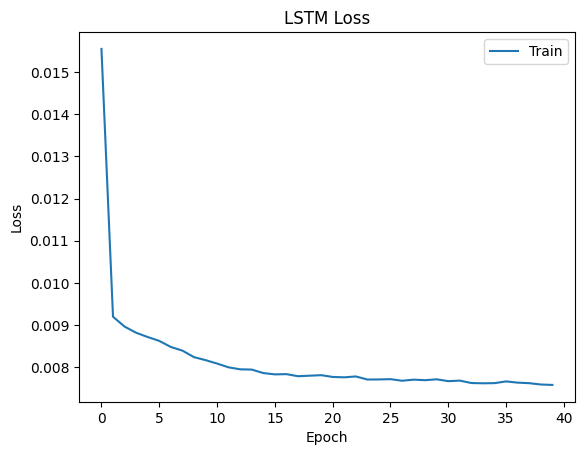

In [ ]:
plt.plot(history.history['loss'])  # Plot training loss
plt.title('LSTM Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step
Validation MSE: 0.020760094066495927
Validation MAE: 0.12902134546934144


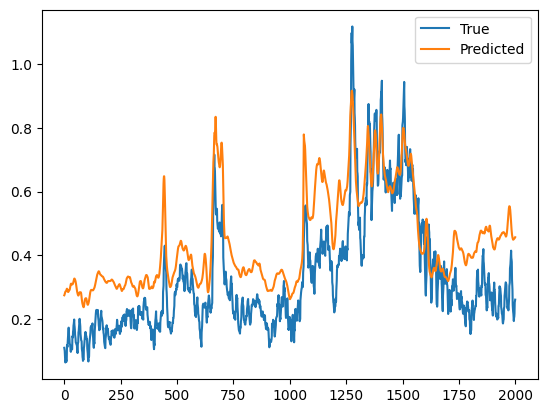

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

y_pred = model.predict(X_val)
#y_pred = scaler_y.inverse_transform(y_pred.reshape(-1, 1)).flatten()
mse = mean_squared_error(y_val, y_pred)
mae = mean_absolute_error(y_val, y_pred)
print(f"Validation MSE: {mse}")
print(f"Validation MAE: {mae}")

plt.plot(y_val, label='True')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Validation MSE: 0.007210415282838238
Validation MAE: 0.06061482610296271


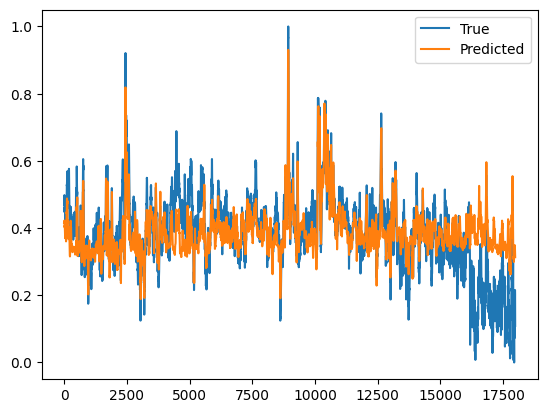

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

y_pred = model.predict(X_train)
mse = mean_squared_error(y_train, y_pred)
mae = mean_absolute_error(y_train, y_pred)
print(f"Validation MSE: {mse}")
print(f"Validation MAE: {mae}")

plt.plot(y_train, label='True')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

shap

In [ ]:
import shap

flat_train = X_train.reshape(X_train.shape[0], -1)
flat_val = X_val.reshape(X_val.shape[0], -1)
def predict_flattened(X):
    X_reshaped = X.reshape(X.shape[0], look_back, 4)
    return model.predict(X_reshaped)

explainer = shap.Explainer(predict_flattened, flat_train[:100])
shap_values = explainer.shap_values(flat_val)

In [ ]:
shap_values.shape

(2000, 24)

In [ ]:
test = shap_values.reshape(shap_values.shape[0], 6, 4)
print(test.shape)

(2000, 6, 4)


In [ ]:
aggregated_shap = []

for i in range(test.shape[0]):
    aggregated_shap.append(np.mean(test[i], axis=0))

shap_values_aggregated = np.stack(aggregated_shap, axis=0)

print("Aggregated SHAP shape:", shap_values_aggregated.shape)

Aggregated SHAP shape: (2000, 4)


In [ ]:
shap_values_aggregated

array([[-0.00981927, -0.00132698, -0.00480038,  0.        ],
       [-0.00943682, -0.001011  , -0.00409804,  0.        ],
       [-0.00933983, -0.0008314 , -0.00381129,  0.        ],
       ...,
       [-0.01441822,  0.00285965,  0.00395458,  0.02258885],
       [-0.01462841,  0.00289454,  0.00394157,  0.02283437],
       [-0.01444036,  0.00266591,  0.0041152 ,  0.02282301]])

In [ ]:
y_val_indices = np.arange(1, len(y_val) )
y_val_array = np.array(y_val_indices)

y_val_array
shap.plots.heatmap(shap_values, instance_order=y_val_array)

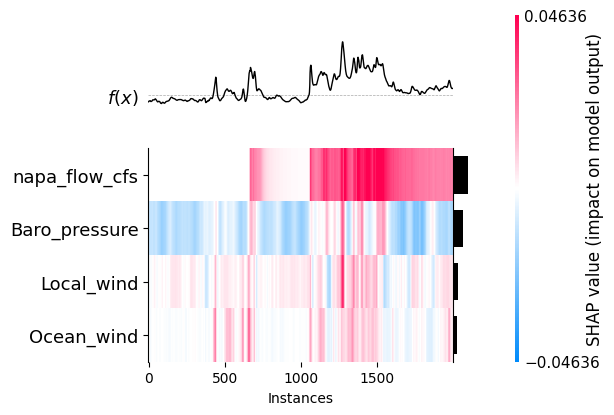

<Axes: xlabel='Instances'>

In [ ]:
shap_values_2D = shap_values.reshape(shap_values.shape[0], -1)

# Creating a list of feature names
#feature_names = [f"Feature {i}" for i in range(shap_values_2D.shape[1])]
feature_names = ['Baro_pressure', 'Ocean_wind', 'Local_wind', 'napa_flow_cfs']

# Create Explanation object
test_values = shap.Explanation(shap_values_aggregated, data=flat_val, feature_names=feature_names)
y_val_indices = np.arange(1, 2000)
y_val_array = np.array(y_val_indices)

# Plot the heatmap with the reshaped shap_values
shap.plots.heatmap(test_values, instance_order=y_val_array)

In [ ]:
dfX_train, dfX_test, dfY_train, dfY_test = train_test_split(X_df[0:20000], later_y[0:20000], shuffle=False, test_size = 0.1)
hindcast_df =pd.DataFrame(index =dfX_train.index[12:18000])
hindcast_df['hind_res'] = model.predict(X_train)

error = dfY_train - hindcast_df.hind_res

win = 12 # number of points to average
hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

nb_na = hindcast_df.err_12hr_average.isna().sum()

hindcast_df['hind_final_WL'] = Y_df[0:22040].predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
hindcast_df['obs_final_WL'] = Y_df[0:22040].stage_m + 1.2025515990257196 #mean
hindcast_df['pred_tide'] = Y_df[0:22040].predicted + 1.2025515990257196 #mean

forecast = model.predict(X_val)
forecast_df =pd.DataFrame(data = forecast, index =dfX_test.index[1:2000], columns=['pred_res'] )

correction = hindcast_df.err_12hr_average[-1] # the last
forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
pet_stage_1hr.set_index('datetime', inplace=True)

forecast_df['pred_tide'] = pet_stage_1hr['predicted']
forecast_df['pred_final_WL'] = forecast_df.pred_res_corrected  + forecast_df.pred_tide

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


<ipython-input-15-e5cb4e7e2ae2>:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.28764356022860904


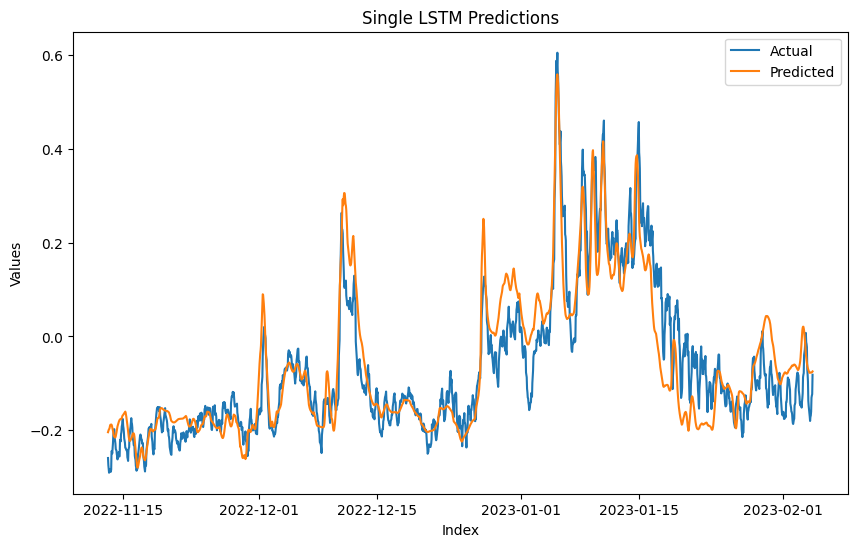

In [ ]:
mse = mean_squared_error(dfY_test[1:2000], forecast_df['pred_res'])
print(f"Mean Squared Error: {mse}")

plt.figure(figsize=(10, 6))
plt.plot(dfY_test[1:2000], label='Actual')
plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Single LSTM Predictions')
plt.legend()
plt.show()

Mean Squared Error: 0.28802394383993907


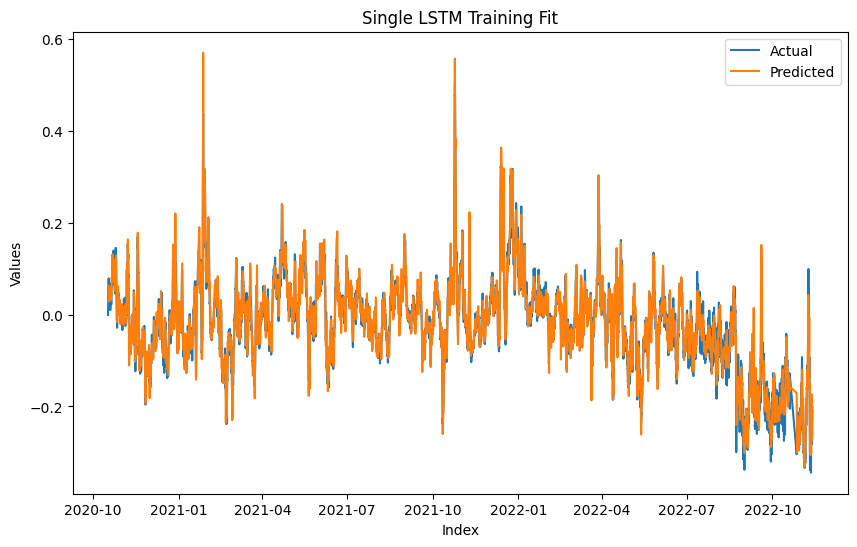

In [ ]:
mse = mean_squared_error(dfY_test[0:1999], forecast_df['pred_res'])
print(f"Mean Squared Error: {mse}")

plt.figure(figsize=(10, 6))
plt.plot(dfY_train[0:17990], label='Actual')
plt.plot(hindcast_df['hind_res_corrected'], label='Predicted')
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Single LSTM Training Fit')
plt.legend()
plt.show()

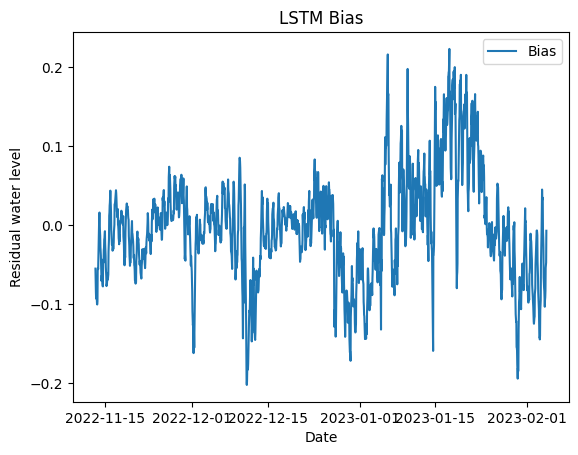

In [ ]:
plt.plot(dfY_test[1:2000] - forecast_df['pred_res_corrected'], label='Bias')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('LSTM Bias')
plt.legend()

##LSTM ensemble

In [ ]:
pip install shap

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle
import shap

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
#LSTM training step
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, InputLayer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
later_y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

X = X_df[0:20000]
y = y[0:20000]

#poly = PolynomialFeatures(degree=2)
#X = poly.fit_transform(X)
#X = pd.DataFrame(X)

# Define the number of previous time steps to consider
look_back = 6
n_features = X.shape[1]

# Create a dataset with lagged features
def create_dataset(X, y, look_back):
    dataX, dataY = [], []
    for i in range(len(X) - look_back - 1):
        a = X[i:(i + look_back)]
        dataX.append(a)
        dataY.append(y[i + look_back])
    return np.array(dataX), np.array(dataY)

def sse_loss(y_true, y_pred):
    return tf.reduce_sum(tf.square(y_true - y_pred))

def r2_loss(y_true, y_pred):
    SS_res =  tf.reduce_sum(tf.square(y_true - y_pred))
    SS_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - (1 - SS_res/(SS_tot + tf.keras.backend.epsilon()))

X, y = create_dataset(X.values, y.values, look_back)

X_train, X_val, y_train, y_val = train_test_split(X, y, shuffle=False, test_size = 0.1)

X_train = np.asarray(X_train)
X_val = np.asarray(X_val)
y_train = np.asarray(y_train)
y_val = np.asarray(y_val)
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()
X_train = scaler_x.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val = scaler_x.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
y_train = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_val = scaler_y.transform(y_val.reshape(-1, 1)).flatten()
print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(17993, 6, 4)
(2000, 6, 4)
(17993,)
(2000,)


In [ ]:
aggregate_final_res = pd.DataFrame(index=X_df.index[(20000 - X_val.shape[0]):20000]) #17990
mse_list = []
shap_list = []
mae_list = []

for i in range(10):
    model = Sequential()
    #model.add(InputLayer(shape=(None, X_train.shape[1])))
    model.add(InputLayer(shape=(look_back, n_features))) #n_features or X_train.shape[1]
    model.add(LSTM(10, activation='relu', recurrent_activation='sigmoid'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mse', optimizer='adam')

    #pipe=make_pipeline(model)
    model.fit(X_train, y_train, epochs=20, verbose=1)

    dfX_train, dfX_test, dfY_train, dfY_test = train_test_split(X_df[0:20000], later_y[0:20000], shuffle=False, test_size = 0.1)
    hindcast_df =pd.DataFrame(index =dfX_train.index[(18000 - X_train.shape[0]):18000])
    hindcast_df['hind_res'] = model.predict(X_train)

    error = dfY_train - hindcast_df.hind_res

    win = 12 # number of points to average
    hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

    hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

    nb_na = hindcast_df.err_12hr_average.isna().sum()

    hindcast_df['hind_final_WL'] = Y_df[0:22040].predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
    hindcast_df['obs_final_WL'] = Y_df[0:22040].stage_m + 1.2025515990257196 #mean
    hindcast_df['pred_tide'] = Y_df[0:22040].predicted + 1.2025515990257196 #mean

    forecast = model.predict(X_val)
    forecast_df =pd.DataFrame(data = forecast, index =dfX_test.index[(2000 - X_val.shape[0]):2000], columns=['pred_res'] )

    correction = hindcast_df.err_12hr_average[-1] # the last
    forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

    aggregate_final_res['pred_res_'+str(i)] = forecast_df['pred_res_corrected']
    #aggregate_final_res['pred_res_'+str(i)] = forecast
    print(aggregate_final_res.shape)

    mse = mean_squared_error(y_val, forecast)
    mse_list.append(mse)
    print(f"Mean Squared Error: {mse}")

    mae = mean_absolute_error(y_val, forecast)
    mae_list.append(mae)
    print(f"Mean Absolute Error: {mae}")

    # Calculates the SHAP values - It takes some time
    #flat_train = X_train.reshape(X_train.shape[0], -1)
    #flat_val = X_val.reshape(X_val.shape[0], -1)
    def predict_flattened(X):
        X_reshaped = X.reshape(X.shape[0], look_back, n_features)
        return model.predict(X_reshaped)

    #explainer = shap.Explainer(predict_flattened, flat_train[:100])
    #shap_values = explainer.shap_values(flat_val)
    #shap_list.append(shap_values)

    #mse = mean_squared_error(dfY_test[0:1999], forecast_df['pred_res'])
    #print(f"Mean Squared Error: {mse}")

    #plt.figure(figsize=(10, 6))
    #plt.plot(dfY_test[(2000 - X_val.shape[0]):2000], label='Actual')
    #plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
    #plt.xlabel('Index')
    #plt.ylabel('Values')
    #plt.title('LSTM')
    #plt.legend()
    #plt.show()

Epoch 1/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0134
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0090
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0086
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0087
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0087
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0085
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0085
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0085
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0083
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0084
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0082
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0150
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0089
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0088
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0086
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0085
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0087
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0083
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0082
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0083
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0081
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0080
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0079


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0209
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0103
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0091
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0091
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0088
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0084
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0138
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0093
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0083
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0083
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0079
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0080
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0078
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0079


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0192
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0089
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0088
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0087
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0087
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0081
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0082
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0079


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0133
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0092
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0081
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0080
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0079
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0079


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0137
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0097
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0093
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0092
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0091
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0089
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0089
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0087
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0084
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0083
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0131
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0089
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0084
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0084
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0142
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0089
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0089
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0088
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0083
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0081


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0156
Epoch 2/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0089
Epoch 3/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
Epoch 4/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0086
Epoch 5/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0083
Epoch 6/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0085
Epoch 7/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0086
Epoch 8/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0082
Epoch 9/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0082
Epoch 10/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 11/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 12/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0079
Epoch 13/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080
Epoch 14/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0079
Epoch 15/20
563/563 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0080


<ipython-input-49-31fb4df1b57a>:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


In [ ]:
shap_array = np.array(shap_list)
test = shap_array.reshape(shap_array.shape[0], shap_array.shape[1], 6, 4)
print(test.shape)

(3, 2000, 6, 4)


(2000, 4)
Aggregated SHAP shape: (2000, 4)


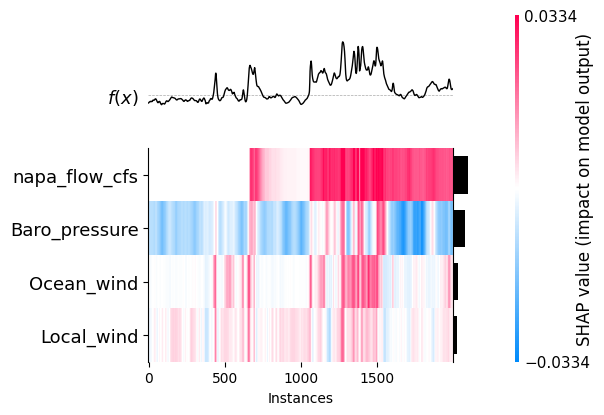

<Axes: xlabel='Instances'>

In [ ]:
#test = shap_values.reshape(shap_values.shape[0], 6, 4)
#print(test.shape)

shap_final = []

for i in range(test.shape[0]):
    aggregated_shap = []
    for j in range(test.shape[1]):
        aggregated_shap.append(np.mean(test[i][j], axis=0))
    shap_final.append(aggregated_shap)


aggregated_shap = np.array(shap_final)
aggregated_shap = np.mean(aggregated_shap, axis=0)
print(aggregated_shap.shape)

shap_values_aggregated = np.stack(aggregated_shap, axis=0)

print("Aggregated SHAP shape:", shap_values_aggregated.shape)

#shap_values_2D = shap_values.reshape(shap_values.shape[0], -1)

# Creating a list of feature names
#feature_names = [f"Feature {i}" for i in range(shap_values_2D.shape[1])]
feature_names = ['Baro_pressure', 'Ocean_wind', 'Local_wind', 'napa_flow_cfs']

# Create Explanation object
test_values = shap.Explanation(shap_values_aggregated, data=flat_val, feature_names=feature_names)
y_val_indices = np.arange(1, 2000)
y_val_array = np.array(y_val_indices)

# Plot the heatmap with the reshaped shap_values
shap.plots.heatmap(test_values, instance_order=y_val_array)

Overall Mean Squared Error: 0.026687861213667497
Overall Mean Absolute Error: 0.15050921422528352


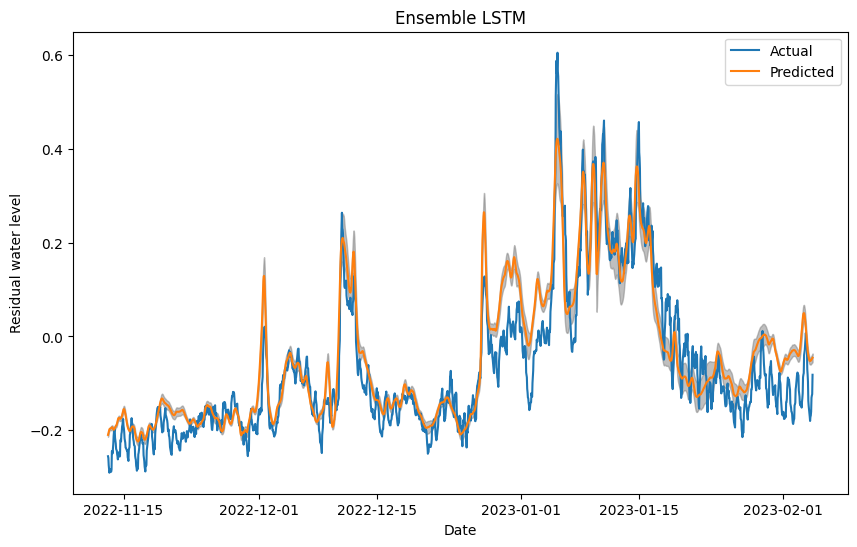

In [ ]:
overall_mse = np.mean(mse_list)
overall_mae = np.mean(mae_list)
print(f"Overall Mean Squared Error: {overall_mse}")
print(f"Overall Mean Absolute Error: {overall_mae}")

aggregate_final_res['pred_res_mean'] = aggregate_final_res.iloc[:, :10].mean(axis=1) #aggregate_final_res.mean(axis=1)
aggregate_final_res['std_dev'] = aggregate_final_res.iloc[:, :10].std(axis=1) #aggregate_final_res.std(axis=1)
upper_bound = aggregate_final_res['pred_res_mean'] + aggregate_final_res['std_dev']
lower_bound = aggregate_final_res['pred_res_mean'] - aggregate_final_res['std_dev']

plt.figure(figsize=(10, 6))
plt.plot(dfY_test[(2000 - X_val.shape[0]):2000], label='Actual')
plt.plot(aggregate_final_res['pred_res_mean'], label='Predicted')
plt.fill_between(dfY_test.index[(2000 - X_val.shape[0]):2000], upper_bound, lower_bound, color='gray', alpha=0.5)
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.legend()
plt.title('Ensemble LSTM')
plt.show()

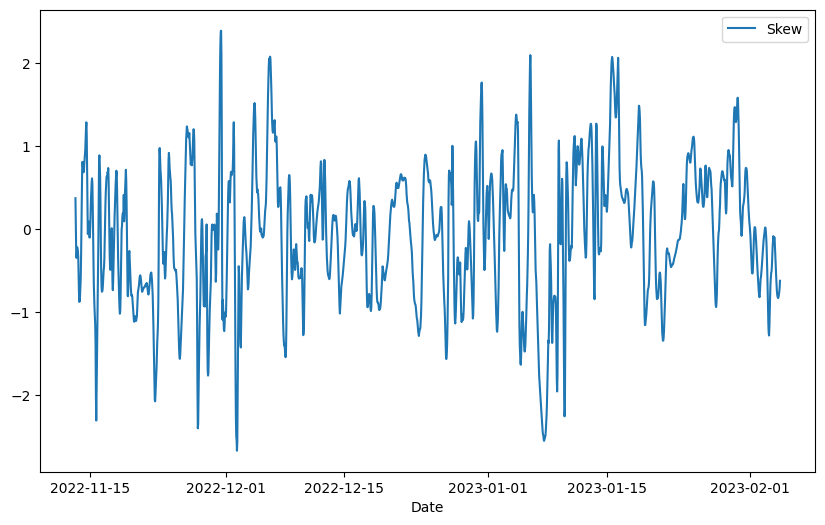

In [ ]:
aggregate_final_res['pred_res_skew'] = aggregate_final_res.iloc[:, :10].skew(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_skew'], label='Skew')
plt.xlabel('Date')
plt.legend()

In [ ]:
upper_bound.shape

(2000,)

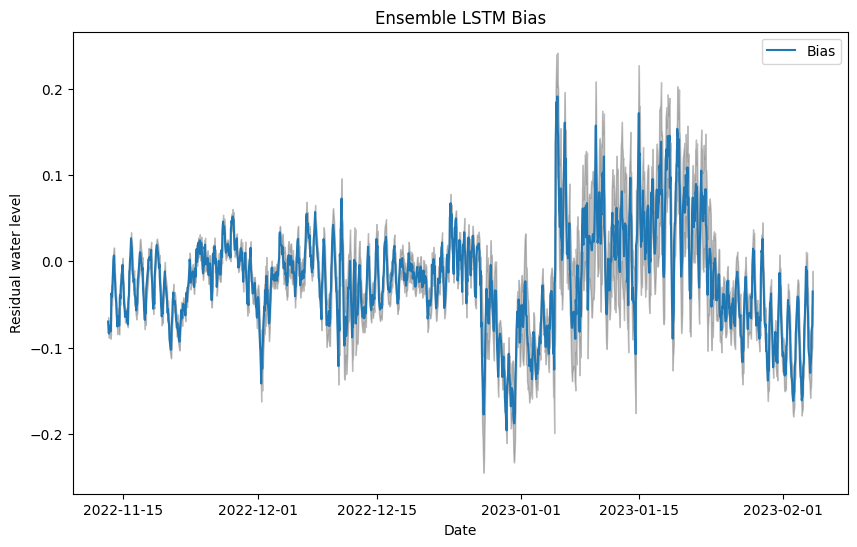

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(dfY_test - aggregate_final_res['pred_res_mean'], label='Bias')
upper_bound = dfY_test[2:2000] - aggregate_final_res['pred_res_mean'] + aggregate_final_res['std_dev']
lower_bound = dfY_test[2:2000] - aggregate_final_res['pred_res_mean'] - aggregate_final_res['std_dev']
plt.fill_between(dfY_test.index[(2000 - X_val.shape[0]):2000], upper_bound, lower_bound, color='gray', alpha=0.5)

plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('Ensemble LSTM Bias')
plt.legend()

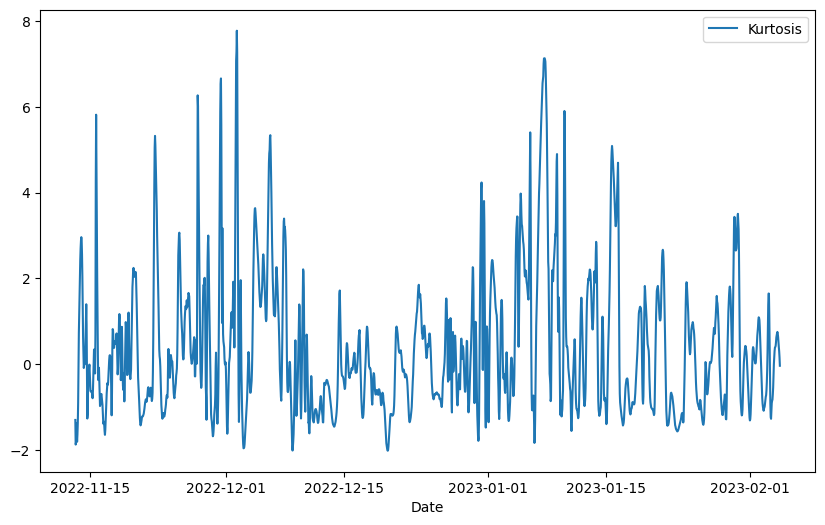

In [ ]:
aggregate_final_res['pred_res_kurtosis'] = aggregate_final_res.iloc[:, :10].kurtosis(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_kurtosis'], label='Kurtosis')
plt.xlabel('Date')
plt.legend()

##MLP Ensemble with shap values

In [ ]:
pip install shap

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle
import shap

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

In [ ]:
def cal_metric(y_true, y_pred, desc):

    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse= np.sqrt(metrics.mean_squared_error(y_true, y_pred)) # or mse**(0.5)
    maxerr = metrics.max_error(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae99 = np.percentile(abs_err, 99)
    ae95 = np.percentile(abs_err, 95)

    print(desc)
    print("MAE:",'{:.4f}'.format(mae))
    print("MSE:", '{:.4f}'.format(mse))
    print("RMSE:", '{:.4f}'.format(rmse))
    print("R2:", '{:.4f}'.format(r2))
    print("MaxErr:", '{:.4f}'.format(maxerr))
    print("99p_AbsErr:", '{:.4f}'.format(ae99))
    print("95p:", '{:.4f}'.format(ae95))
    return (mae, r2, ae95)

def plot_model_forecast(X_train, X_test, X_forecast, Observed, model, title):

    y_train_predictions = model.predict(X_train)
    y_test_predictions = model.predict(X_test)
    y_forecast_predictions = model.predict(X_forecast)
    train_predictions_df =pd.DataFrame(data = y_train_predictions, index =y_train.index )
    test_predictions_df =pd.DataFrame(data = y_test_predictions, index =y_test.index )
    forecast_predictions_df =pd.DataFrame(data = y_forecast_predictions, index =X_forecast.index )


    plt.figure()
    plt.plot(Observed,'k',label = 'Observed WL residual')
    plt.plot(train_predictions_df,'.b',alpha = 0.5, label = 'Train WL residual')
    plt.plot(test_predictions_df,'.r',alpha = 0.5,label = 'Test WL residual')
    plt.plot(forecast_predictions_df,'.g',alpha = 0.5,label = 'Forecast WL residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def plot_model2(X, Observed,model ,title):

    predictions = model.predict(X)
    predictions_df =pd.DataFrame(data = predictions, index =Observed.index )

    plt.figure()
    plt.plot(Observed,'k',label = 'Observed residual')
    plt.plot(predictions_df,'.b',alpha = 0.5, label = 'Predicted residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def lagcorrWL(observation, model_prediction,pred_tide, error_vec, lag):
    lagged=error_vec.shift(lag)
    prediction = model_prediction+lagged+pred_tide
    nb_na = lagged.isna().sum()# count the row that are NaN due to the shift
    thr = -0.1 # exclude the WL that is at low tide because of flat bottom WL
    maskwl = observation>thr #True where WL >thr

    y_true=observation[nb_na:].loc[maskwl]
    y_pred=prediction[nb_na:].loc[maskwl]
    #r2 = metrics.r2_score(y_true, y_pred)
    #mae = metrics.mean_absolute_error(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae95 = np.percentile(abs_err, 95)
    return ae95

In [ ]:
dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_df[0:20000], y[0:20000], shuffle=False, test_size = 0.1)

aggregate_final_res = pd.DataFrame(index=X_val.index)
mse_list = []
degree = 3
shap_list = []
mae_list = []

for i in range(10):
    scaler = MinMaxScaler()
    pipe=make_pipeline(PolynomialFeatures(degree),scaler,MLPRegressor(hidden_layer_sizes=(50,50), max_iter=500)) #random_state=42
    pipe.fit(X_train, y_train)

    hindcast_df =pd.DataFrame(index =X_train.index)
    hindcast_df['hind_res'] = pipe.predict(X_train)
    error = y_train - hindcast_df.hind_res

    win = 12 # number of points to average
    hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

    hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

    nb_na = hindcast_df.err_12hr_average.isna().sum()

    hindcast_df['hind_final_WL'] = Y_df.predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
    hindcast_df['obs_final_WL'] = Y_df.stage_m + 1.2025515990257196 #mean
    hindcast_df['pred_tide'] = Y_df.predicted + 1.2025515990257196 #mean

    forecast = pipe.predict(X_val)
    forecast_df =pd.DataFrame(data = forecast, index =X_val.index, columns=['pred_res'] )

    correction = hindcast_df.err_12hr_average[-1] # the last
    forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

    pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
    pet_stage_1hr.set_index('datetime', inplace=True)

    forecast_df['pred_tide'] = pet_stage_1hr['predicted']
    forecast_df['pred_final_WL'] = forecast_df.pred_res_corrected  + forecast_df.pred_tide

    aggregate_final_res['pred_res_'+str(i)] = forecast_df['pred_res_corrected']

    mse = mean_squared_error(y_val, forecast_df['pred_res_corrected'])
    mse_list.append(mse)
    print(f"Mean Squared Error: {mse}")

    mae = mean_absolute_error(y_val, forecast_df['pred_res_corrected'])
    mae_list.append(mae)
    print(f"Mean Absolute Error: {mae}")

    # Fits the explainer
    #explainer = shap.Explainer(pipe.predict , X_train)
    # Calculates the SHAP values - It takes some time
    #shap_values = explainer(X_val)
    #shap_list.append(shap_values)

    #plt.figure(figsize=(10, 6))
    #plt.plot(y_val, label='Actual')
    #plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
    #plt.xlabel('Date')
    #plt.ylabel('Residual water level')
    #plt.title('MLP with hindcast')
    #plt.legend()
    #plt.show()

<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.005123015826365112
Mean Absolute Error: 0.0528708289734909


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.00462731106189187
Mean Absolute Error: 0.051530785912253456


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.004233169854359024
Mean Absolute Error: 0.04837385044498806


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.012121394650701561
Mean Absolute Error: 0.05760073885934741


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.004395710550171788
Mean Absolute Error: 0.0489394386630382


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.015593293386850676
Mean Absolute Error: 0.05750368511562281


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.005489706504540193
Mean Absolute Error: 0.05223517931213634


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.004224667788635438
Mean Absolute Error: 0.04712225431417164


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.007543126679407959
Mean Absolute Error: 0.058477957127756254
Mean Squared Error: 0.0057673357836857874
Mean Absolute Error: 0.051368660308775446


<ipython-input-45-62fce78069fe>:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Overall Mean Squared Error: 0.00691187320866094
Overall Mean Absolute Error: 0.05260233790315806


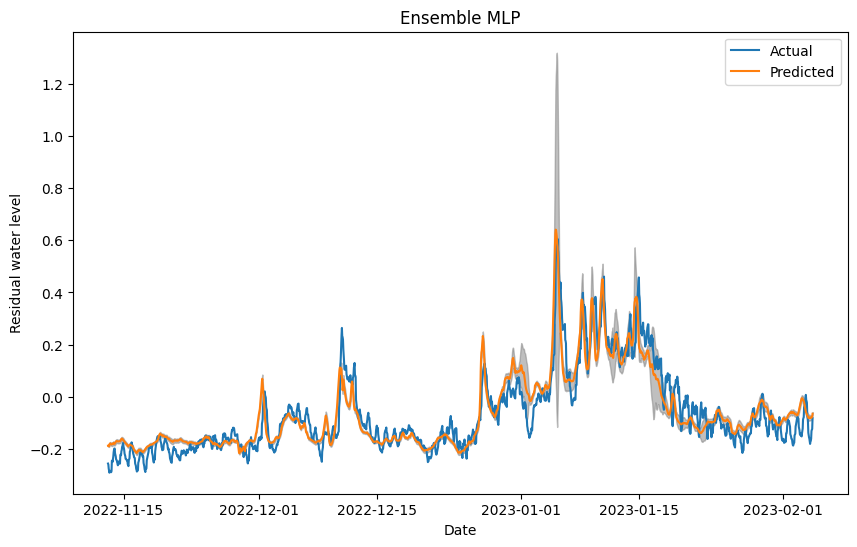

In [ ]:
overall_mse = np.mean(mse_list)
overall_mae = np.mean(mae_list)
print(f"Overall Mean Squared Error: {overall_mse}")
print(f"Overall Mean Absolute Error: {overall_mae}")

aggregate_final_res['pred_res_mean'] = aggregate_final_res.mean(axis=1)
aggregate_final_res['std_dev'] = aggregate_final_res.std(axis=1)
upper_bound = aggregate_final_res['pred_res_mean'] + aggregate_final_res['std_dev']
lower_bound = aggregate_final_res['pred_res_mean'] - aggregate_final_res['std_dev']

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(aggregate_final_res['pred_res_mean'], label='Predicted')
plt.fill_between(y_val.index, upper_bound, lower_bound, color='gray', alpha=0.5)
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.legend()
plt.title('Ensemble MLP')
plt.show()

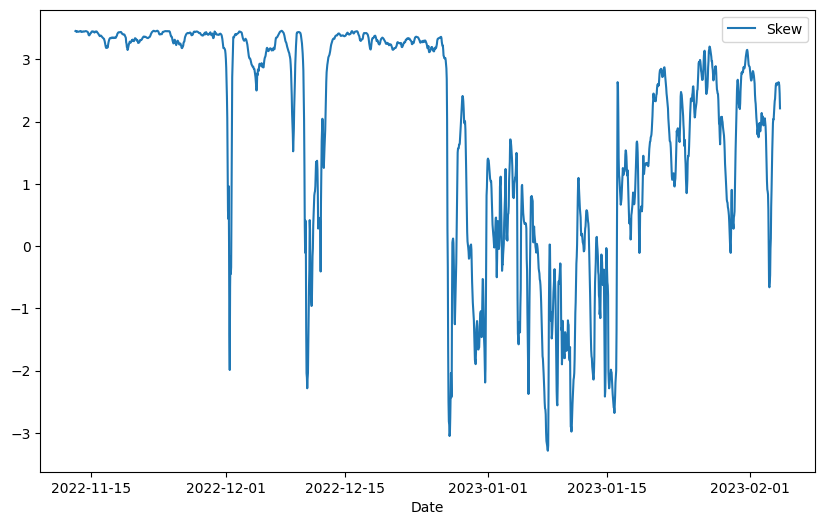

In [ ]:
aggregate_final_res['pred_res_skew'] = aggregate_final_res.skew(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_skew'], label='Skew')
plt.xlabel('Date')
plt.legend()

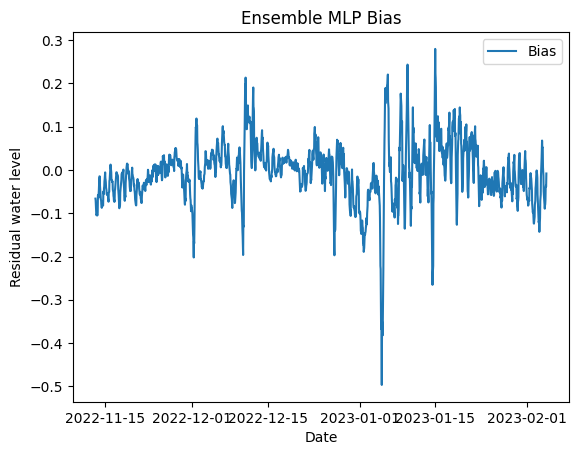

In [ ]:
plt.plot(y_val - aggregate_final_res['pred_res_mean'], label='Bias')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('Ensemble MLP Bias')
plt.legend()

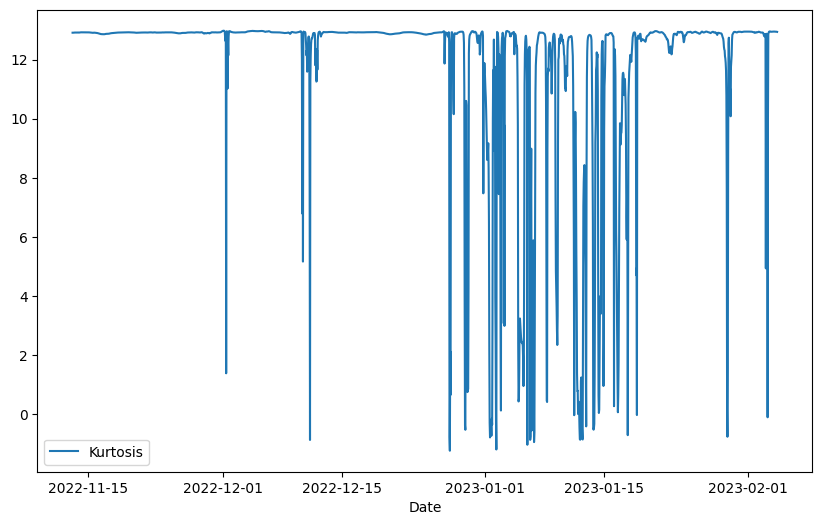

In [ ]:
aggregate_final_res['pred_res_skew'] = aggregate_final_res.kurtosis(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_skew'], label='Kurtosis')
plt.xlabel('Date')
plt.legend()

In [ ]:
shap_mean = shap_list[0].base_values
shap_v = 0
shap_bv = 0
shap_d = 0

for i in range(len(shap_list)):
    shap_v = shap_v + shap_list[i].values
    shap_bv = shap_bv + shap_list[i].base_values
    shap_d = shap_d + shap_list[i].data

shap_v = shap_v/10
shap_bv = shap_bv/10
shap_d = shap_d/10

shap_aggregate = [shap_v, shap_bv, shap_d]
shap_aggregate = shap.Explanation(shap_v, shap_bv, shap_d, feature_names=X_df.columns)

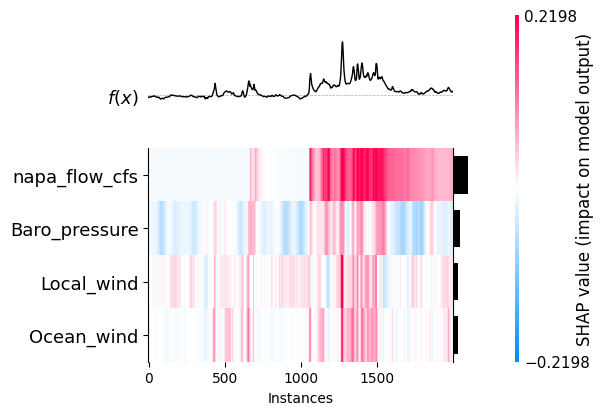

<Axes: xlabel='Instances'>

In [ ]:
y_val_indices = np.arange(1, len(y_val) )
y_val_array = np.array(y_val_indices)

y_val_array
shap.plots.heatmap(shap_aggregate, instance_order=y_val_array)

#try plotting the bias in place of f(x)

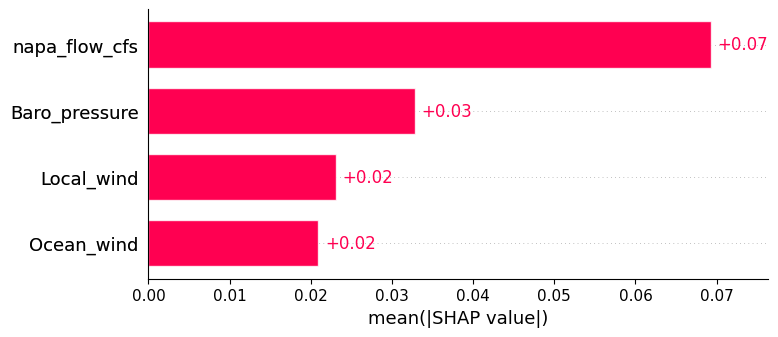

In [ ]:
shap.plots.bar(shap_aggregate)

##Shap Values

In [ ]:
pip install shap

In [ ]:
import shap

# Fits the explainer
explainer = shap.Explainer(pipe.predict , X_train)
# Calculates the SHAP values - It takes some time
shap_values = explainer(X_val)

ExactExplainer explainer: 2001it [00:18, 52.13it/s]                           


In [ ]:
type(shap_values)

shap._explanation.Explanation

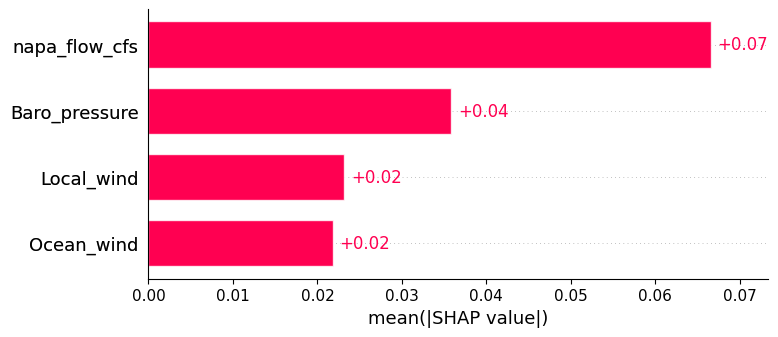

In [ ]:
shap.plots.bar(shap_values)

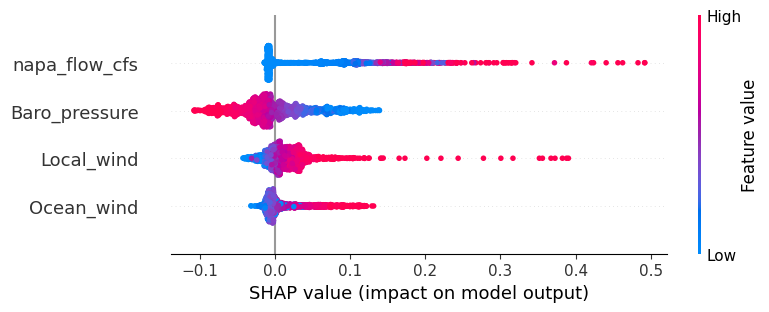

In [ ]:
shap.plots.beeswarm(shap_values)

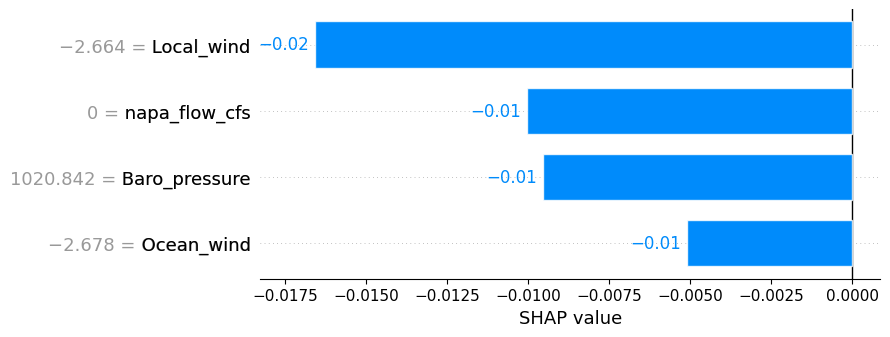

In [ ]:
shap.plots.bar(shap_values[0])

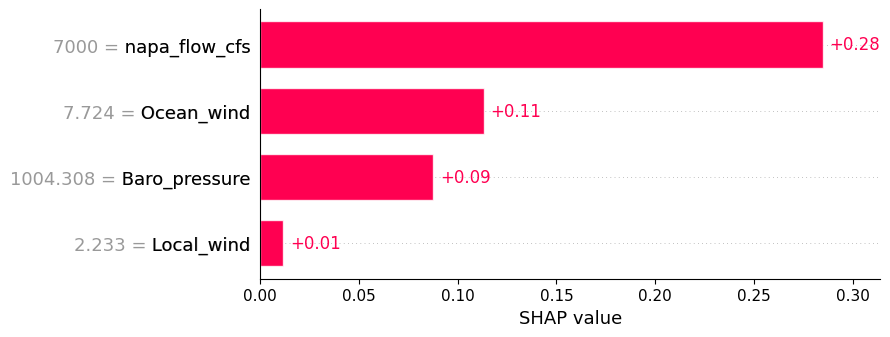

In [ ]:
shap.plots.bar(shap_values[1500])

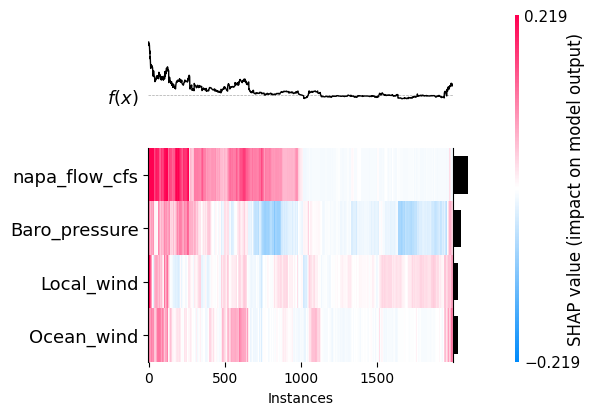

<Axes: xlabel='Instances'>

In [ ]:
shap.plots.heatmap(shap_values)

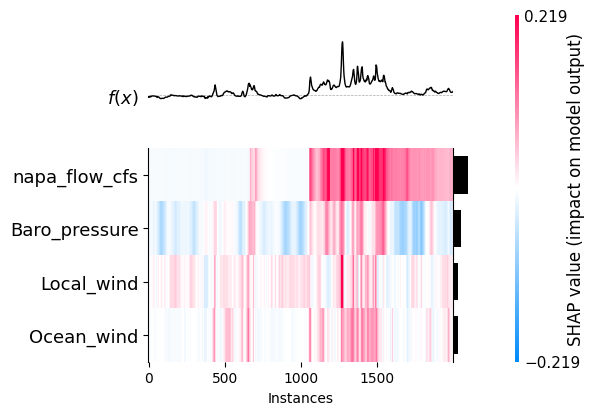

<Axes: xlabel='Instances'>

In [ ]:
y_val_indices = np.arange(1, len(y_val) )
y_val_array = np.array(y_val_indices)

y_val_array
shap.plots.heatmap(shap_values, instance_order=y_val_array)

#try plotting the bias in place of f(x)

##MLP ensemble loss function tests

In [ ]:
pip install shap

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
from pylab import date2num as d2n
import pickle
import shap
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

from datetime import  timedelta, datetime
import matplotlib.dates as mdates

from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

In [ ]:
def cal_metric(y_true, y_pred, desc):

    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse= np.sqrt(metrics.mean_squared_error(y_true, y_pred)) # or mse**(0.5)
    maxerr = metrics.max_error(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae99 = np.percentile(abs_err, 99)
    ae95 = np.percentile(abs_err, 95)

    print(desc)
    print("MAE:",'{:.4f}'.format(mae))
    print("MSE:", '{:.4f}'.format(mse))
    print("RMSE:", '{:.4f}'.format(rmse))
    print("R2:", '{:.4f}'.format(r2))
    print("MaxErr:", '{:.4f}'.format(maxerr))
    print("99p_AbsErr:", '{:.4f}'.format(ae99))
    print("95p:", '{:.4f}'.format(ae95))
    return (mae, r2, ae95)

def plot_model_forecast(X_train, X_test, X_forecast, Observed, model, title):

    y_train_predictions = model.predict(X_train)
    y_test_predictions = model.predict(X_test)
    y_forecast_predictions = model.predict(X_forecast)
    train_predictions_df =pd.DataFrame(data = y_train_predictions, index =y_train.index )
    test_predictions_df =pd.DataFrame(data = y_test_predictions, index =y_test.index )
    forecast_predictions_df =pd.DataFrame(data = y_forecast_predictions, index =X_forecast.index )


    plt.figure()
    plt.plot(Observed,'k',label = 'Observed WL residual')
    plt.plot(train_predictions_df,'.b',alpha = 0.5, label = 'Train WL residual')
    plt.plot(test_predictions_df,'.r',alpha = 0.5,label = 'Test WL residual')
    plt.plot(forecast_predictions_df,'.g',alpha = 0.5,label = 'Forecast WL residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def plot_model2(X, Observed,model ,title):

    predictions = model.predict(X)
    predictions_df =pd.DataFrame(data = predictions, index =Observed.index )

    plt.figure()
    plt.plot(Observed,'k',label = 'Observed residual')
    plt.plot(predictions_df,'.b',alpha = 0.5, label = 'Predicted residual')
    plt.ylabel('m')
    plt.title(title)
    plt.legend()

def lagcorrWL(observation, model_prediction,pred_tide, error_vec, lag):
    lagged=error_vec.shift(lag)
    prediction = model_prediction+lagged+pred_tide
    nb_na = lagged.isna().sum()# count the row that are NaN due to the shift
    thr = -0.1 # exclude the WL that is at low tide because of flat bottom WL
    maskwl = observation>thr #True where WL >thr

    y_true=observation[nb_na:].loc[maskwl]
    y_pred=prediction[nb_na:].loc[maskwl]
    #r2 = metrics.r2_score(y_true, y_pred)
    #mae = metrics.mean_absolute_error(y_true, y_pred)
    abs_err = np.abs(y_true.values-y_pred.values)
    ae95 = np.percentile(abs_err, 95)
    return ae95

def sse_loss(y_true, y_pred):
    return tf.reduce_sum(tf.square(y_true - y_pred))

def r2_loss(y_true, y_pred):
    SS_res =  tf.reduce_sum(tf.square(y_true - y_pred))
    SS_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - (1 - SS_res/(SS_tot + tf.keras.backend.epsilon()))

In [ ]:
dfX = pd.read_csv('/content/drive/MyDrive/hwy37/Input_trainingset.csv',parse_dates=[0], index_col=0)
dfY = pd.read_csv('/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv',parse_dates=[0], index_col=0)

X_df = pd.DataFrame(index = dfX.index)
# run a rolling mean with 12 window to get rid of the "fuzz"
X_df['Baro_pressure']=dfX.AtmPres.rolling(12, min_periods=1, center=True).mean()
X_df['Ocean_wind']=dfX.ocean_onshorewind.rolling(12, min_periods=1, center=True).mean()
X_df['Local_wind']=dfX.Gnoss_onshorewind.rolling(12, min_periods=1, center=True).mean()
# There is a delay between when a flow peak is observed at the flow gage and when its effect on the
# downstream water level gauge.
# The delay between Napa River flow and Novato Mouth is -3 hour
# The delay between Napa River flow and Rowland Bridge is -1 hour
# The delay between Napa River flow and Petaluma is -3 hour

lag = 0 # for now lets keep it at 0 because it create this gap between training and forecast
X_df['napa_flow_cfs'] = dfX.napa_flow_cfs.shift(lag)

# 2. Assure y and X_df are the same size and do not have NAN
# I concat them and delete any row that have NaN at the end. That assure
# we have a solid block of data with out the frayed ends or NaN at the beginning
X_df = pd.concat([X_df, dfY.residual_m], axis=1).dropna(how='any')

#corr_mat = X_df.corr()

y = X_df.residual_m
Y_df = dfY.truncate(before = X_df.index[0], after=X_df.index[-1], axis=0) # truncated version of the original WL DF

X_df = X_df.drop(columns=['residual_m'])
# X_df.info()

path_pstage = '/content/drive/MyDrive/hwy37/petaluma_wl_new.csv'
pet_stage = pd.read_csv(path_pstage)
p_stage = np.asarray(pet_stage)

path_p1hr = '/content/drive/MyDrive/hwy37/petaluma_wl_1hr.csv'
pet_stage_1hr = pd.read_csv(path_p1hr)
p_1hr = np.asarray(pet_stage_1hr)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_df[0:20000], y[0:20000], shuffle=False, test_size = 0.1)

aggregate_final_res = pd.DataFrame(index=X_val.index)
mse_list = []
degree = 3
shap_list = []

for i in range(10):
    scaler = MinMaxScaler()
    model = Sequential()
    model.add(Dense(50, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam') #sse_loss

    pipe=make_pipeline(PolynomialFeatures(degree), scaler, model)
    pipe.fit(X_train, y_train)

    hindcast_df =pd.DataFrame(index =X_train.index)
    hindcast_df['hind_res'] = pipe.predict(X_train)
    error = y_train - hindcast_df.hind_res

    win = 12 # number of points to average
    hindcast_df['err_12hr_average']= error.rolling(win, center=False).mean()

    hindcast_df['hind_res_corrected']= hindcast_df.hind_res + hindcast_df.err_12hr_average

    nb_na = hindcast_df.err_12hr_average.isna().sum()

    hindcast_df['hind_final_WL'] = Y_df.predicted + hindcast_df.hind_res_corrected + 1.2025515990257196 #mean
    hindcast_df['obs_final_WL'] = Y_df.stage_m + 1.2025515990257196 #mean
    hindcast_df['pred_tide'] = Y_df.predicted + 1.2025515990257196 #mean

    forecast = pipe.predict(X_val)
    forecast_df =pd.DataFrame(data = forecast, index =X_val.index, columns=['pred_res'] )

    correction = hindcast_df.err_12hr_average[-1] # the last
    forecast_df['pred_res_corrected'] = forecast_df.pred_res + correction

    pet_stage_1hr['datetime'] = pd.to_datetime(pet_stage_1hr['Unnamed: 0'])
    pet_stage_1hr.set_index('datetime', inplace=True)

    forecast_df['pred_tide'] = pet_stage_1hr['predicted']
    forecast_df['pred_final_WL'] = forecast_df.pred_res_corrected  + forecast_df.pred_tide

    aggregate_final_res['pred_res_'+str(i)] = forecast_df['pred_res_corrected']

    mse = mean_squared_error(y_val, forecast_df['pred_res_corrected'])
    mse_list.append(mse)
    print(f"Mean Squared Error: {mse}")

    # Fits the explainer
    #explainer = shap.Explainer(pipe.predict , X_train)
    # Calculates the SHAP values - It takes some time
    #shap_values = explainer(X_val)
    #shap_list.append(shap_values)

    #plt.figure(figsize=(10, 6))
    #plt.plot(y_val, label='Actual')
    #plt.plot(forecast_df['pred_res_corrected'], label='Predicted')
    #plt.xlabel('Date')
    #plt.ylabel('Residual water level')
    #plt.title('MLP with hindcast')
    #plt.legend()
    #plt.show()

563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0077
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


Mean Squared Error: 0.004398941855530886


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0119
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


Mean Squared Error: 0.018990171350062972


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


Mean Squared Error: 0.005005071586356756
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0075
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWar

Mean Squared Error: 0.008646536800888813
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0070
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.004239579277887482
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0070
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.026503531477692882
563/563 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0085
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.012313221561263066
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0085
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.005117516800243745
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0081
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.013902104492408427
563/563 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0071
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
<ipython-input-29-b1dd8298100c>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  correction = hindcast_df.err_12hr_average[-1] # the last


Mean Squared Error: 0.010061516698260331


Overall Mean Squared Error: 0.010917819190059536


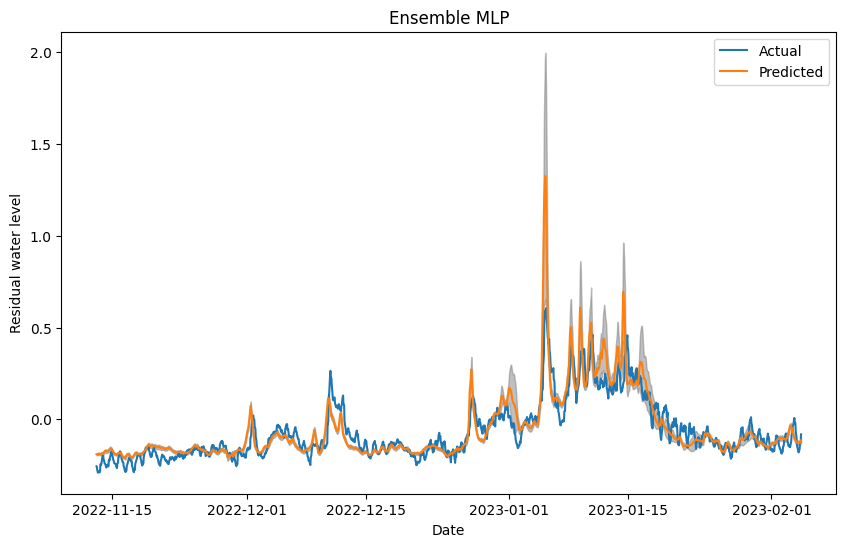

In [ ]:
overall_mse = np.mean(mse_list)
print(f"Overall Mean Squared Error: {overall_mse}")

aggregate_final_res['pred_res_mean'] = aggregate_final_res.iloc[:, :10].mean(axis=1)
aggregate_final_res['std_dev'] = aggregate_final_res.iloc[:, :10].std(axis=1)
upper_bound = aggregate_final_res['pred_res_mean'] + aggregate_final_res['std_dev']
lower_bound = aggregate_final_res['pred_res_mean'] - aggregate_final_res['std_dev']

plt.figure(figsize=(10, 6))
plt.plot(y_val, label='Actual')
plt.plot(aggregate_final_res['pred_res_mean'], label='Predicted')
plt.fill_between(y_val.index, upper_bound, lower_bound, color='gray', alpha=0.5)
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.legend()
plt.title('Ensemble MLP')
plt.show()

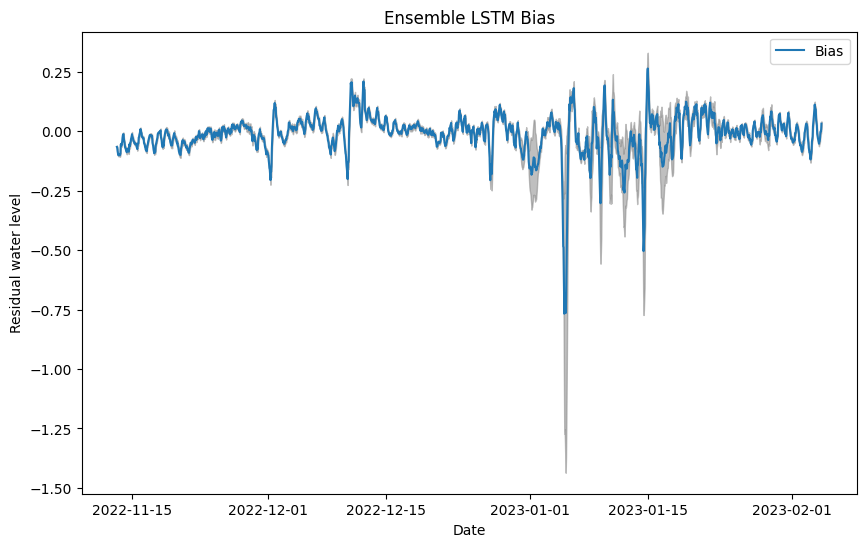

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_val - aggregate_final_res['pred_res_mean'], label='Bias')
upper_bound = y_val - aggregate_final_res['pred_res_mean'] + aggregate_final_res['std_dev']
lower_bound = y_val - aggregate_final_res['pred_res_mean'] - aggregate_final_res['std_dev']
plt.fill_between(dfY_test.index[(2000 - X_val.shape[0]):2000], upper_bound, lower_bound, color='gray', alpha=0.5)

plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('Ensemble LSTM Bias')
plt.legend()

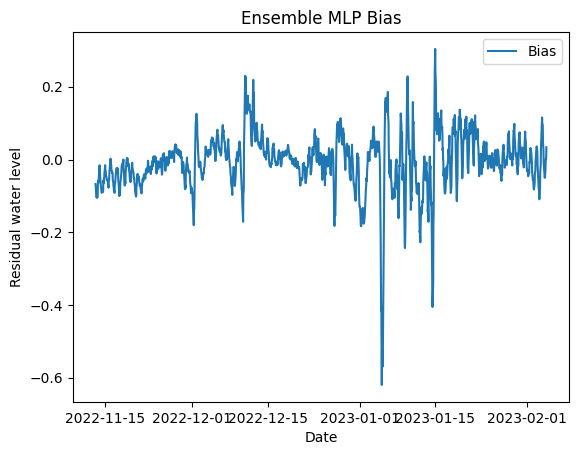

In [ ]:
plt.plot(y_val - aggregate_final_res['pred_res_mean'], label='Bias')
plt.xlabel('Date')
plt.ylabel('Residual water level')
plt.title('Ensemble MLP Bias')
plt.legend()

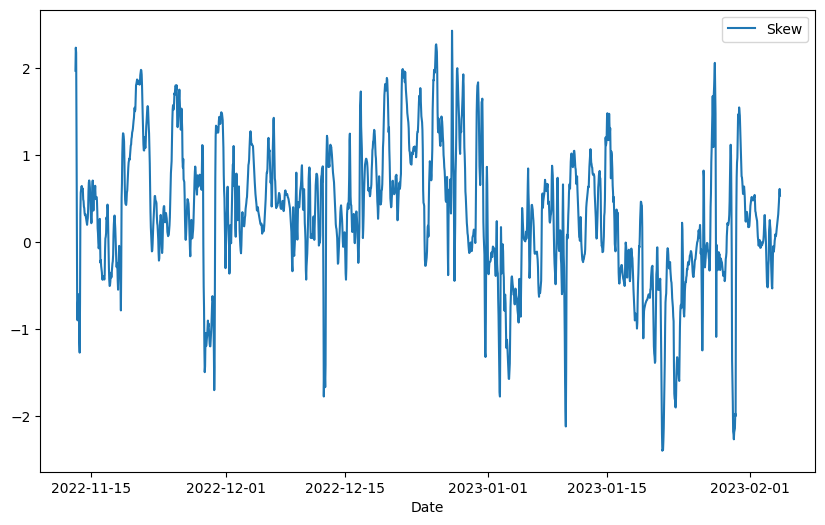

In [ ]:
aggregate_final_res['pred_res_skew'] = aggregate_final_res.iloc[:, :10].skew(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_skew'], label='Skew')
plt.xlabel('Date')
plt.legend()

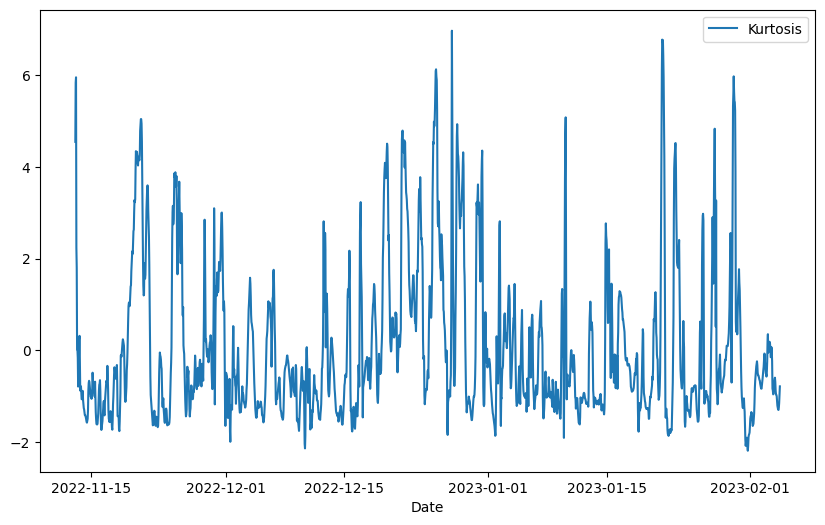

In [ ]:
aggregate_final_res['pred_res_skew'] = aggregate_final_res.iloc[:, :10].kurtosis(axis = 1)

plt.figure(figsize=(10, 6))
plt.plot(aggregate_final_res['pred_res_skew'], label='Kurtosis')
plt.xlabel('Date')
plt.legend()

#Bottom